In [1]:
from pathlib import Path
import sys

_here = Path.cwd().resolve()
_candidates = (_here, *_here.parents)
REPO_ROOT = next((candidate for candidate in _candidates if (candidate / "m33_pipeline").is_dir()), None)
if REPO_ROOT is None:
    raise RuntimeError(f"Could not locate repo root from {Path.cwd()}")
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from m33_pipeline.notebook_setup import prepare_notebook

REPO_ROOT = prepare_notebook(REPO_ROOT)
print(f"Notebook working directory set to: {REPO_ROOT}")

Notebook working directory set to: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1


# Plot catalog properties
Make all the plots showing the HII region properties, one the catalog has already been built.

In [2]:
import numpy as np
import pandas as pd
from pathlib import Path
from astropy.io import fits
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as c
import pyneb as pn
import matplotlib.pyplot as plt
HAS_PYNEB=True
from astropy.coordinates import SkyCoord, SkyOffsetFrame
from scipy.stats import linregress
from astropy.visualization import AsinhStretch, PercentileInterval
from skimage.segmentation import find_boundaries
from matplotlib import cm
from skimage.measure import find_contours
from matplotlib.patches import ConnectionPatch
from scipy.optimize import curve_fit
import os
import shutil
import re
import matplotlib as mpl
import seaborn as sns

from m33_pipeline.reporting import (
    add_fit_values,
    add_duplicate_region_values,
    add_halpha_flux_partition_values,
    build_catalog_number_values,
    format_value,
    load_snr_catalog,
    load_wr_catalog,
    write_latex_commands,
)
from m33_pipeline.planetary_nebulae import crossmatch_pne_to_hii_boundaries

plt.rcParams.update({
    "font.family": "serif",
    "mathtext.fontset": "cm",
    "axes.linewidth": 1.5,
    "xtick.direction": "in",
    "ytick.direction": "in",
})

plt.rcParams["text.usetex"] = False

plt.rc('text', usetex=False)
plt.rc('font', family='serif', size=20)

plt.rc('xtick', direction='in', top=True)
plt.rc('ytick', direction='in', right=True)
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.visible'] = True

from m33_pipeline import paths


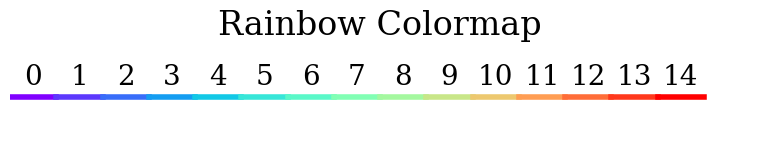

In [3]:
#make a list of 15 evenly spaced colours from the rainbow cmap to be used in all plots
cmap = plt.get_cmap('rainbow')
colors = [cmap(i) for i in np.linspace(0, 1, 15)]
#show the colours
plt.figure(figsize=(8, 2))
for i, color in enumerate(colors):
    plt.plot([i, i + 1], [0, 0], color=color, lw=4)
#label each colour with its index
for i in range(len(colors)):
    plt.text(i + 0.5, 0.1, str(i), ha='center', va='bottom')
plt.xlim(0, len(colors) + 1)
plt.ylim(-1, 1)
plt.axis('off')
plt.title('Rainbow Colormap')
plt.tight_layout()

# Shared plot colors. Non-metallicity catalog-property plots use the green-to-red
# part of rainbow; metallicity plots use a separate blue-purple rainbow slice.
property_cmap = plt.get_cmap('rainbow')
property_color_positions = {
    'sum_A_V': 0.38,
    'L_Ha_sum_dered': 0.52,
    'ne_SII_cm3': 0.66,
    'logU_KK04': 0.76,
    'log_P_thermal_SII_over_k': 0.86,
    'radius_areaeq_pc': 0.94,
}
color_dic = {key: property_cmap(pos) for key, pos in property_color_positions.items()}
lf_comparison_colors = {
    'pre_dig': property_cmap(0.48),
    'dig_corrected': color_dic['L_Ha_sum_dered'],
}



In [4]:
# load in the latest HII region catalog
catalog_method = 'summed_map'  # options: integrated_spectrum, summed_map
catalog_dig_mode = 'dig_subtracted'  # options: dig_subtracted, no_dig
catalog_variant = 'combined'  # options: combined, metallicity, ionization_parameter, density, other_derived, clustering
primary_only = True
field_catalog_pattern = f"flux_catalogs/{catalog_method}/{catalog_dig_mode}/flux_catalog_{{FIELD}}.csv"

plot_root = Path("PAPER_PLOTS") / catalog_method / catalog_dig_mode
plot_root.mkdir(parents=True, exist_ok=True)

def paper_plot_path(filename, subdir=None):
    outdir = plot_root if subdir is None else plot_root / subdir
    outdir.mkdir(parents=True, exist_ok=True)
    return outdir / filename

def resolve_catalog_path(method, dig_mode, variant):
    base_dir = Path("CATALOGS") / "flux_catalogs" / method / dig_mode
    if variant == "combined":
        if hasattr(paths, "combined_catalog_csv"):
            return paths.combined_catalog_csv(method=method, dig_mode=dig_mode)
        return base_dir / "total_flux_catalog_combined.csv"
    if variant == "clustering":
        if hasattr(paths, "derived_catalog_csv"):
            return paths.derived_catalog_csv("clustering", method=method, dig_mode=dig_mode)
        return base_dir / "derived" / "total_flux_catalog_clustering.csv"
    if hasattr(paths, "derived_catalog_csv"):
        return paths.derived_catalog_csv(variant, method=method, dig_mode=dig_mode)
    return base_dir / "derived" / f"total_flux_catalog_{variant}.csv"

def load_catalog_with_field_fallback(method, dig_mode, variant):
    """Load the requested total catalog, or concatenate the available field catalogs."""
    cat_path = resolve_catalog_path(method, dig_mode, variant)
    if cat_path.exists():
        return pd.read_csv(cat_path), str(cat_path)

    base_dir = Path("CATALOGS") / "flux_catalogs" / method / dig_mode
    field_paths = sorted(base_dir.glob("flux_catalog_*.csv"))
    if not field_paths:
        raise FileNotFoundError(
            f"Could not find {cat_path} or any field catalogs in {base_dir}"
        )

    field_catalogs = []
    for field_path in field_paths:
        field_cat = pd.read_csv(field_path)
        if "field" not in field_cat.columns:
            field_cat["field"] = field_path.stem.removeprefix("flux_catalog_")
        field_catalogs.append(field_cat)

    source = f"{len(field_paths)} available field catalog(s) from {base_dir}"
    return pd.concat(field_catalogs, ignore_index=True, sort=False), source

cat, cat_source = load_catalog_with_field_fallback(catalog_method, catalog_dig_mode, catalog_variant)
cat_before_primary_filter = cat.copy()
pn_catalog_path = Path('CATALOGS/planetary_nebulae/M33_PNe_combined_deduplicated.csv')
if pn_catalog_path.exists():
    pn_catalog = pd.read_csv(pn_catalog_path)
    pn_hii_matches, cat = crossmatch_pne_to_hii_boundaries(cat, pn_catalog)
    pn_match_path = Path('CATALOGS/planetary_nebulae/M33_PNe_HII_region_crossmatch.csv')
    pn_match_path.parent.mkdir(parents=True, exist_ok=True)
    pn_hii_matches.to_csv(pn_match_path, index=False)
    pn_derived_path = Path('CATALOGS/flux_catalogs') / catalog_method / catalog_dig_mode / 'derived' / 'total_flux_catalog_pn_crossmatch.csv'
    pn_derived_path.parent.mkdir(parents=True, exist_ok=True)
    cat.to_csv(pn_derived_path, index=False)
    print(f'PN boundary crossmatch: {cat["has_pn_in_boundary"].sum()} HII regions contain at least one PN.')
else:
    pn_catalog = pd.DataFrame()
    print(f'PN catalog not found: {pn_catalog_path}')
if primary_only and 'primary' in cat.columns:
    n_before = len(cat)
    n_non_primary = int((~cat['primary'].fillna(True)).sum())
    cat = cat.loc[cat['primary'].fillna(True)].copy().reset_index(drop=True)
    print(f"Primary-only filtering enabled: removed {n_non_primary} non-primary duplicate rows; {len(cat)} / {n_before} rows kept.")
elif primary_only:
    print("Primary-only filtering requested, but no 'primary' column exists in this catalog.")
print(f"Catalog loaded from {cat_source} with {len(cat.columns)} columns.")
print(f"Plots will be saved under {plot_root}")
for col in cat.columns:
    print(col)


PN boundary crossmatch: 83 HII regions contain at least one PN.
Primary-only filtering enabled: removed 26 non-primary duplicate rows; 6397 / 6423 rows kept.
Catalog loaded from /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/CATALOGS/flux_catalogs/summed_map/dig_subtracted/total_flux_catalog_combined.csv with 374 columns.
Plots will be saved under PAPER_PLOTS/summed_map/dig_subtracted
region_id
npix_region
npix_dig_annulus
dig_halpha_anchor
dig_halpha_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
F_Halpha_sum_digsub
F_Halpha_e_sum_digsub
SNR_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
F_Hbeta_sum_digsub
F_Hbeta_e_sum_digsub
SNR_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_mad


In [5]:
# save the catalog to a latex table

In [6]:
# load in the WR and SNR catalogs
wr_catalog = load_wr_catalog()
snr_catalog = load_snr_catalog()


In [7]:
# Initialize values that will be extended with fit results later in the notebook.
values, formats = build_catalog_number_values(cat, snr_cut=3)
add_duplicate_region_values(values, cat_before_primary_filter)
if {'has_snr_in_boundary', 'has_wr_in_boundary'}.issubset(cat.columns):
    snr_hosts = cat['has_snr_in_boundary'].fillna(False).astype(bool)
    wr_hosts = cat['has_wr_in_boundary'].fillna(False).astype(bool)
    values['nRegionsContainingSNR'] = int(snr_hosts.sum())
    values['nRegionsContainingWR'] = int(wr_hosts.sum())
    values['nRegionsContainingSNRAndWR'] = int((snr_hosts & wr_hosts).sum())
    values['nRegionsContainingSNROrWR'] = int((snr_hosts | wr_hosts).sum())
if 'n_pn_in_boundary' in cat.columns:
    values['nCrossMatchedPN'] = int(pd.to_numeric(cat['n_pn_in_boundary'], errors='coerce').fillna(0).sum())
radial_gradient_fit_results = {}

print("\nCatalog and peak-removal commands initialized:")
for k in values:
    print(f"\\{k} = {format_value(values[k], formats.get(k))}")



Catalog and peak-removal commands initialized:
\nregions = 6397
\nstarforming = 4476
\ncomposite = 499
\nagn = 469
\nUnclassified = 953
\nregionssnrthree = 4340
\nStarformingSNRThree = 3610
\nCompositeSNRThree = 439
\nAgnSNRThree = 291
\nregionsdensity = 3141
\nRegionsContainingSNR = 52
\nRegionsContainingWR = 23
\nRegionsContainingSNRAndWR = 3
\nRegionsContainingSNROrWR = 72
\nRegionsContainingPN = 82
\nCrossMatchedPN = 84
\nlogLHa = 5904
\medianlogLHa = 35.88
\pfivelogLHa = 34.89
\psixteenlogLHa = 35.30
\ptwentyfivelogLHa = 35.48
\pseventyfivelogLHa = 36.33
\peightyfourlogLHa = 36.57
\pninetyfivelogLHa = 37.10
\minlogLHa = 31.29
\maxlogLHa = 40.80
\nradiuspfifty = 6397
\medianradiuspfifty = 10.68
\pfiveradiuspfifty = 5.27
\psixteenradiuspfifty = 7.66
\ptwentyfiveradiuspfifty = 8.23
\pseventyfiveradiuspfifty = 13.62
\peightyfourradiuspfifty = 15.45
\pninetyfiveradiuspfifty = 19.30
\minradiuspfifty = 2.58
\maxradiuspfifty = 40.10
\nradiuspsixteen = 6397
\medianradiuspsixteen = 7.91
\p

In [8]:

# Functions to plot each map with boundaries colored by BPT class, and WR/SNR locations overlaid.

def field_to_fieldnum(field_label: str) -> str:
    """
    Map your plot field labels to WR catalog Field codes.
    Input examples: 'NE','NW','SE','SW','F5'...'F9'
    Output: 'F1'...'F9'
    """
    mapping = {"NE": "F1", "NW": "F2", "SE": "F3", "SW": "F4"}
    return mapping.get(field_label, field_label)  # F5->F5 etc.


def parse_name_to_coords(name: str) -> SkyCoord:
    # Example: 'J013307.80+302951.1'
    ra_h = name[1:3]
    ra_m = name[3:5]
    ra_s = name[5:10]
    dec_sign = name[10]
    dec_d = name[11:13]
    dec_m = name[13:15]
    dec_s = name[15:]
    ra_str = f"{ra_h}h{ra_m}m{ra_s}s"
    dec_str = f"{dec_sign}{dec_d}d{dec_m}m{dec_s}s"
    return SkyCoord(ra_str, dec_str, frame="icrs")

# ha_fits_path = "M33_Halpha.fits"
def load_halpha_log_and_wcs(wcs: str):
    with fits.open(wcs) as hdul:
        data = hdul[0].data
        hdr = hdul[0].header

    data = np.where(np.isfinite(data), data, np.nan)

    with np.errstate(divide="ignore", invalid="ignore"):
        ha_log = np.log10(data)
    ha_log = np.where(np.isfinite(ha_log), ha_log, np.nan)

    wcs = WCS(hdr)
    return ha_log, wcs


def try_load_boundary_map(field_label: str, boundary_dir="boundary_map"):
    """
    Tries boundary_map/Boundary_map_{FIELD}.fits where FIELD is e.g. NE, NW, SE, SW, F5...
    Returns array or None if missing/unreadable.
    """
    path = os.path.join(boundary_dir, f"Boundary_map_{field_label}.fits")
    if not os.path.exists(path):
        return None
    try:
        return fits.getdata(path)
    except Exception:
        return None


def get_wr_pixels_for_field(wr_catalog: pd.DataFrame, field_num: str, wcs: WCS):
    wr_field = wr_catalog[wr_catalog["Field"] == field_num]
    if len(wr_field) == 0:
        return np.array([]), np.array([])

    coords = [parse_name_to_coords(n) for n in wr_field["Name (star)"]]
    sky = SkyCoord(coords)
    x_wr, y_wr = wcs.world_to_pixel(sky)
    return np.array(x_wr), np.array(y_wr)


def get_snr_pixels_for_field(snr_catalog: pd.DataFrame, wcs: WCS, xlim=(50, 2000), ylim=(50, 2000)):
    """
    Your snr_table.csv loaded with pd.read_csv.
    This assumes columns named exactly 'RA' and 'Dec' OR 'Dec'/'DEC' variants.
    """
    # Be forgiving about Dec column name
    if "Dec" in snr_catalog.columns:
        dec_col = "Dec"
    elif "DEC" in snr_catalog.columns:
        dec_col = "DEC"
    elif "dec" in snr_catalog.columns:
        dec_col = "dec"
    else:
        raise KeyError("SNR catalog must have a Dec/DEC column (plus RA).")

    if "RA" not in snr_catalog.columns:
        raise KeyError("SNR catalog must have an 'RA' column.")

    coords = SkyCoord(snr_catalog["RA"].astype(str),
                      snr_catalog[dec_col].astype(str),
                      unit=(u.hourangle, u.deg))

    x_snr, y_snr = wcs.world_to_pixel(coords)
    x_snr = np.array(x_snr)
    y_snr = np.array(y_snr)

    in_field = (x_snr > xlim[0]) & (x_snr < xlim[1]) & (y_snr > ylim[0]) & (y_snr < ylim[1])
    return x_snr[in_field], y_snr[in_field]


def get_pn_pixels_for_field(pn_catalog: pd.DataFrame, wcs: WCS, xlim=(50, 2000), ylim=(50, 2000)):
    """Return all catalogued PN positions that fall inside the field image limits."""
    if pn_catalog is None or len(pn_catalog) == 0:
        return np.array([]), np.array([])
    if {"RA_deg", "Dec_deg"}.issubset(pn_catalog.columns):
        coords = SkyCoord(
            pn_catalog["RA_deg"].to_numpy(dtype=float) * u.deg,
            pn_catalog["Dec_deg"].to_numpy(dtype=float) * u.deg,
            frame="icrs",
        )
    elif {"RA", "Dec"}.issubset(pn_catalog.columns):
        coords = SkyCoord(pn_catalog["RA"].astype(str), pn_catalog["Dec"].astype(str), unit=(u.hourangle, u.deg))
    else:
        raise KeyError("PN catalog must have RA_deg/Dec_deg or RA/Dec columns.")

    x_pn, y_pn = wcs.world_to_pixel(coords)
    x_pn = np.array(x_pn)
    y_pn = np.array(y_pn)
    in_field = (x_pn > xlim[0]) & (x_pn < xlim[1]) & (y_pn > ylim[0]) & (y_pn < ylim[1])
    return x_pn[in_field], y_pn[in_field]


def _first_existing_path(paths):
    for p in paths:
        if p and os.path.exists(p):
            return p
    return None


def _clean_bpt_class(val):
    if pd.isna(val):
        return "Unclassified"
    val = str(val).strip()
    if val == "" or val.lower() == "nan":
        return "Unclassified"
    return val


def _load_image_and_wcs_separately(image_path, wcs_path=None):
    """
    Load image data from image_path and WCS from wcs_path.
    If wcs_path is None, use the image header for WCS too.
    """
    image_data = np.squeeze(fits.getdata(image_path)).astype(float)

    if wcs_path is None:
        wcs_header = fits.getheader(image_path)
    else:
        wcs_header = fits.getheader(wcs_path)

    wcs = WCS(wcs_header)
    return image_data, wcs


def _safe_log10_image(data):
    """
    Take log10 safely: non-positive values become NaN.
    """
    out = np.full_like(data, np.nan, dtype=float)
    good = np.isfinite(data) & (data > 0)
    out[good] = np.log10(data[good])
    return out


def _plot_bpt_boundaries_fast(
    ax,
    label_map,
    catalog,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    lw=0.5,
    alpha=0.9,
    zorder=3,
    valid_mask=None,
):
    """
    Faster boundary plotting:
    group region IDs by BPT class, then contour once per class.
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)

    if catalog is None:
        ax.contour(
            (label_int > 0).astype(float),
            levels=[0.5],
            colors="k",
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )
        return

    if region_id_col not in catalog.columns:
        raise ValueError(f"'{region_id_col}' not found in catalog columns")
    if bpt_col not in catalog.columns:
        raise ValueError(f"'{bpt_col}' not found in catalog columns")

    cat = catalog.copy()
    cat[region_id_col] = pd.to_numeric(cat[region_id_col], errors="coerce")
    cat = cat.dropna(subset=[region_id_col])
    cat[region_id_col] = cat[region_id_col].astype(int)
    cat[bpt_col] = cat[bpt_col].apply(_clean_bpt_class)

    present_ids = set(np.unique(label_int))

    class_to_region_ids = {}
    for _, row in cat.iterrows():
        rid = row[region_id_col]
        if rid not in present_ids:
            continue
        bpt_class = row[bpt_col]
        class_to_region_ids.setdefault(bpt_class, []).append(rid)

    for bpt_class, region_ids in class_to_region_ids.items():
        if not region_ids:
            continue

        mask = np.isin(label_int, region_ids)
        if not np.any(mask):
            continue

        color = class_colors.get(bpt_class, class_colors["Unclassified"])
        #if BPT class is not star forming, make lw=1.0 and alpha=1.0 for better visibility
        if bpt_class != "Star-forming":
            lw = 1.0
            alpha = 1.0
            
        ax.contour(
            mask.astype(float),
            levels=[0.5],
            colors=[color],
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )


def _plot_wr_snr_region_boundaries_fast(
    ax,
    label_map,
    catalog,
    region_id_col='region_id',
    wr_flag_col='has_wr_in_boundary',
    snr_flag_col='has_snr_in_boundary',
    pn_flag_col='has_pn_in_boundary',
    other_color='0.65',
    wr_color='darkviolet',
    snr_color='darkorange',
    both_color='crimson',
    pn_color='royalblue',
    lw=0.45,
    alpha=0.9,
    zorder=3,
):
    """Color region boundaries by whether they contain SNRs or WR stars."""
    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)
    required = {region_id_col, wr_flag_col, snr_flag_col}
    missing = sorted(required.difference(catalog.columns))
    if missing:
        raise KeyError(f'Missing WR/SNR boundary columns: {missing}')

    cat = catalog.copy()
    cat[region_id_col] = pd.to_numeric(cat[region_id_col], errors='coerce')
    cat = cat.dropna(subset=[region_id_col])
    cat[region_id_col] = cat[region_id_col].astype(int)
    wr = cat[wr_flag_col].fillna(False).astype(bool)
    snr = cat[snr_flag_col].fillna(False).astype(bool)
    groups = [
        (~wr & ~snr, other_color, lw, 'Other region'),
        (snr & ~wr, snr_color, 1.6, 'Contains SNR'),
        (wr & ~snr, wr_color, 1.8, 'Contains WR star'),
        (wr & snr, both_color, 2.2, 'Contains SNR and WR star'),
    ]
    for select, color, group_lw, _ in groups:
        region_ids = cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if np.any(mask):
            ax.contour(
                mask.astype(float), levels=[0.5], colors=[color],
                linewidths=group_lw, alpha=alpha, origin='lower',
                zorder=zorder + (1 if group_lw > lw else 0),
            )
    if pn_flag_col in cat.columns:
        pn = cat[pn_flag_col].fillna(False).astype(bool)
        pn_region_ids = cat.loc[pn, region_id_col].to_numpy(dtype=int)
        pn_mask = np.isin(label_int, pn_region_ids)
        if np.any(pn_mask):
            ax.contour(
                pn_mask.astype(float), levels=[0.5], colors=[pn_color],
                linewidths=0.6, alpha=1.0, origin='lower', zorder=zorder + 3,
            )


def plot_m33_field_bpt(
    fld,
    ha_dir,
    ha_filename_pattern,
    catalog_dir,
    catalog_pattern,
    boundary_dir,
    boundary_pattern,
    wcs_pattern=None,
    xlim=(50, 2000),
    ylim=(50, 2000),
    savepath=None,
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18.5,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_lw=0.4,
    boundary_alpha=0.9,
    field_label_fontsize=20,
    field_label_box_fc="grey",
    field_label_box_alpha=0.8,
    plot_wr=True,
    plot_snr=True,
    plot_pn=False,
    wr_color="lime",
    snr_color="orange",
    pn_color="royalblue",
    figsize=(8, 8),
    show_legend=True,
    boundary_color_mode='bpt',
    wr_region_color='darkviolet',
    snr_region_color='darkorange',
    both_region_color='crimson',
    other_region_color='0.65',
    pn_region_color='royalblue',
    pn_catalog=None,
    combined_catalog=None,
):
    """
    Plot a single field and save it, explicitly using:
      - Ha+OIII file for the image
      - Halpha/WCS file for the WCS
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    fld_numeric = fld[1:] if fld.startswith("F") else None

    ha_candidates = [
        os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld)),
        os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    ha_path = _first_existing_path(ha_candidates)
    if ha_path is None:
        raise FileNotFoundError(f"Could not find Ha+OIII map for field {fld}")

    if wcs_pattern is None:
        wcs_path = ha_path
    else:
        wcs_candidates = [
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        wcs_path = _first_existing_path(wcs_candidates)
        if wcs_path is None:
            raise FileNotFoundError(f"Could not find WCS file for field {fld}")

    cat_candidates = [
        os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld)),
        os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    cat_path = _first_existing_path(cat_candidates)
    if cat_path is None:
        raise FileNotFoundError(f"Could not find catalog for field {fld}")

    bnd_candidates = [
        os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld)),
        os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    bnd_path = _first_existing_path(bnd_candidates)
    if bnd_path is None:
        raise FileNotFoundError(f"Could not find boundary map for field {fld}")

    # --------------------------------------------------
    # CORRECTED PART:
    # image comes from Ha+OIII file
    # WCS comes from WCS file
    # --------------------------------------------------
    haoiii_data, wcs = _load_image_and_wcs_separately(ha_path, wcs_path)
    ha_log = _safe_log10_image(haoiii_data)

    catalog_processed = pd.read_csv(cat_path)
    if boundary_color_mode == 'wr_snr' and combined_catalog is not None:
        catalog_processed = combined_catalog.loc[combined_catalog['field'] == fld].copy()
    bnd_map = fits.getdata(bnd_path)

    fig, ax = plt.subplots(1, 1, figsize=figsize)

    cmap = cmap.copy()
    cmap.set_bad(color="white")

    im = ax.imshow(
        ha_log,
        origin="lower",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        aspect="equal",
    )

    if boundary_color_mode == 'wr_snr':
        _plot_wr_snr_region_boundaries_fast(
            ax=ax, label_map=bnd_map, catalog=catalog_processed,
            region_id_col=region_id_col, other_color=other_region_color,
            wr_color=wr_region_color, snr_color=snr_region_color,
            both_color=both_region_color, lw=boundary_lw,
            pn_color=pn_region_color,
            alpha=boundary_alpha, zorder=3,
        )
    else:
        _plot_bpt_boundaries_fast(
            ax=ax,
            label_map=bnd_map,
            catalog=catalog_processed,
            region_id_col=region_id_col,
            bpt_col=bpt_col,
            class_colors=class_colors,
            lw=boundary_lw,
            alpha=boundary_alpha,
            zorder=3,
        )

    if plot_wr:
        field_num = field_to_fieldnum(fld)
        x_wr, y_wr = get_wr_pixels_for_field(wr_catalog, field_num, wcs)
        if x_wr.size:
            ax.scatter(
                x_wr, y_wr,
                marker="*",
                s=50,
                color=wr_color,
                edgecolor="black",
                linewidth=0.8,
                zorder=5,
            )

    if plot_snr:
        x_snr, y_snr = get_snr_pixels_for_field(snr_catalog, wcs, xlim=xlim, ylim=ylim)
        if x_snr.size:
            ax.scatter(
                x_snr, y_snr,
                marker="o",
                s=10,
                facecolors=snr_color,
                edgecolor="black",
                zorder=5,
            )

    if plot_pn:
        x_pn, y_pn = get_pn_pixels_for_field(pn_catalog, wcs, xlim=xlim, ylim=ylim)
        if x_pn.size:
            ax.scatter(
                x_pn, y_pn,
                marker="P",
                s=28,
                facecolors=pn_color,
                edgecolor="black",
                linewidth=0.7,
                zorder=6,
            )

    ax.text(
        0.03, 0.97, fld,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=field_label_fontsize,
        color="k",
        bbox=dict(
            facecolor=field_label_box_fc,
            alpha=field_label_box_alpha,
            edgecolor="none",
            pad=3,
        ),
    )

    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2.0)
        spine.set_edgecolor("black")

    cbar = fig.colorbar(im, ax=ax, orientation="horizontal", fraction=0.05, pad=0.04)
    cbar.set_label(r"$\log_{10}$(H$\alpha$ + [OIII] amplitude)", fontsize=14)

    if show_legend:
        if boundary_color_mode == 'wr_snr':
            legend_handles = [
                plt.Line2D([0], [0], color=other_region_color, lw=2, label='Other region'),
                plt.Line2D([0], [0], color=snr_region_color, lw=2, label='Region contains SNR'),
                plt.Line2D([0], [0], color=wr_region_color, lw=2, label='Region contains WR star'),
                plt.Line2D([0], [0], color=both_region_color, lw=2, label='Region contains both'),
                plt.Line2D([0], [0], color=pn_region_color, lw=2.6, label='Region contains PN'),
            ]
        else:
            legend_handles = [
                plt.Line2D([0], [0], color=class_colors["Star-forming"], lw=2, label="Star-forming"),
                plt.Line2D([0], [0], color=class_colors["Composite"], lw=2, label="Composite"),
                plt.Line2D([0], [0], color=class_colors["AGN/Shock"], lw=2, label="AGN/Shock"),
                plt.Line2D([0], [0], color=class_colors["Unclassified"], lw=2, label="Unclassified"),
            ]

        if plot_wr:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="*",
                    linestyle="None",
                    markerfacecolor=wr_color,
                    markeredgecolor="black",
                    markersize=8,
                    label="WR Stars",
                )
            )

        if plot_snr:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="o",
                    linestyle="None",
                    markerfacecolor=snr_color,
                    markeredgecolor="black",
                    markersize=6,
                    label="SNRs",
                )
            )

        if plot_pn:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="P",
                    linestyle="None",
                    markerfacecolor=pn_color,
                    markeredgecolor="black",
                    markersize=7,
                    label="PNe",
                )
            )

        ax.legend(handles=legend_handles, loc="lower right", frameon=True, fontsize=10)

    if savepath is not None:
        save_dir = os.path.dirname(savepath)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(savepath, dpi=300, facecolor="white", bbox_inches="tight")

    plt.close()


def plot_all_m33_fields_separately(
    field_order,
    output_dir,
    ha_dir,
    ha_filename_pattern,
    catalog_dir,
    catalog_pattern,
    boundary_dir,
    boundary_pattern,
    wcs_pattern=None,
    xlim=(50, 2000),
    ylim=(50, 2000),
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18.5,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_lw=0.4,
    boundary_alpha=0.9,
    plot_wr=True,
    plot_snr=True,
    plot_pn=False,
    wr_color="lime",
    snr_color="orange",
    pn_color="royalblue",
    figsize=(8, 8),
    filetype="pdf",
    skip_missing=True,
    boundary_color_mode='bpt',
    wr_region_color='darkviolet',
    snr_region_color='darkorange',
    both_region_color='crimson',
    other_region_color='0.65',
    pn_region_color='royalblue',
    filename_suffix='BPT_overlay',
    pn_catalog=None,
    combined_catalog=None,
):
    os.makedirs(output_dir, exist_ok=True)

    plotted_fields = []
    skipped_fields = {}
    for fld in field_order:
        print(f"Plotting {fld}...")
        savepath = os.path.join(output_dir, f"M33_{fld}_{filename_suffix}.{filetype}")

        try:
            plot_m33_field_bpt(
                fld=fld,
                ha_dir=ha_dir,
                ha_filename_pattern=ha_filename_pattern,
                catalog_dir=catalog_dir,
                catalog_pattern=catalog_pattern,
                boundary_dir=boundary_dir,
                boundary_pattern=boundary_pattern,
                wcs_pattern=wcs_pattern,
                xlim=xlim,
                ylim=ylim,
                savepath=savepath,
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
                region_id_col=region_id_col,
                bpt_col=bpt_col,
                class_colors=class_colors,
                boundary_lw=boundary_lw,
                boundary_alpha=boundary_alpha,
                plot_wr=plot_wr,
                plot_snr=plot_snr,
                plot_pn=plot_pn,
                wr_color=wr_color,
                snr_color=snr_color,
                pn_color=pn_color,
                figsize=figsize,
                show_legend=True,
                boundary_color_mode=boundary_color_mode,
                wr_region_color=wr_region_color,
                snr_region_color=snr_region_color,
                both_region_color=both_region_color,
                other_region_color=other_region_color,
                pn_region_color=pn_region_color,
                pn_catalog=pn_catalog,
                combined_catalog=combined_catalog,
            )
        except FileNotFoundError as exc:
            if not skip_missing:
                raise
            skipped_fields[fld] = str(exc)
            print(f"Skipping {fld}: {exc}")
            continue
        plotted_fields.append(fld)

    print(f"Plotted {len(plotted_fields)} available field(s): {plotted_fields}")
    if skipped_fields:
        print(f"Skipped {len(skipped_fields)} unavailable field(s): {list(skipped_fields)}")
    return plotted_fields, skipped_fields


def _plot_mask_contours_in_mosaic(
    ax,
    mask,
    field_wcs,
    mosaic_wcs,
    color='k',
    lw=0.35,
    alpha=0.85,
    zorder=3,
):
    """Find contours in a field image and plot them in mosaic pixel coordinates."""
    for contour in find_contours(mask.astype(float), 0.5):
        if len(contour) < 3:
            continue
        y_field = contour[:, 0]
        x_field = contour[:, 1]
        sky = field_wcs.pixel_to_world(x_field, y_field)
        x_mosaic, y_mosaic = mosaic_wcs.world_to_pixel(sky)
        good = np.isfinite(x_mosaic) & np.isfinite(y_mosaic)
        if np.sum(good) < 3:
            continue
        ax.plot(
            x_mosaic[good],
            y_mosaic[good],
            color=color,
            lw=lw,
            alpha=alpha,
            zorder=zorder,
        )


def _catalog_field_subset(catalog, field):
    if catalog is None or 'field' not in catalog.columns:
        return pd.DataFrame()
    return catalog.loc[catalog['field'].astype(str) == str(field)].copy()


def _field_valid_pixel_mask(shape, field_valid_bounds=(50, 2000, 50, 2000), field_edge_margin=None):
    ny, nx = shape
    if field_valid_bounds is not None:
        x0, x1, y0, y1 = field_valid_bounds
    else:
        margin = 50 if field_edge_margin is None else field_edge_margin
        x0, x1, y0, y1 = margin, nx - margin, margin, ny - margin
    x0 = max(0, int(np.floor(x0)))
    x1 = min(nx, int(np.ceil(x1)))
    y0 = max(0, int(np.floor(y0)))
    y1 = min(ny, int(np.ceil(y1)))
    mask = np.zeros((ny, nx), dtype=bool)
    if x1 > x0 and y1 > y0:
        mask[y0:y1, x0:x1] = True
    return mask, (x0, x1, y0, y1)


def _add_field_inner_footprint_to_mosaic_mask(mosaic_mask, field_wcs, mosaic_wcs, valid_bounds):
    from skimage.draw import polygon

    x0, x1, y0, y1 = valid_bounds
    corners = np.array([[x0, y0], [x1, y0], [x1, y1], [x0, y1]], dtype=float)
    sky_corners = field_wcs.pixel_to_world(corners[:, 0], corners[:, 1])
    xm, ym = mosaic_wcs.world_to_pixel(sky_corners)
    good = np.isfinite(xm) & np.isfinite(ym)
    if np.sum(good) < 3:
        return None
    rr, cc = polygon(ym[good], xm[good], shape=mosaic_mask.shape)
    mosaic_mask[rr, cc] = True
    return (np.nanmin(xm[good]), np.nanmax(xm[good]), np.nanmin(ym[good]), np.nanmax(ym[good]))


def _apply_mosaic_display_mask(im, mosaic_log, valid_mask, percentile_vmin=1, percentile_vmax=99.7):
    display_log = np.where(valid_mask, mosaic_log, np.nan)
    finite = np.isfinite(display_log)
    if np.any(finite):
        im.set_data(display_log)
        im.set_clim(
            np.nanpercentile(display_log[finite], percentile_vmin),
            np.nanpercentile(display_log[finite], percentile_vmax),
        )
    else:
        im.set_data(display_log)
    return display_log


def _format_mosaic_wcs_axes(ax, axis_label_fontsize=10, tick_label_fontsize=8):
    ax.coords[0].set_axislabel('RA (J2000)', fontsize=axis_label_fontsize)
    ax.coords[1].set_axislabel('Dec (J2000)', fontsize=axis_label_fontsize)
    ax.coords[0].set_major_formatter('hh:mm:ss')
    ax.coords[1].set_major_formatter('dd:mm')
    ax.coords[0].set_ticks(spacing=5 * u.arcmin)
    ax.coords[1].set_ticks(spacing=5 * u.arcmin)
    ax.coords[0].set_ticklabel(size=tick_label_fontsize)
    ax.coords[1].set_ticklabel(size=tick_label_fontsize)
    ax.coords[0].display_minor_ticks(True)
    ax.coords[1].display_minor_ticks(True)


def _add_full_width_mosaic_colorbar(fig, ax, im, label, label_fontsize=10, tick_labelsize=8):
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes

    cax = inset_axes(
        ax, width='100%', height='2.5%', loc='lower center',
        bbox_to_anchor=(0, -0.085, 1, 1), bbox_transform=ax.transAxes,
        borderpad=0,
    )
    cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
    cbar.set_label(label, fontsize=label_fontsize)
    cbar.ax.tick_params(labelsize=tick_labelsize)
    return cbar


def _plot_bpt_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    bpt_col='BPT_class_sum_dered',
    class_colors=None,
    lw=0.35,
    alpha=0.85,
    zorder=3,
    valid_mask=None,
):
    if class_colors is None:
        class_colors = {
            'Star-forming': 'navy',
            'Composite': 'darkgreen',
            'AGN/Shock': 'maroon',
            'Unclassified': 'gray',
        }
    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color='navy', lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    if bpt_col in field_cat.columns:
        field_cat[bpt_col] = field_cat[bpt_col].apply(_clean_bpt_class)
    else:
        field_cat[bpt_col] = 'Unclassified'

    present_ids = set(np.unique(label_int))
    for bpt_class, group in field_cat.groupby(bpt_col):
        region_ids = [rid for rid in group[region_id_col].to_numpy(dtype=int) if rid in present_ids]
        if not region_ids:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        color = class_colors.get(bpt_class, class_colors.get('Unclassified', 'gray'))
        class_lw = lw * (2.0 if bpt_class != 'Star-forming' else 1.0)
        class_alpha = 1.0 if bpt_class != 'Star-forming' else alpha
        _plot_mask_contours_in_mosaic(
            ax, mask, field_wcs, mosaic_wcs,
            color=color, lw=class_lw, alpha=class_alpha, zorder=zorder,
        )



def _plot_wr_snr_pn_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    wr_flag_col='has_wr_in_boundary',
    snr_flag_col='has_snr_in_boundary',
    pn_flag_col='has_pn_in_boundary',
    other_color='0.55',
    wr_color='darkviolet',
    snr_color='darkorange',
    both_color='crimson',
    pn_color='royalblue',
    lw=0.35,
    alpha=0.9,
    zorder=4,
    valid_mask=None,
):
    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=other_color, lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    present_ids = set(np.unique(label_int))
    field_cat = field_cat[field_cat[region_id_col].isin(present_ids)]
    if field_cat.empty:
        return

    def _flag(col):
        if col not in field_cat.columns:
            return pd.Series(False, index=field_cat.index)
        return field_cat[col].fillna(False).astype(bool)

    wr = _flag(wr_flag_col)
    snr = _flag(snr_flag_col)
    pn = _flag(pn_flag_col)
    groups = [
        (~wr & ~snr & ~pn, other_color, lw, 'Other region'),
        (snr & ~wr, snr_color, lw * 2.2, 'Contains SNR'),
        (wr & ~snr, wr_color, lw * 2.4, 'Contains WR star'),
        (wr & snr, both_color, lw * 2.7, 'Contains SNR and WR star'),
        (pn, pn_color, lw * 2.4, 'Contains PN'),
    ]
    for select, color, group_lw, _ in groups:
        region_ids = field_cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(
            ax, mask, field_wcs, mosaic_wcs,
            color=color, lw=group_lw, alpha=1.0 if group_lw > lw else alpha,
            zorder=zorder + (2 if group_lw > lw else 0),
        )



def _all_bpt_lines_snr_mask_for_plotting(df, snr_cut=3.0):
    snr_cols = [
        'SNR_Halpha_sum',
        'SNR_Hbeta_sum',
        'SNR_[OIII]5007_sum',
        'SNR_[SII]6716_sum',
        'SNR_[NII]6583_sum',
    ]
    mask = np.ones(len(df), dtype=bool)
    for col in snr_cols:
        if col not in df.columns:
            return np.zeros(len(df), dtype=bool)
        mask &= pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float) > snr_cut
    return mask


def _plot_sf_snr3_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    bpt_col='BPT_class_sum_dered',
    sf_color='black',
    other_color='0.65',
    lw=0.35,
    alpha=0.85,
    zorder=4,
    valid_mask=None,
):
    label_int = np.asarray(label_map, dtype=np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=other_color, lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat = field_cat.copy()
    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    present_ids = set(np.unique(label_int[label_int > 0]))
    field_cat = field_cat[field_cat[region_id_col].isin(present_ids)]
    if field_cat.empty:
        return

    primary = field_cat['primary'].fillna(True).astype(bool) if 'primary' in field_cat.columns else pd.Series(True, index=field_cat.index)
    sf_snr3 = (field_cat[bpt_col].astype(str) == 'Star-forming') & _all_bpt_lines_snr_mask_for_plotting(field_cat, snr_cut=3.0) & primary
    groups = [
        (~sf_snr3, other_color, lw, alpha, zorder),
        (sf_snr3, sf_color, lw * 1.8, 1.0, zorder + 2),
    ]
    for select, color, group_lw, group_alpha, group_zorder in groups:
        region_ids = field_cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=color, lw=group_lw, alpha=group_alpha, zorder=group_zorder)


def _skycoord_from_wr_catalog(wr_catalog):
    if wr_catalog is None or len(wr_catalog) == 0:
        return None
    return SkyCoord([parse_name_to_coords(n) for n in wr_catalog['Name (star)']])


def _skycoord_from_snr_catalog(snr_catalog):
    if snr_catalog is None or len(snr_catalog) == 0:
        return None
    if 'Dec' in snr_catalog.columns:
        dec_col = 'Dec'
    elif 'DEC' in snr_catalog.columns:
        dec_col = 'DEC'
    elif 'dec' in snr_catalog.columns:
        dec_col = 'dec'
    else:
        raise KeyError('SNR catalog must have a Dec/DEC/dec column.')
    return SkyCoord(snr_catalog['RA'].astype(str), snr_catalog[dec_col].astype(str), unit=(u.hourangle, u.deg))


def _skycoord_from_pn_catalog(pn_catalog):
    if pn_catalog is None or len(pn_catalog) == 0:
        return None
    if {'RA_deg', 'Dec_deg'}.issubset(pn_catalog.columns):
        return SkyCoord(
            pn_catalog['RA_deg'].to_numpy(dtype=float) * u.deg,
            pn_catalog['Dec_deg'].to_numpy(dtype=float) * u.deg,
            frame='icrs',
        )
    if {'RA', 'Dec'}.issubset(pn_catalog.columns):
        return SkyCoord(pn_catalog['RA'].astype(str), pn_catalog['Dec'].astype(str), unit=(u.hourangle, u.deg))
    raise KeyError('PN catalog must have RA_deg/Dec_deg or RA/Dec columns.')


def _scatter_skycoord_on_mosaic(
    ax,
    coords,
    mosaic_wcs,
    shape,
    marker='o',
    color='k',
    size=20,
    label=None,
    zorder=8,
    valid_mask=None,
):
    if coords is None:
        return 0
    x, y = mosaic_wcs.world_to_pixel(coords)
    x = np.asarray(x)
    y = np.asarray(y)
    in_frame = np.isfinite(x) & np.isfinite(y) & (x >= 0) & (x < shape[1]) & (y >= 0) & (y < shape[0])
    if valid_mask is not None and np.any(in_frame):
        idx = np.where(in_frame)[0]
        xi = x[idx].astype(int)
        yi = y[idx].astype(int)
        in_frame[idx] &= valid_mask[yi, xi]
    if not np.any(in_frame):
        return 0
    ax.scatter(
        x[in_frame], y[in_frame], marker=marker, s=size,
        facecolors=color, edgecolors='black', linewidths=0.7,
        label=label, zorder=zorder,
    )
    return int(np.sum(in_frame))


def plot_m33_boundary_mosaic(
    field_order=('NE', 'NW', 'F5', 'SE', 'SW', 'F7', 'F6', 'F8', 'F9'),
    ha_mosaic_path='../Final-Region-Identification/Mosaics/M33-Haflux-Mosaic-WCS-aligned.fits',
    oiii_mosaic_path='../Final-Region-Identification/Mosaics/M33-OIII5007flux-Mosaic-WCS-aligned.fits',
    halpha_only_fields=(),
    ha_dir='../M33-Maps',
    wcs_pattern='M33-{FIELD}/M33{FIELD}-Haflux.fits',
    boundary_dir='Boundary_maps/Boundary_map_100pc',
    boundary_pattern='Boundary_map_{FIELD}.fits',
    combined_catalog=None,
    pn_catalog=None,
    class_colors=None,
    boundary_color_mode='bpt',
    boundary_color='black',
    xlim=None,
    ylim=None,
    figsize=(12, 16),
    cmap='gray_r',
    percentile_vmin=1,
    percentile_vmax=99.7,
    field_valid_bounds=(50, 2000, 50, 2000),
    field_edge_margin=None,
    boundary_lw=0.35,
    boundary_alpha=0.85,
    wr_color='darkviolet',
    snr_color='darkorange',
    pn_color='royalblue',
    other_region_color='0.55',
    both_region_color='crimson',
    wr_marker_size=50,
    snr_marker_size=14,
    pn_marker_size=24,
    savepath=None,
    save_dpi=600,
    axis_label_fontsize=10,
    tick_label_fontsize=8,
    colorbar_fontsize=10,
    colorbar_tick_labelsize=8,
):
    """Plot all field boundaries and compact-object catalogs in the global mosaic WCS."""
    ha_data = np.squeeze(fits.getdata(ha_mosaic_path)).astype(float)
    mosaic_header = fits.getheader(ha_mosaic_path)
    if oiii_mosaic_path is not None and os.path.exists(oiii_mosaic_path):
        oiii_data = np.squeeze(fits.getdata(oiii_mosaic_path)).astype(float)
        mosaic_data = ha_data + oiii_data
    else:
        mosaic_data = ha_data
    mosaic_wcs = WCS(mosaic_header)
    if halpha_only_fields and oiii_mosaic_path is not None and os.path.exists(oiii_mosaic_path):
        halpha_only_set = {str(fld).upper() for fld in halpha_only_fields}
        halpha_only_mask = np.zeros(ha_data.shape, dtype=bool)
        for fld in field_order:
            if str(fld).upper() not in halpha_only_set:
                continue
            fld_numeric = fld[1:] if str(fld).startswith('F') else None
            wcs_path = _first_existing_path([
                os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
                os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
            ])
            if wcs_path is None:
                print(f'Skipping Halpha-only replacement for {fld}: missing WCS map')
                continue
            field_wcs = WCS(fits.getheader(wcs_path))
            field_shape = np.squeeze(fits.getdata(wcs_path)).shape[-2:]
            _, valid_bounds = _field_valid_pixel_mask(
                field_shape, field_valid_bounds=field_valid_bounds, field_edge_margin=field_edge_margin,
            )
            _add_field_inner_footprint_to_mosaic_mask(halpha_only_mask, field_wcs, mosaic_wcs, valid_bounds)
        if np.any(halpha_only_mask):
            mosaic_data = mosaic_data.copy()
            mosaic_data[halpha_only_mask] = ha_data[halpha_only_mask]
    mosaic_log = _safe_log10_image(mosaic_data)
    finite = np.isfinite(mosaic_log)
    vmin = np.nanpercentile(mosaic_log[finite], percentile_vmin) if np.any(finite) else None
    vmax = np.nanpercentile(mosaic_log[finite], percentile_vmax) if np.any(finite) else None

    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': mosaic_wcs})
    im = ax.imshow(mosaic_log, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')

    mosaic_valid_mask = np.zeros(mosaic_log.shape, dtype=bool)
    field_extents = []
    for fld in field_order:
        fld_numeric = fld[1:] if str(fld).startswith('F') else None
        wcs_candidates = [
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        wcs_path = _first_existing_path(wcs_candidates)
        boundary_path = _first_existing_path([
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld)),
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ])
        if wcs_path is None or boundary_path is None:
            print(f'Skipping {fld}: missing WCS or boundary map')
            continue
        label_map = fits.getdata(boundary_path)
        field_wcs = WCS(fits.getheader(wcs_path))
        field_valid_mask, valid_bounds = _field_valid_pixel_mask(
            label_map.shape, field_valid_bounds=field_valid_bounds, field_edge_margin=field_edge_margin,
        )
        field_extent = _add_field_inner_footprint_to_mosaic_mask(mosaic_valid_mask, field_wcs, mosaic_wcs, valid_bounds)
        if field_extent is not None:
            field_extents.append(field_extent)
        if boundary_color_mode == 'black':
            mask = (label_map > 0) & field_valid_mask
            _plot_mask_contours_in_mosaic(
                ax, mask, field_wcs, mosaic_wcs,
                color=boundary_color, lw=boundary_lw,
                alpha=boundary_alpha, zorder=4,
            )
        elif boundary_color_mode == 'sf_snr3':
            _plot_sf_snr3_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                sf_color=boundary_color, other_color=other_region_color,
                lw=boundary_lw, alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )
        elif boundary_color_mode == 'wr_snr_pn':
            _plot_wr_snr_pn_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                other_color=other_region_color, wr_color=wr_color,
                snr_color=snr_color, both_color=both_region_color,
                pn_color=pn_color, lw=boundary_lw,
                alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )
        else:
            _plot_bpt_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                class_colors=class_colors, lw=boundary_lw,
                alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )

    if np.any(mosaic_valid_mask):
        display_log = _apply_mosaic_display_mask(im, mosaic_log, mosaic_valid_mask, percentile_vmin, percentile_vmax)
    else:
        display_log = mosaic_log
        mosaic_valid_mask = np.isfinite(mosaic_log)

    n_wr = _scatter_skycoord_on_mosaic(
        ax, _skycoord_from_wr_catalog(wr_catalog), mosaic_wcs, mosaic_log.shape,
        marker='*', color=wr_color, size=wr_marker_size, label='WR stars', zorder=9,
        valid_mask=mosaic_valid_mask,
    )
    n_snr = _scatter_skycoord_on_mosaic(
        ax, _skycoord_from_snr_catalog(snr_catalog), mosaic_wcs, mosaic_log.shape,
        marker='o', color=snr_color, size=snr_marker_size, label='SNRs', zorder=9,
        valid_mask=mosaic_valid_mask,
    )
    n_pn = _scatter_skycoord_on_mosaic(
        ax, _skycoord_from_pn_catalog(pn_catalog), mosaic_wcs, mosaic_log.shape,
        marker='P', color=pn_color, size=pn_marker_size, label='PNe', zorder=10,
        valid_mask=mosaic_valid_mask,
    )

    if xlim is not None:
        ax.set_xlim(*xlim)
    elif field_extents:
        xmin = min(e[0] for e in field_extents)
        xmax = max(e[1] for e in field_extents)
        pad = 150
        ax.set_xlim(max(0, xmin - pad), min(mosaic_log.shape[1], xmax + pad))
    if ylim is not None:
        ax.set_ylim(*ylim)
    elif field_extents:
        ymin = min(e[2] for e in field_extents)
        ymax = max(e[3] for e in field_extents)
        pad = 150
        ax.set_ylim(max(0, ymin - pad), min(mosaic_log.shape[0], ymax + pad))

    _format_mosaic_wcs_axes(ax, axis_label_fontsize=axis_label_fontsize, tick_label_fontsize=tick_label_fontsize)
    ax.set_facecolor('white')
    _add_full_width_mosaic_colorbar(
        fig, ax, im, r'$\log_{10}$(H$\alpha$ + [OIII])',
        label_fontsize=colorbar_fontsize, tick_labelsize=colorbar_tick_labelsize,
    )
    if boundary_color_mode == 'black':
        boundary_handles = [plt.Line2D([0], [0], color=boundary_color, lw=2, label='HII region boundary')]
    elif boundary_color_mode == 'sf_snr3':
        boundary_handles = [
            plt.Line2D([0], [0], color=boundary_color, lw=2.4, label='SF, SNR>3 primary boundary'),
            plt.Line2D([0], [0], color=other_region_color, lw=1.6, label='Other primary boundary'),
        ]
    elif boundary_color_mode == 'wr_snr_pn':
        boundary_handles = [
            plt.Line2D([0], [0], color=other_region_color, lw=2, label='Other region'),
            plt.Line2D([0], [0], color=snr_color, lw=2, label='Region contains SNR'),
            plt.Line2D([0], [0], color=wr_color, lw=2, label='Region contains WR star'),
            plt.Line2D([0], [0], color=both_region_color, lw=2, label='Region contains SNR and WR'),
            plt.Line2D([0], [0], color=pn_color, lw=2.4, label='Region contains PN'),
        ]
    else:
        boundary_handles = [
            plt.Line2D([0], [0], color=(class_colors or {}).get('Star-forming', 'navy'), lw=2, label='Star-forming boundary'),
            plt.Line2D([0], [0], color=(class_colors or {}).get('Composite', 'darkgreen'), lw=2, label='Composite boundary'),
            plt.Line2D([0], [0], color=(class_colors or {}).get('AGN/Shock', 'maroon'), lw=2, label='AGN/Shock boundary'),
        ]
    legend_handles = boundary_handles + [
        plt.Line2D([0], [0], marker='*', linestyle='None', markerfacecolor=wr_color, markeredgecolor='black', markersize=7, label='WR stars'),
        plt.Line2D([0], [0], marker='o', linestyle='None', markerfacecolor=snr_color, markeredgecolor='black', markersize=5, label='SNRs'),
        plt.Line2D([0], [0], marker='P', linestyle='None', markerfacecolor=pn_color, markeredgecolor='black', markersize=6, label='PNe'),
    ]
    ax.legend(handles=legend_handles, loc='lower right', frameon=True, fontsize=10)
    fig.subplots_adjust(left=0.09, right=0.98, top=0.98, bottom=0.12)
    if savepath is not None:
        save_dir = os.path.dirname(savepath)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(savepath, dpi=save_dpi, bbox_inches='tight', facecolor='white')
    plt.close(fig)
    print(f'Mosaic plotted with {n_wr} WR stars, {n_snr} SNRs, and {n_pn} PNe inside the valid field footprints.')
    return fig, ax


def plot_m33_peak_mosaic(
    field_order=('NE', 'NW', 'F5', 'SE', 'SW', 'F7', 'F6', 'F8', 'F9'),
    ha_mosaic_path='../Final-Region-Identification/Mosaics/M33-Haflux-Mosaic-WCS-aligned.fits',
    oiii_mosaic_path='../Final-Region-Identification/Mosaics/M33-OIII5007flux-Mosaic-WCS-aligned.fits',
    ha_dir='../M33-Maps',
    wcs_pattern='M33-{FIELD}/M33{FIELD}-Haflux.fits',
    peak_dir='CATALOGS',
    peak_pattern='final_peaks_{FIELD}.csv',
    xlim=None,
    ylim=None,
    figsize=(12, 16),
    cmap='rainbow',
    percentile_vmin=1,
    percentile_vmax=99.7,
    field_valid_bounds=(50, 2000, 50, 2000),
    field_edge_margin=None,
    peak_color='black',
    peak_size=1.2,
    savepath=None,
    save_dpi=600,
):
    """Plot all emission peak locations in the global mosaic WCS."""
    ha_data = np.squeeze(fits.getdata(ha_mosaic_path)).astype(float)
    mosaic_header = fits.getheader(ha_mosaic_path)
    if oiii_mosaic_path is not None and os.path.exists(oiii_mosaic_path):
        oiii_data = np.squeeze(fits.getdata(oiii_mosaic_path)).astype(float)
        mosaic_data = ha_data + oiii_data
    else:
        mosaic_data = ha_data
    mosaic_wcs = WCS(mosaic_header)
    mosaic_log = _safe_log10_image(mosaic_data)
    finite = np.isfinite(mosaic_log)
    vmin = np.nanpercentile(mosaic_log[finite], percentile_vmin) if np.any(finite) else None
    vmax = np.nanpercentile(mosaic_log[finite], percentile_vmax) if np.any(finite) else None

    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': mosaic_wcs})
    im = ax.imshow(mosaic_log, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')

    mosaic_valid_mask = np.zeros(mosaic_log.shape, dtype=bool)
    field_extents = []
    total_peaks = 0
    for fld in field_order:
        fld_numeric = fld[1:] if str(fld).startswith('F') else None
        wcs_path = _first_existing_path([
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ])
        peak_path = _first_existing_path([
            os.path.join(peak_dir, peak_pattern.format(FIELD=fld)),
            os.path.join(peak_dir, peak_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ])
        if wcs_path is None or peak_path is None:
            print(f'Skipping {fld}: missing WCS or peak catalog')
            continue
        field_wcs = WCS(fits.getheader(wcs_path))
        peaks = pd.read_csv(peak_path)
        if not {'x', 'y'}.issubset(peaks.columns):
            print(f'Skipping {fld}: peak catalog lacks x/y columns')
            continue
        x_field = pd.to_numeric(peaks['x'], errors='coerce').to_numpy(dtype=float)
        y_field = pd.to_numeric(peaks['y'], errors='coerce').to_numpy(dtype=float)
        if len(x_field) == 0:
            continue
        peak_shape = (int(np.nanmax(y_field)) + 1 if np.any(np.isfinite(y_field)) else 0,
                      int(np.nanmax(x_field)) + 1 if np.any(np.isfinite(x_field)) else 0)
        if peak_shape[0] <= 0 or peak_shape[1] <= 0:
            continue
        # Use the field WCS footprint rather than the peak table extent for the background crop.
        field_header = fits.getheader(wcs_path)
        field_shape = (int(field_header['NAXIS2']), int(field_header['NAXIS1']))
        _, valid_bounds = _field_valid_pixel_mask(
            field_shape, field_valid_bounds=field_valid_bounds, field_edge_margin=field_edge_margin,
        )
        field_extent = _add_field_inner_footprint_to_mosaic_mask(mosaic_valid_mask, field_wcs, mosaic_wcs, valid_bounds)
        if field_extent is not None:
            field_extents.append(field_extent)
        x0, x1, y0, y1 = valid_bounds
        good = np.isfinite(x_field) & np.isfinite(y_field) & (x_field >= x0) & (x_field < x1) & (y_field >= y0) & (y_field < y1)
        if not np.any(good):
            continue
        sky = field_wcs.pixel_to_world(x_field[good], y_field[good])
        x_mosaic, y_mosaic = mosaic_wcs.world_to_pixel(sky)
        in_frame = np.isfinite(x_mosaic) & np.isfinite(y_mosaic) & (x_mosaic >= 0) & (x_mosaic < mosaic_log.shape[1]) & (y_mosaic >= 0) & (y_mosaic < mosaic_log.shape[0])
        if np.any(in_frame):
            xi = x_mosaic[in_frame].astype(int)
            yi = y_mosaic[in_frame].astype(int)
            in_valid = mosaic_valid_mask[yi, xi]
            x_plot = x_mosaic[in_frame][in_valid]
            y_plot = y_mosaic[in_frame][in_valid]
            if len(x_plot) == 0:
                continue
            ax.scatter(x_plot, y_plot, s=peak_size, c=peak_color, marker='o', linewidths=0, zorder=6)
            total_peaks += len(x_plot)
            field_extents.append((np.nanmin(x_plot), np.nanmax(x_plot), np.nanmin(y_plot), np.nanmax(y_plot)))

    if np.any(mosaic_valid_mask):
        display_log = _apply_mosaic_display_mask(im, mosaic_log, mosaic_valid_mask, percentile_vmin, percentile_vmax)
    else:
        display_log = mosaic_log

    if xlim is not None:
        ax.set_xlim(*xlim)
    elif field_extents:
        xmin = min(e[0] for e in field_extents)
        xmax = max(e[1] for e in field_extents)
        pad = 150
        ax.set_xlim(max(0, xmin - pad), min(mosaic_log.shape[1], xmax + pad))
    if ylim is not None:
        ax.set_ylim(*ylim)
    elif field_extents:
        ymin = min(e[2] for e in field_extents)
        ymax = max(e[3] for e in field_extents)
        pad = 150
        ax.set_ylim(max(0, ymin - pad), min(mosaic_log.shape[0], ymax + pad))

    _format_mosaic_wcs_axes(ax)
    _add_full_width_mosaic_colorbar(fig, ax, im, r'$\log_{10}$(H$\alpha$ + [OIII])')
    ax.legend(
        handles=[plt.Line2D([0], [0], marker='o', linestyle='None', markerfacecolor=peak_color, markeredgecolor='none', markersize=4, label='Emission peaks')],
        loc='lower right', frameon=True, fontsize=10,
    )
    fig.subplots_adjust(left=0.09, right=0.98, top=0.98, bottom=0.12)
    if savepath is not None:
        save_dir = os.path.dirname(savepath)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(savepath, dpi=save_dpi, bbox_inches='tight', facecolor='white')
    plt.close(fig)
    print(f'Peak mosaic plotted with {total_peaks} emission peaks inside the valid field footprints.')
    return fig, ax



/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/2347453229.py:315: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/2347453229.py:588: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


In [9]:
# plot each of the 9 fields separately, with the same settings and save them

plot_all_m33_fields_separately(
    field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
    output_dir=str(paper_plot_path("individual_fields", subdir="field_maps")),
    ha_dir="../M33-Maps",
    ha_filename_pattern="M33-{FIELD}/M33-{FIELD}_SN3.LineMaps.map.Ha+OIII.1x1.amplitude.fits",
    catalog_dir="CATALOGS",
    catalog_pattern=field_catalog_pattern,
    boundary_dir="Boundary_maps/Boundary_map_100pc",
    boundary_pattern="Boundary_map_{FIELD}.fits",   # use the true label map
    wcs_pattern="M33-{FIELD}/M33{FIELD}-Haflux.fits",
    xlim=(50, 2000),
    ylim=(50, 2000),
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors={
        "Star-forming": "navy",
        "Composite": "darkgreen",
        "AGN/Shock": "maroon",
        "Unclassified": "gray",
    },
    boundary_lw=0.5,
    boundary_alpha=0.9,
    plot_pn=True,
    pn_color="royalblue",
    pn_catalog=pn_catalog,
    figsize=(9, 9),
    filetype="pdf",
    
)


# Separate grayscale field overlays highlighting regions that contain SNRs or WR stars.
plot_all_m33_fields_separately(
    field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
    output_dir=str(paper_plot_path("individual_fields_wr_snr", subdir="field_maps")),
    ha_dir="../M33-Maps",
    ha_filename_pattern="M33-{FIELD}/M33-{FIELD}_SN3.LineMaps.map.Ha+OIII.1x1.amplitude.fits",
    catalog_dir="CATALOGS",
    catalog_pattern=field_catalog_pattern,
    boundary_dir="Boundary_maps/Boundary_map_100pc",
    boundary_pattern="Boundary_map_{FIELD}.fits",
    wcs_pattern="M33-{FIELD}/M33{FIELD}-Haflux.fits",
    xlim=(50, 2000),
    ylim=(50, 2000),
    cmap=cm.get_cmap("gray_r").copy(),
    vmin=-18,
    vmax=-15.0,
    region_id_col="region_id",
    boundary_color_mode="wr_snr",
    combined_catalog=cat,
    wr_region_color="darkviolet",
    snr_region_color="darkorange",
    both_region_color="crimson",
    pn_region_color="royalblue",
    other_region_color="navy",
    plot_wr=True,
    plot_snr=True,
    plot_pn=True,
    wr_color="darkviolet",
    snr_color="yellow",
    pn_color="royalblue",
    boundary_lw=0.4,
    boundary_alpha=0.95,
    figsize=(9, 9),
    filename_suffix="WR_SNR_PN_overlay_grayscale",
    pn_catalog=pn_catalog,
    filetype="pdf",
)

# WCS-aware all-field mosaics with boundaries and compact-object point catalogs.
mosaic_field_order = ("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9")


plot_m33_boundary_mosaic(
    field_order=mosaic_field_order,
    halpha_only_fields=("F9",),
    combined_catalog=cat,
    pn_catalog=pn_catalog,
    boundary_color_mode="sf_snr3",
    boundary_color="black",
    other_region_color="0.62",
    cmap="rainbow",
    boundary_lw=0.35,
    boundary_alpha=0.80,
    wr_color="darkviolet",
    snr_color="yellow",
    pn_color="royalblue",
    wr_marker_size=18,
    snr_marker_size=6,
    pn_marker_size=9,
    field_valid_bounds=(50, 2000, 50, 2000),
    axis_label_fontsize=9,
    tick_label_fontsize=7,
    colorbar_fontsize=9,
    colorbar_tick_labelsize=7,
    savepath=str(paper_plot_path("M33_all_fields_boundary_mosaic_SF_SNRthree_black_other_gray.png", subdir="field_maps")),
    save_dpi=500,
)

plot_m33_boundary_mosaic(
    field_order=mosaic_field_order,
    halpha_only_fields=("F9",),
    combined_catalog=cat,
    pn_catalog=pn_catalog,
    boundary_color_mode="black",
    boundary_color="black",
    cmap="rainbow",
    boundary_lw=0.18,
    boundary_alpha=0.75,
    wr_color="darkviolet",
    snr_color="yellow",
    pn_color="royalblue",
    wr_marker_size=28,
    snr_marker_size=8,
    pn_marker_size=14,
    savepath=str(paper_plot_path("M33_all_fields_boundary_mosaic_black_boundaries_WR_SNR_PN.png", subdir="field_maps")),
    save_dpi=600,
)

plot_m33_boundary_mosaic(
    field_order=mosaic_field_order,
    halpha_only_fields=("F9",),
    combined_catalog=cat,
    pn_catalog=pn_catalog,
    boundary_color_mode="wr_snr_pn",
    cmap="gray_r",
    boundary_lw=0.26,
    boundary_alpha=0.95,
    other_region_color="0.45",
    wr_color="darkviolet",
    snr_color="yellow",
    both_region_color="crimson",
    pn_color="royalblue",
    wr_marker_size=28,
    snr_marker_size=8,
    pn_marker_size=14,
    savepath=str(paper_plot_path("M33_all_fields_boundary_mosaic_WR_SNR_PN_colored_boundaries.png", subdir="field_maps")),
    save_dpi=600,
)

plot_m33_boundary_mosaic(
    field_order=mosaic_field_order,
    halpha_only_fields=("F9",),
    combined_catalog=cat,
    pn_catalog=pn_catalog,
    boundary_color_mode="bpt",
    cmap="gray_r",
    class_colors={
        "Star-forming": "deepskyblue",
        "Composite": "limegreen",
        "AGN/Shock": "red",
        "Unclassified": "gold",
    },
    boundary_lw=0.35,
    boundary_alpha=1.0,
    wr_color="darkviolet",
    snr_color="yellow",
    pn_color="royalblue",
    wr_marker_size=28,
    snr_marker_size=8,
    pn_marker_size=14,
    savepath=str(paper_plot_path("M33_all_fields_boundary_mosaic_BPT_colored_boundaries_WR_SNR_PN.png", subdir="field_maps")),
    save_dpi=600,
)

plot_m33_peak_mosaic(
    field_order=mosaic_field_order,
    cmap="rainbow",
    peak_color="black",
    peak_size=1.0,
    savepath=str(paper_plot_path("M33_all_fields_emission_peak_mosaic.png", subdir="field_maps")),
    save_dpi=600,
)



Plotting NE...


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/2743076944.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


Plotting NW...
Plotting F5...
Plotting SE...
Plotting SW...
Plotting F7...
Plotting F6...
Plotting F8...
Plotting F9...
Plotted 9 available field(s): ['NE', 'NW', 'F5', 'SE', 'SW', 'F7', 'F6', 'F8', 'F9']
Plotting NE...


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/2743076944.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("gray_r").copy(),


Plotting NW...
Plotting F5...
Plotting SE...
Plotting SW...
Plotting F7...
Plotting F6...
Plotting F8...
Plotting F9...
Plotted 9 available field(s): ['NE', 'NW', 'F5', 'SE', 'SW', 'F7', 'F6', 'F8', 'F9']
Mosaic plotted with 31 WR stars, 162 SNRs, and 125 PNe inside the valid field footprints.
Mosaic plotted with 31 WR stars, 162 SNRs, and 125 PNe inside the valid field footprints.
Mosaic plotted with 31 WR stars, 162 SNRs, and 125 PNe inside the valid field footprints.
Mosaic plotted with 31 WR stars, 162 SNRs, and 125 PNe inside the valid field footprints.
Peak mosaic plotted with 6423 emission peaks inside the valid field footprints.


(<Figure size 1200x1600 with 2 Axes>, <WCSAxes: >)

In [10]:
# #plot the NW halpha flux map
# ha_flux_nw = 

In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm, patches

from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u


def _first_existing_path(paths):
    for p in paths:
        if p and os.path.exists(p):
            return p
    return None


def get_wr_pixels_for_field(wr_catalog: pd.DataFrame, field_num: str, wcs: WCS):
    wr_field = wr_catalog[wr_catalog["Field"] == 'F2']
    if len(wr_field) == 0:
        return np.array([]), np.array([])

    coords = [parse_name_to_coords(n) for n in wr_field["Name (star)"]]
    sky = SkyCoord(coords)
    x_wr, y_wr = wcs.world_to_pixel(sky)
    return np.array(x_wr), np.array(y_wr)


def get_snr_pixels_for_field(snr_catalog: pd.DataFrame, wcs: WCS, xlim=(50, 2000), ylim=(50, 2000)):
    """
    Assumes columns named 'RA' and one of 'Dec'/'DEC'/'dec'.
    """
    if "Dec" in snr_catalog.columns:
        dec_col = "Dec"
    elif "DEC" in snr_catalog.columns:
        dec_col = "DEC"
    elif "dec" in snr_catalog.columns:
        dec_col = "dec"
    else:
        raise KeyError("SNR catalog must have a Dec/DEC/dec column.")

    if "RA" not in snr_catalog.columns:
        raise KeyError("SNR catalog must have an 'RA' column.")

    coords = SkyCoord(
        snr_catalog["RA"].astype(str),
        snr_catalog[dec_col].astype(str),
        unit=(u.hourangle, u.deg)
    )

    x_snr, y_snr = wcs.world_to_pixel(coords)
    x_snr = np.array(x_snr)
    y_snr = np.array(y_snr)

    in_field = (
        (x_snr > xlim[0]) & (x_snr < xlim[1]) &
        (y_snr > ylim[0]) & (y_snr < ylim[1])
    )
    return x_snr[in_field], y_snr[in_field]


def _coerce_xy_to_array(data, x_col="x", y_col="y", name="data"):
    if data is None:
        return np.empty((0, 2), dtype=float)

    if isinstance(data, pd.DataFrame):
        if not {x_col, y_col}.issubset(data.columns):
            raise ValueError(f"{name} DataFrame must contain columns '{x_col}' and '{y_col}'.")
        arr = data[[x_col, y_col]].to_numpy(dtype=float)
    else:
        arr = np.asarray(data, dtype=float)
        if arr.ndim == 1 and len(arr) == 2:
            arr = arr[None, :]
        if arr.ndim != 2 or arr.shape[1] != 2:
            raise ValueError(
                f"{name} must be either a DataFrame with columns '{x_col}' and '{y_col}' "
                f"or an array-like of shape (N, 2)."
            )

    good = np.isfinite(arr).all(axis=1)
    return arr[good]


def _points_in_box(points, xmin, xmax, ymin, ymax):
    if len(points) == 0:
        return np.empty((0, 2), dtype=float)

    mask = (
        (points[:, 0] >= xmin) & (points[:, 0] <= xmax) &
        (points[:, 1] >= ymin) & (points[:, 1] <= ymax)
    )
    return points[mask]


def _label_edges(label_map):
    """
    Boundary pixels are:
      - between two different nonzero labels, or
      - between a nonzero label and background/invalid.
    """
    lab = np.asarray(label_map)
    valid = np.isfinite(lab) & (lab > 0)

    edges = np.zeros(lab.shape, dtype=bool)

    # x-neighbors
    v1 = valid[:, :-1]
    v2 = valid[:, 1:]
    l1 = lab[:, :-1]
    l2 = lab[:, 1:]
    boundary_x = (v1 != v2) | (v1 & v2 & (l1 != l2))
    edges[:, :-1] |= boundary_x
    edges[:, 1:]  |= boundary_x

    # y-neighbors
    v1 = valid[:-1, :]
    v2 = valid[1:, :]
    l1 = lab[:-1, :]
    l2 = lab[1:, :]
    boundary_y = (v1 != v2) | (v1 & v2 & (l1 != l2))
    edges[:-1, :] |= boundary_y
    edges[1:, :]  |= boundary_y

    return edges


def _make_rgba_edge_overlay(edge_mask, color="white", alpha=1.0):
    rgba = np.zeros(edge_mask.shape + (4,), dtype=float)
    rgb = mcolors.to_rgb(color)
    rgba[..., 0] = rgb[0]
    rgba[..., 1] = rgb[1]
    rgba[..., 2] = rgb[2]
    rgba[..., 3] = edge_mask.astype(float) * alpha
    return rgba


def _dilate_mask(mask, n_iter=1):
    out = mask.copy()
    for _ in range(n_iter):
        padded = np.pad(out, 1, mode="constant", constant_values=False)
        out = (
            padded[1:-1, 1:-1] |
            padded[:-2, 1:-1] | padded[2:, 1:-1] |
            padded[1:-1, :-2] | padded[1:-1, 2:] |
            padded[:-2, :-2] | padded[:-2, 2:] |
            padded[2:, :-2] | padded[2:, 2:]
        )
    return out


def _label_region_ids(ax, label_map, x_slice=None, y_slice=None,
                      color="white", fontsize=8, alpha=0.95, zorder=6,
                      max_regions=None):
    if x_slice is None:
        x_slice = slice(0, label_map.shape[1])
    if y_slice is None:
        y_slice = slice(0, label_map.shape[0])

    sub = label_map[y_slice, x_slice]
    region_ids = np.unique(sub[np.isfinite(sub)])
    region_ids = region_ids[region_ids > 0]

    if max_regions is not None and len(region_ids) > max_regions:
        return

    for rid in region_ids:
        yy, xx = np.where(sub == rid)
        if len(xx) == 0:
            continue
        xc = np.median(xx)
        yc = np.median(yy)
        ax.text(
            xc, yc, f"{int(rid)}",
            color=color, fontsize=fontsize,
            ha="center", va="center",
            alpha=alpha, zorder=zorder,
            bbox=dict(boxstyle="round,pad=0.15", fc="black", ec="none", alpha=0.35),
        )


def _build_class_edge_overlays(label_map, catalog, region_id_col="region_id",
                               bpt_col="BPT_class_sum_dered",
                               class_colors=None,
                               x_slice=None, y_slice=None,
                               alpha=0.95, dilate_iter=0):
    if class_colors is None:
        class_colors = {
            "Star-forming": "navy",
            "Composite": "darkgreen",
            "AGN/Shock": "maroon",
            "Unclassified": "gray",
        }

    if x_slice is None:
        x_slice = slice(0, label_map.shape[1])
    if y_slice is None:
        y_slice = slice(0, label_map.shape[0])

    sub = label_map[y_slice, x_slice]

    tmp = catalog[[region_id_col, bpt_col]].drop_duplicates().copy()
    tmp = tmp.dropna(subset=[region_id_col, bpt_col])
    tmp[region_id_col] = tmp[region_id_col].astype(int)

    region_to_class = dict(zip(tmp[region_id_col], tmp[bpt_col]))
    overlays = {}

    for class_name, color in class_colors.items():
        class_region_ids = [
            rid for rid, cls in region_to_class.items()
            if cls == class_name
        ]
        if len(class_region_ids) == 0:
            continue

        class_map = np.where(np.isin(sub, class_region_ids), sub, 0)
        edges = _label_edges(class_map)

        if dilate_iter > 0:
            edges = _dilate_mask(edges, n_iter=dilate_iter)

        overlays[class_name] = _make_rgba_edge_overlay(edges, color=color, alpha=alpha)

    return overlays




def _bpt_snrthree_mask_for_zoom(df, snr_cut=3.0):
    snr_cols = [
        'SNR_Halpha_sum',
        'SNR_Hbeta_sum',
        'SNR_[OIII]5007_sum',
        'SNR_[SII]6716_sum',
        'SNR_[NII]6583_sum',
    ]
    mask = np.ones(len(df), dtype=bool)
    for col in snr_cols:
        if col not in df.columns:
            return np.zeros(len(df), dtype=bool)
        mask &= pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float) > snr_cut
    return mask


def _build_sf_snr3_edge_overlays(label_map, catalog, region_id_col='region_id',
                                 bpt_col='BPT_class_sum_dered', x_slice=None,
                                 y_slice=None, alpha=0.95, dilate_iter=0,
                                 sf_color='black', other_color='0.65'):
    if x_slice is None:
        x_slice = slice(0, label_map.shape[1])
    if y_slice is None:
        y_slice = slice(0, label_map.shape[0])
    sub = label_map[y_slice, x_slice]
    needed = [region_id_col, bpt_col]
    tmp = catalog[[col for col in needed if col in catalog.columns]].copy()
    if len(tmp.columns) < 2:
        return {}
    tmp = tmp.dropna(subset=[region_id_col, bpt_col])
    tmp[region_id_col] = pd.to_numeric(tmp[region_id_col], errors='coerce')
    tmp = tmp.dropna(subset=[region_id_col])
    tmp[region_id_col] = tmp[region_id_col].astype(int)
    primary = tmp['primary'].fillna(True).astype(bool) if 'primary' in tmp.columns else pd.Series(True, index=tmp.index)
    sf_snr3 = (tmp[bpt_col].astype(str) == 'Star-forming') & _bpt_snrthree_mask_for_zoom(catalog.loc[tmp.index], snr_cut=3.0) & primary
    sf_ids = tmp.loc[sf_snr3, region_id_col].to_numpy(dtype=int)
    other_ids = tmp.loc[~sf_snr3, region_id_col].to_numpy(dtype=int)
    overlays = {}
    for name, ids, color in [('other', other_ids, other_color), ('sf_snr3', sf_ids, sf_color)]:
        if ids.size == 0:
            continue
        class_map = np.where(np.isin(sub, ids), sub, 0)
        edges = _label_edges(class_map)
        if dilate_iter > 0:
            edges = _dilate_mask(edges, n_iter=dilate_iter)
        overlays[name] = _make_rgba_edge_overlay(edges, color=color, alpha=alpha)
    return overlays


def plot_nw_field_zoom_with_zoi_bpt_wr_snr(
    zoom_box,
    emission_peaks,
    wr_catalog,
    snr_catalog,
    pn_catalog=None,
    output_path=None,
    ha_dir="../M33-Maps",
    ha_filename_pattern="M33-{FIELD}/M33-{FIELD}_SN3.LineMaps.map.Ha+OIII.1x1.amplitude.fits",
    boundary_dir="Boundary_maps/Boundary_map_100pc",
    boundary_pattern="Boundary_map_{FIELD}.fits",
    zoi_dir="ZoI_maps/ZoI_map_100pc",
    zoi_pattern="ZoI_map_{FIELD}.fits",
    catalog_dir="CATALOGS",
    catalog_pattern=field_catalog_pattern,
    wcs_dir="../M33-Maps",
    wcs_pattern="M33-{FIELD}/M33{FIELD}-Haflux.fits",
    field="NW",
    xlim=(50, 2000),
    ylim=(50, 2000),
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_alpha=0.95,
    boundary_dilate_iter=0,
    zoi_color="black",
    zoi_alpha=1.0,
    zoi_dilate_iter=0,
    peak_x_col="x",
    peak_y_col="y",
    peak_marker="x",
    peak_ms=35,
    peak_color="gold",
    peak_lw=1.2,
    wr_marker="*",
    wr_size=80,
    wr_color="cyan",
    wr_edgecolor="black",
    wr_lw=0.6,
    snr_marker="o",
    snr_size=45,
    snr_facecolor="yellow",
    snr_edgecolor="black",
    snr_lw=0.7,
    pn_marker="P",
    pn_size=50,
    pn_facecolor="royalblue",
    pn_edgecolor="black",
    pn_lw=0.7,
    annotate_region_ids=True,
    region_id_fontsize=8,
    max_labeled_regions=1000,
    show_full_field_boundaries=True,
    show_wr_on_full=True,
    show_snr_on_full=True,
    show_zoi_on_full=True,
    show_peaks_on_full=True,
    sf_snr3_gray_mode=False,
    figsize=(14, 7),
    dpi=200,
    annotate_peak_id=None,
    peak_id_col="peak_id",
    peak_label_offset=(10, 10),
    peak_label_color="white",
    peak_label_fontsize=9,
    ):
    """
    Full NW field on left, zoomed inset panel on right.
    WR and SNR positions are computed with the field WCS using the same
    approach as your existing code.
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "navy",
            "Composite": "darkgreen",
            "AGN/Shock": "maroon",
            "Unclassified": "gray",
        }

    # file paths
    ha_path = os.path.join(ha_dir, ha_filename_pattern.format(FIELD=field))
    boundary_path = os.path.join(boundary_dir, boundary_pattern.format(FIELD=field))
    zoi_path = os.path.join(zoi_dir, zoi_pattern.format(FIELD=field))
    catalog_path = os.path.join(catalog_dir, catalog_pattern.format(FIELD=field))
    wcs_path = os.path.join(wcs_dir, wcs_pattern.format(FIELD=field))

    # load image / maps
    ha_data = fits.getdata(ha_path)
    boundary_map = fits.getdata(boundary_path)
    zoi_map = fits.getdata(zoi_path)
    catalog = pd.read_csv(catalog_path)

    # WCS load for WR/SNR conversion
    with fits.open(wcs_path) as hdul:
        wcs = WCS(hdul[0].header)

    # Halpha image prep
    ha_plot = np.array(ha_data, dtype=float)
    ha_plot[~np.isfinite(ha_plot) | (ha_plot <= 0)] = np.nan
    log_ha = np.log10(ha_plot)

    # zoom box
    xmin, xmax, ymin, ymax = map(int, zoom_box)
    x_slice = slice(xmin, xmax)
    y_slice = slice(ymin, ymax)

    # emission peaks from pixel dataframe
    peaks = _coerce_xy_to_array(
        emission_peaks, x_col=peak_x_col, y_col=peak_y_col, name="emission_peaks"
    )

    # WR / SNR from WCS-based conversion
    x_wr, y_wr = get_wr_pixels_for_field(wr_catalog, field, wcs)
    wr = np.column_stack([x_wr, y_wr]) if len(x_wr) > 0 else np.empty((0, 2))

    x_snr, y_snr = get_snr_pixels_for_field(snr_catalog, wcs, xlim=xlim, ylim=ylim)
    snr = np.column_stack([x_snr, y_snr]) if len(x_snr) > 0 else np.empty((0, 2))

    pn_coords = _skycoord_from_pn_catalog(pn_catalog) if pn_catalog is not None else None
    if pn_coords is not None:
        x_pn, y_pn = wcs.world_to_pixel(pn_coords)
        pn = np.column_stack([np.asarray(x_pn, dtype=float), np.asarray(y_pn, dtype=float)])
        pn = _points_in_box(pn, xlim[0], xlim[1], ylim[0], ylim[1])
    else:
        pn = np.empty((0, 2), dtype=float)

    # zoom subsets
    peaks_zoom = _points_in_box(peaks, xmin, xmax, ymin, ymax).copy()
    wr_zoom = _points_in_box(wr, xmin, xmax, ymin, ymax).copy()
    snr_zoom = _points_in_box(snr, xmin, xmax, ymin, ymax).copy()
    pn_zoom = _points_in_box(pn, xmin, xmax, ymin, ymax).copy()

    for arr in (peaks_zoom, wr_zoom, snr_zoom, pn_zoom):
        if len(arr) > 0:
            arr[:, 0] -= xmin
            arr[:, 1] -= ymin

    # boundary overlays
    if show_full_field_boundaries:
        if sf_snr3_gray_mode:
            full_class_overlays = _build_sf_snr3_edge_overlays(
                boundary_map, catalog, region_id_col=region_id_col, bpt_col=bpt_col,
                alpha=boundary_alpha, dilate_iter=boundary_dilate_iter,
                sf_color='black', other_color='0.65',
            )
        else:
            full_class_overlays = _build_class_edge_overlays(
                boundary_map, catalog, region_id_col=region_id_col, bpt_col=bpt_col,
                class_colors=class_colors, alpha=boundary_alpha, dilate_iter=boundary_dilate_iter,
            )

    if sf_snr3_gray_mode:
        zoom_class_overlays = _build_sf_snr3_edge_overlays(
            boundary_map, catalog, region_id_col=region_id_col, bpt_col=bpt_col,
            x_slice=x_slice, y_slice=y_slice, alpha=boundary_alpha,
            dilate_iter=boundary_dilate_iter, sf_color='black', other_color='0.65',
        )
    else:
        zoom_class_overlays = _build_class_edge_overlays(
            boundary_map, catalog, region_id_col=region_id_col, bpt_col=bpt_col,
            class_colors=class_colors, x_slice=x_slice, y_slice=y_slice,
            alpha=boundary_alpha, dilate_iter=boundary_dilate_iter,
        )

    # ZoI overlay
    zoi_sub = zoi_map[y_slice, x_slice]
    zoi_edges_zoom = _label_edges(zoi_sub)
    if zoi_dilate_iter > 0:
        zoi_edges_zoom = _dilate_mask(zoi_edges_zoom, n_iter=zoi_dilate_iter)
    zoi_rgba_zoom = _make_rgba_edge_overlay(
        zoi_edges_zoom, color=zoi_color, alpha=zoi_alpha
    )

    # figure
    fig, (ax0, ax1) = plt.subplots(
        1, 2, figsize=figsize, dpi=dpi,
        gridspec_kw=dict(width_ratios=[1, 1], wspace=0.08)
    )

    # left panel
    im0 = ax0.imshow(
        log_ha,
        origin="lower",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        interpolation="nearest",
    )

    if show_zoi_on_full:
        zoi_edges_full = _label_edges(zoi_map)
        if zoi_dilate_iter > 0:
            zoi_edges_full = _dilate_mask(zoi_edges_full, n_iter=zoi_dilate_iter)
        ax0.imshow(_make_rgba_edge_overlay(zoi_edges_full, color=zoi_color, alpha=zoi_alpha),
                   origin='lower', interpolation='nearest', zorder=3)

    if show_full_field_boundaries:
        for class_name, overlay in full_class_overlays.items():
            ax0.imshow(
                    overlay,
                    origin="lower",
                    interpolation="nearest",
                    zorder=5,
                )

    if show_peaks_on_full and len(peaks) > 0:
        ax0.scatter(peaks[:, 0], peaks[:, 1], s=max(1, peak_ms * 0.45), marker=peak_marker,
                    c=peak_color, linewidths=max(0.4, peak_lw * 0.7), zorder=5)

    if show_wr_on_full and len(wr) > 0:
        ax0.scatter(
            wr[:, 0], wr[:, 1],
            s=wr_size, marker=wr_marker,
            c=wr_color, edgecolors=wr_edgecolor,
            linewidths=wr_lw, zorder=6
        )

    if show_snr_on_full and len(snr) > 0:
        ax0.scatter(
            snr[:, 0], snr[:, 1],
            s=snr_size, marker=snr_marker,
            facecolors=snr_facecolor, edgecolors=snr_edgecolor,
            linewidths=snr_lw, zorder=7
        )

    if len(pn) > 0:
        ax0.scatter(
            pn[:, 0], pn[:, 1],
            s=pn_size, marker=pn_marker,
            facecolors=pn_facecolor, edgecolors=pn_edgecolor,
            linewidths=pn_lw, zorder=7
        )

    rect = patches.Rectangle(
        (xmin, ymin), xmax - xmin, ymax - ymin,
        fill=False, ec="black", lw=1.5, zorder=10
    )
    ax0.add_patch(rect)

    ax0.set_xlim(*xlim)
    ax0.set_ylim(*ylim)
    
    #remove ticks
    ax0.set_xticks([])
    ax0.set_yticks([])


    # right panel
    zoom_img = log_ha[y_slice, x_slice]
    ax1.imshow(
        zoom_img,
        origin="lower",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        interpolation="nearest",
    )
    
    #remove ticks
    ax1.set_xticks([])
    ax1.set_yticks([])

    ax1.imshow(
        zoi_rgba_zoom,
        origin="lower",
        interpolation="nearest",
        zorder=3,
    )

    for class_name, overlay in zoom_class_overlays.items():
        ax1.imshow(
                overlay,
                origin="lower",
                interpolation="nearest",
                zorder=5,
            )

    if len(peaks_zoom) > 0:
        ax1.scatter(
            peaks_zoom[:, 0], peaks_zoom[:, 1],
            s=peak_ms,
            marker=peak_marker,
            c=peak_color,
            linewidths=peak_lw,
            zorder=1,
        )

    if len(wr_zoom) > 0:
        ax1.scatter(
            wr_zoom[:, 0], wr_zoom[:, 1],
            s=wr_size, marker=wr_marker,
            c=wr_color, edgecolors=wr_edgecolor,
            linewidths=wr_lw, zorder=7,
        )

    if len(snr_zoom) > 0:
        ax1.scatter(
            snr_zoom[:, 0], snr_zoom[:, 1],
            s=snr_size, marker=snr_marker,
            facecolors=snr_facecolor, edgecolors=snr_edgecolor,
            linewidths=snr_lw, zorder=7,
        )

    if len(pn_zoom) > 0:
        ax1.scatter(
            pn_zoom[:, 0], pn_zoom[:, 1],
            s=pn_size, marker=pn_marker,
            facecolors=pn_facecolor, edgecolors=pn_edgecolor,
            linewidths=pn_lw, zorder=7,
        )
    if annotate_peak_id is not None and isinstance(emission_peaks, pd.DataFrame):
        print(f"Annotating peak ID {annotate_peak_id}...")
        if peak_id_col not in emission_peaks.columns:
            raise ValueError(f"Peak DataFrame must contain column '{peak_id_col}' to annotate a specific peak.")
        # print(emission_peaks[peak_id_col].head())
        # print(emission_peaks[peak_id_col].dtype)
        # print(emission_peaks[peak_id_col].unique()[:20])
        peak_row = emission_peaks.loc[emission_peaks[peak_id_col] == annotate_peak_id]
        
        if len(peak_row) > 0:
            print(f"Annotating peak ID {annotate_peak_id} at position ({peak_row.iloc[0][peak_x_col]}, {peak_row.iloc[0][peak_y_col]})")
            px = float(peak_row.iloc[0][peak_x_col])
            py = float(peak_row.iloc[0][peak_y_col])

            # only annotate if the peak is inside the zoom box
            if (xmin <= px <= xmax) and (ymin <= py <= ymax):
                px_zoom = px - xmin
                py_zoom = py - ymin
                
                ax1.annotate(
                    f"{annotate_peak_id}",
                    xy=(px_zoom, py_zoom),
                    xytext=peak_label_offset,
                    textcoords="offset points",
                    color=peak_label_color,
                    fontsize=peak_label_fontsize,
                    ha="left",
                    va="bottom",
                    zorder=9,
                    bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.6),
                    arrowprops=dict(arrowstyle="-", color=peak_label_color, lw=0.8),
                )
                
    if annotate_region_ids:
        _label_region_ids(
            ax1, boundary_map,
            x_slice=x_slice, y_slice=y_slice,
            color="white",
            fontsize=region_id_fontsize,
            zorder=8,
            max_regions=max_labeled_regions,
        )
        
    
    ax1.set_xlim(0, xmax - xmin)
    ax1.set_ylim(0, ymax - ymin)

    # legend
    if sf_snr3_gray_mode:
        handles = [
            plt.Line2D([0], [0], color='black', lw=3, label='SF, SNR>3 primary'),
            plt.Line2D([0], [0], color='0.65', lw=3, label='Other region'),
        ]
    else:
        handles = [
            plt.Line2D([0], [0], color=class_colors[k], lw=3, label=k)
            for k in class_colors
        ]
    handles += [
        plt.Line2D([0], [0], color=zoi_color, lw=2, label="ZoI"),
        plt.Line2D([0], [0], color=peak_color, marker=peak_marker,
                   linestyle="None", markersize=7, label="Emission peak"),
        plt.Line2D([0], [0], marker=wr_marker, color="none",
                   markerfacecolor=wr_color, markeredgecolor=wr_edgecolor,
                   markersize=10, linestyle="None", label="WR star"),
        plt.Line2D([0], [0], marker=snr_marker, color="none",
                   markerfacecolor=snr_facecolor, markeredgecolor=snr_edgecolor,
                   markersize=8, linestyle="None", label="SNR"),
        plt.Line2D([0], [0], marker=pn_marker, color="none",
                   markerfacecolor=pn_facecolor, markeredgecolor=pn_edgecolor,
                   markersize=8, linestyle="None", label="PN"),
    ]
    
    leg = ax1.legend(handles=handles, loc="lower left", fontsize=9, frameon=True,
                     facecolor="black", edgecolor="black", framealpha=0.45)
    for text in leg.get_texts():
        text.set_color("white")

    cbar = fig.colorbar(im0, ax=[ax0, ax1], fraction=0.023, pad=0.02)
    cbar.set_label(r"log (H$\alpha +$ [O III]$\lambda$5007) amplitude (erg s$^{-1}$ cm$^{-2}$)", fontsize=15)

    plt.tight_layout()

    if output_path is not None:
        fig.savefig(output_path, bbox_inches="tight", dpi=dpi)

    plt.show()
    return fig, (ax0, ax1)


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/1498569459.py:301: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


Annotating peak ID 850...
Annotating peak ID 850 at position (359, 1206)


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/1498569459.py:675: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


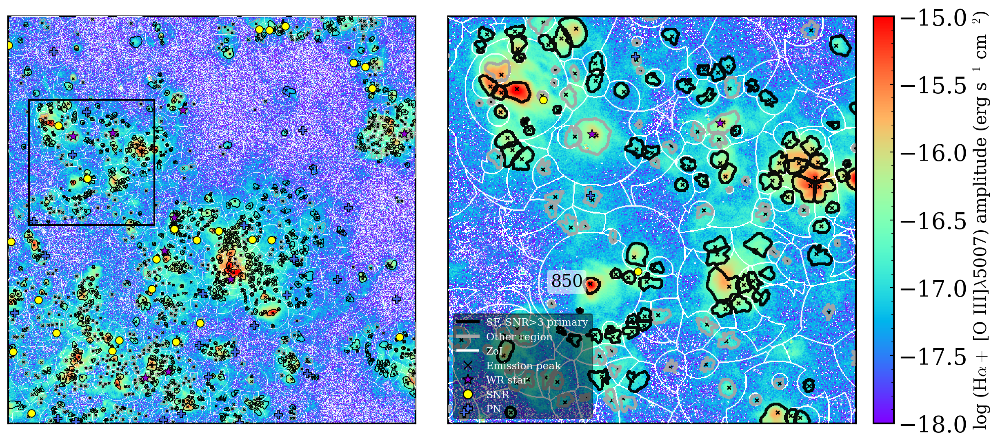

(<Figure size 2800x1400 with 3 Axes>, (<Axes: >, <Axes: >))

In [12]:
# example
v = 'v2'

if v == 'v1':
    zoom_box = (500, 600, 1150, 1250)
elif v == 'v2':
    zoom_box = (150, 750, 1000, 1600)
elif v == 'v3':
    zoom_box = (650, 950, 650, 950)

peaks_NW = pd.read_csv("CATALOGS/final_peaks_NW.csv")
peaks_NW['id'] = (peaks_NW.index+1).astype(str)
peaks_NW

plot_nw_field_zoom_with_zoi_bpt_wr_snr(
    zoom_box=zoom_box,
    annotate_region_ids=False,
    peak_color='k',
    peak_marker='x',
    wr_color='darkviolet',
    peak_ms=10,
    zoi_color='white',
    annotate_peak_id='850',
    peak_id_col='id',
    vmax = -15,
    peak_label_offset = (-35, -6),
    peak_label_fontsize = 15,
    peak_label_color = 'k',
    emission_peaks=peaks_NW,   # dataframe with columns x and y
    wr_catalog=wr_catalog,     # your WR catalog dataframe
    snr_catalog=snr_catalog,   # your SNR catalog dataframe
    pn_catalog=pn_catalog,
    snr_facecolor='yellow',
    snr_edgecolor='black',
    boundary_dilate_iter=1,
    sf_snr3_gray_mode=True,
    show_zoi_on_full=True,
    show_peaks_on_full=True,
    output_path=str(paper_plot_path(f"NW_zoom_with_zoi_{v}.pdf", subdir="zoom_maps")),
    zoi_dir="ZoI_maps/ZoI_map_100pc",
    zoi_pattern="ZoI_map_{FIELD}.fits",
    class_colors={
        "Star-forming": "black",
        "Composite": "0.65",
        "AGN/Shock": "0.65",
        "Unclassified": "0.65",
    },
)


In [13]:
def plot_bpt(df,
             class_col='BPT_class_sum_dered',
             snr_cut=3.0,
             figsize=None,
             savepath=None,
             color_col=None,
             marker_size=30,
             cmap='viridis',
             vmin=None, vmax=None,
             colorbar=True,
             colorbar_label=None,
             colorbar_log=False,
             missing_color='lightgray',
             ratio_pairs=None,
             highlight_wr_snr=False,
             wr_flag_col='has_wr_in_boundary',
             snr_flag_col='has_snr_in_boundary',
             pn_flag_col='has_pn_in_boundary',
             unflagged_color='lightgray',
             wr_color='darkviolet',
             snr_color='darkorange',
             pn_color='royalblue',
             both_color='crimson',
             flagged_size_factor=2.4,
             sf_black_gray=False):
    """Plot selected BPT / ratio-ratio panels from flux columns.
    Supported ratio names: 'NII_Ha', 'SII_Ha', 'OIII_Hb', 'OII_Hb'.
    ratio_pairs should be a list of tuples like [('NII_Ha', 'OIII_Hb'), ...].
    Panels are arranged in 2 columns and as many rows as needed.
    """

    df = df.copy()
    if ratio_pairs is None:
        ratio_pairs = [
            ('NII_Ha', 'OIII_Hb'),
            ('SII_Ha', 'OIII_Hb'),
            ('OII_Hb', 'OIII_Hb'),
            ('SII_Ha', 'OII_Hb'),
            ('NII_Ha', 'OII_Hb'),
        ]

    def _first_present(candidates):
        for col in candidates:
            if col in df.columns:
                return col
        raise KeyError(f'Missing required columns. Tried: {candidates}')

    def _get_flux_and_err(base_name):
        flux_col = _first_present([
            f'F_{base_name}_sum_dered',
            f'F_{base_name}_int_dered',
            f'F_{base_name}_sum',
            f'F_{base_name}_int',
        ])
        err_col = _first_present([
            f'F_{base_name}_e_sum_dered',
            f'F_{base_name}_e_int_dered',
            f'F_{base_name}_e_sum',
            f'F_{base_name}_e_int',
        ])
        return df[flux_col].to_numpy(dtype=float), df[err_col].to_numpy(dtype=float)

    def _log_ratio(num, num_err, den, den_err):
        num = np.asarray(num, dtype=float)
        den = np.asarray(den, dtype=float)
        num_err = np.asarray(num_err, dtype=float)
        den_err = np.asarray(den_err, dtype=float)
        with np.errstate(divide='ignore', invalid='ignore'):
            ratio = num / den
            log_ratio = np.log10(ratio)
            rel_err = np.sqrt((num_err / num) ** 2 + (den_err / den) ** 2)
            log_err = rel_err / np.log(10.0)
        good = np.isfinite(log_ratio) & np.isfinite(log_err) & (num > 0) & (den > 0)
        return np.where(good, log_ratio, np.nan), np.where(good, log_err, np.nan)

    def _flag_mask(series):
        if series.dtype == bool:
            return series.fillna(False).to_numpy(dtype=bool)
        return series.fillna(False).astype(str).str.strip().str.lower().isin({'true', '1', 'yes'}).to_numpy()

    def _plot_panel(ax, x, xerr, y, yerr, xlabel, ylabel, draw=None):
        if highlight_wr_snr:
            valid = np.isfinite(x) & np.isfinite(y)
            wr_flag = _flag_mask(df[wr_flag_col])
            snr_flag = _flag_mask(df[snr_flag_col])
            pn_flag = _flag_mask(df[pn_flag_col]) if pn_flag_col in df.columns else np.zeros(len(df), dtype=bool)

            ax.errorbar(
                x[valid], y[valid], xerr=xerr[valid], yerr=yerr[valid],
                fmt='none', ecolor='lightgray', elinewidth=0.7,
                capsize=1.5, zorder=1,
            )
            if sf_black_gray:
                sf_flag = (df[class_col].astype(str).to_numpy() == 'Star-forming')
                base_groups = [
                    (valid & ~wr_flag & ~snr_flag & ~pn_flag & ~sf_flag, '0.70', 'o', marker_size, 'Non-star-forming'),
                    (valid & ~wr_flag & ~snr_flag & ~pn_flag & sf_flag, 'black', 'o', marker_size, 'Star-forming'),
                ]
            else:
                base_groups = [(valid & ~wr_flag & ~snr_flag & ~pn_flag, unflagged_color, 'o', marker_size, 'Other regions')]
            groups = base_groups + [
                (valid & snr_flag & ~wr_flag, snr_color, 'o', marker_size * flagged_size_factor, 'Contains SNR'),
                (valid & wr_flag & ~snr_flag, wr_color, '*', marker_size * flagged_size_factor * 1.25, 'Contains WR star'),
                (valid & wr_flag & snr_flag, both_color, 'D', marker_size * flagged_size_factor, 'Contains SNR and WR star'),
                (valid & pn_flag, pn_color, 'P', marker_size * flagged_size_factor * 1.15, 'Contains PN'),
            ]
            for select, color, marker, size, label in groups:
                if np.any(select):
                    ax.scatter(
                        x[select], y[select], c=color, marker=marker, s=size,
                        edgecolors='black' if label not in {'Other regions', 'Star-forming', 'Non-star-forming'} else 'none',
                        linewidths=0.7, label=label,
                        zorder=4 if label != 'Other regions' else 2,
                    )
            if draw is not None:
                draw(ax)
            ax.set_xlabel(xlabel)
            ax.set_ylabel(ylabel)
            ax.minorticks_on()
            ax.tick_params(direction='in', which='both')
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_linewidth(2.0)
                spine.set_edgecolor('black')
            return

        for cls in shapes.keys():
            subset = df[df[class_col] == cls]
            if len(subset) == 0:
                continue
            idx = subset.index.to_numpy()
            x_sub = x[idx]
            y_sub = y[idx]
            xerr_sub = xerr[idx]
            yerr_sub = yerr[idx]
            valid = np.isfinite(x_sub) & np.isfinite(y_sub)
            if not np.any(valid):
                continue
            ax.errorbar(x_sub[valid], y_sub[valid],
                        xerr=xerr_sub[valid], yerr=yerr_sub[valid],
                        fmt='none', ecolor='lightgray', elinewidth=0.8,
                        capsize=1.5, zorder=1)
            if use_third_color:
                cvals = subset.loc[valid, color_col].to_numpy(dtype=float)
                ok = np.isfinite(cvals)
                if np.any(ok):
                    ax.scatter(x_sub[valid][ok], y_sub[valid][ok], c=cvals[ok],
                               cmap=sm.cmap, norm=sm.norm, marker=shapes[cls],
                               s=marker_size, edgecolors='none', zorder=2)
                if np.any(~ok):
                    ax.scatter(x_sub[valid][~ok], y_sub[valid][~ok], c=missing_color,
                               marker=shapes[cls], s=marker_size, edgecolors='none', zorder=2)
            else:
                ax.scatter(x_sub[valid], y_sub[valid], c=class_colors.get(cls, 'k'),
                           marker=shapes[cls], s=marker_size, edgecolors='none', zorder=2)
        if draw is not None:
            draw(ax)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.minorticks_on()
        ax.tick_params(direction='in', which='both')
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(2.0)
            spine.set_edgecolor('black')

    snr_lines = ['Halpha', 'Hbeta', '[NII]6583', '[OIII]5007', '[SII]6716', '[SII]6731', '[OII]3727']
    snr_cols = [f'SNR_{line}_sum' for line in snr_lines if f'SNR_{line}_sum' in df.columns]
    if snr_cols:
        mask = np.ones(len(df), dtype=bool)
        for col in snr_cols:
            mask &= df[col] >= snr_cut
        df = df.loc[mask].reset_index(drop=True).copy()
    else:
        print('Warning: SNR columns not found; skipping SNR cut.')

    if highlight_wr_snr:
        missing_flags = [col for col in (wr_flag_col, snr_flag_col) if col not in df.columns]
        if missing_flags:
            raise KeyError(f'Missing WR/SNR region flag columns: {missing_flags}')
        if pn_flag_col not in df.columns:
            print(f'Warning: {pn_flag_col} not found; PN regions will not be highlighted.')

    class_colors = {
        'Star-forming': 'k',
        'Composite': colors[3],
        'AGN/Shock': colors[14],
    }
    shapes = {
        'Star-forming': 'o',
        'Composite': '^',
        'AGN/Shock': 's',
    }

    use_third_color = (color_col is not None) and (color_col in df.columns)
    print(f'Using third color: {use_third_color}')
    norm = None
    sm = None
    if use_third_color:
        cvals_all = df[color_col].to_numpy(dtype=float)
        finite = np.isfinite(cvals_all)
        if vmin is None:
            vmin = np.nanmin(cvals_all[finite]) if np.any(finite) else 0.0
        if vmax is None:
            vmax = np.nanmax(cvals_all[finite]) if np.any(finite) else 1.0
        if colorbar_log:
            good = cvals_all[finite]
            good = good[good > 0]
            if good.size == 0:
                raise ValueError(f'colorbar_log=True but {color_col} has no positive finite values.')
            if vmin <= 0:
                vmin = np.nanmin(good)
            norm = mpl.colors.LogNorm(vmin=vmin, vmax=vmax)
        else:
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
        cmap_obj = mpl.colormaps.get_cmap(cmap) if isinstance(cmap, str) else cmap
        sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap_obj)

    ha, ha_err = _get_flux_and_err('Halpha')
    hb, hb_err = _get_flux_and_err('Hbeta')
    nii, nii_err = _get_flux_and_err('[NII]6583')
    oiii, oiii_err = _get_flux_and_err('[OIII]5007')
    oii, oii_err = _get_flux_and_err('[OII]3727')
    sii6716, sii6716_err = _get_flux_and_err('[SII]6716')
    sii6731, sii6731_err = _get_flux_and_err('[SII]6731')
    sii = sii6716 + sii6731
    sii_err = np.sqrt(np.square(sii6716_err) + np.square(sii6731_err))

    ratio_data = {
        'NII_Ha': _log_ratio(nii, nii_err, ha, ha_err),
        'SII_Ha': _log_ratio(sii, sii_err, ha, ha_err),
        'OIII_Hb': _log_ratio(oiii, oiii_err, hb, hb_err),
        'OII_Hb': _log_ratio(oii, oii_err, hb, hb_err),
    }
    ratio_labels = {
        'NII_Ha': r'$\log([\mathrm{N\,II}]/\mathrm{H}\alpha)$',
        'SII_Ha': r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$',
        'OIII_Hb': r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$',
        'OII_Hb': r'$\log([\mathrm{O\,II}]/\mathrm{H}\beta)$',
    }

    def _draw_nii_bpt(ax):
        x_vals = np.linspace(-2, 1.0, 400)
        kewley_y = 0.61 / (x_vals - 0.47) + 1.19
        kauff_y = 0.61 / (x_vals - 0.05) + 1.3
        ax.plot(x_vals, kauff_y, 'k--', lw=1.5, label='Kauffmann+03')
        ax.plot(x_vals, kewley_y, 'k-', lw=1.5, label='Kewley+01')
        ax.set_xlim(-1.75, 0)
        ax.set_ylim(-1.5, 1.5)

    def _draw_sii_bpt(ax):
        x_vals = np.linspace(-2, 0.5, 400)
        kewley_y = 0.72 / (x_vals - 0.32) + 1.30
        ax.plot(x_vals, kewley_y, 'k-', lw=1.5, label='Kewley+01')
        ax.set_xlim(-1.75, 0.2)
        ax.set_ylim(-1.5, 1.5)

    panel_drawers = {
        ('NII_Ha', 'OIII_Hb'): _draw_nii_bpt,
        ('SII_Ha', 'OIII_Hb'): _draw_sii_bpt,
    }

    n_panels = len(ratio_pairs)
    ncols = min(2, max(1, n_panels))
    nrows = int(np.ceil(n_panels / ncols))
    if figsize is None:
        figsize = (9 * ncols, 7 * nrows)
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = np.atleast_1d(axes).ravel()

    for ax, pair in zip(axes, ratio_pairs):
        x_name, y_name = pair
        if x_name not in ratio_data or y_name not in ratio_data:
            raise ValueError(f'Unsupported ratio pair {pair}. Supported ratio names: {list(ratio_data.keys())}')
        x, xerr = ratio_data[x_name]
        y, yerr = ratio_data[y_name]
        _plot_panel(ax, x, xerr, y, yerr, ratio_labels[x_name], ratio_labels[y_name], draw=panel_drawers.get(pair))
        if pair in panel_drawers or highlight_wr_snr:
            ax.legend(frameon=False, loc='lower left', fontsize=12)

    for ax in axes[n_panels:]:
        ax.axis('off')

    if use_third_color and colorbar and sm is not None:
        cax = fig.add_axes([0.92, 0.12, 0.015, 0.76])
        cbar = fig.colorbar(sm, cax=cax)
        if colorbar_label is None:
            colorbar_label = color_col
        cbar.set_label(colorbar_label)
        fig.tight_layout(rect=[0, 0, 0.9, 1])
    else:
        fig.tight_layout()

    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    plt.show()
    return fig, axes[:n_panels]


Using third color: True


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/1315309062.py:290: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 1])


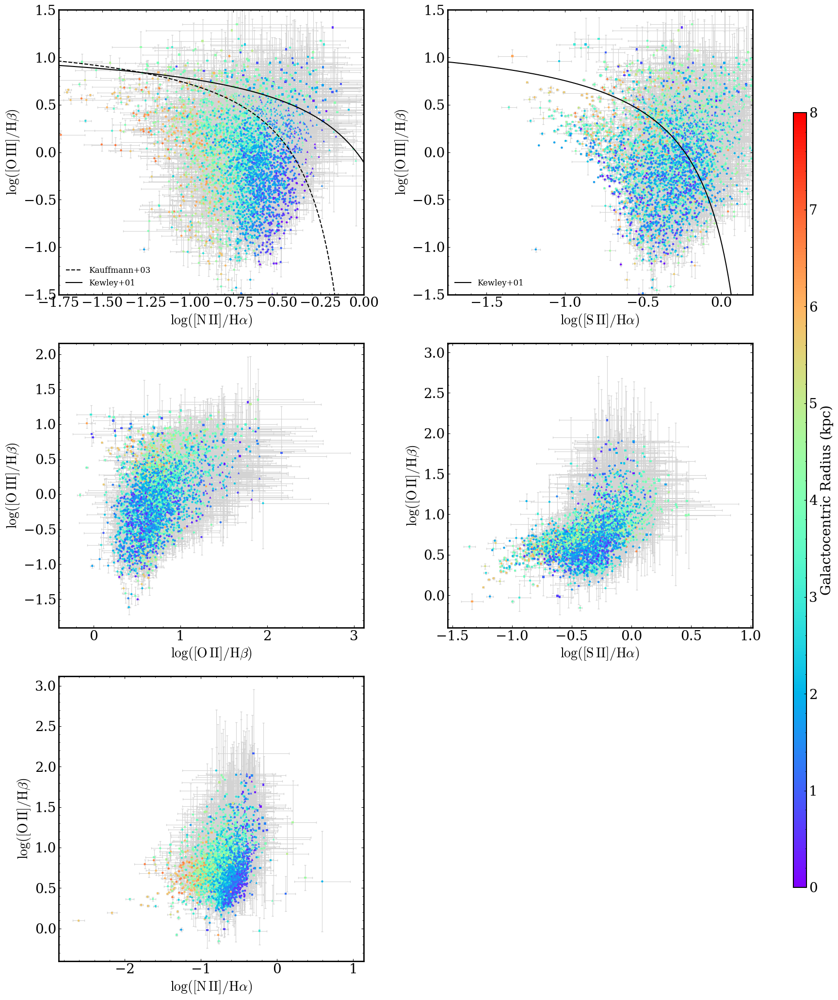

Using third color: False


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_13206/1315309062.py:154: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(x_sub[valid], y_sub[valid], c=class_colors.get(cls, 'k'),


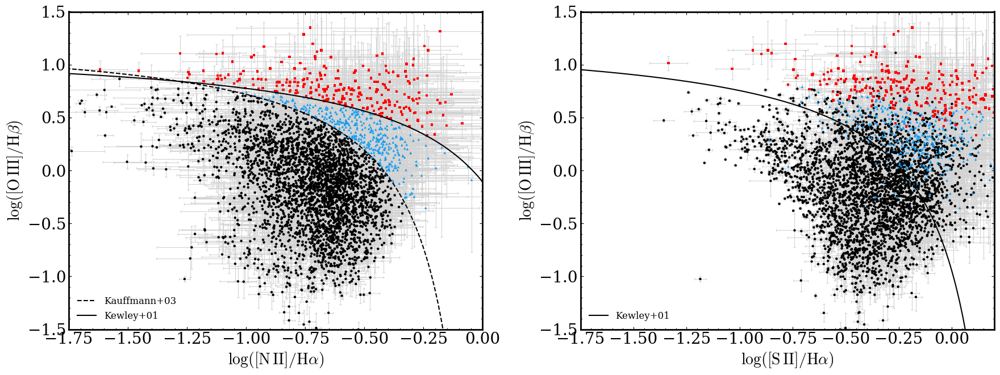

Using third color: False


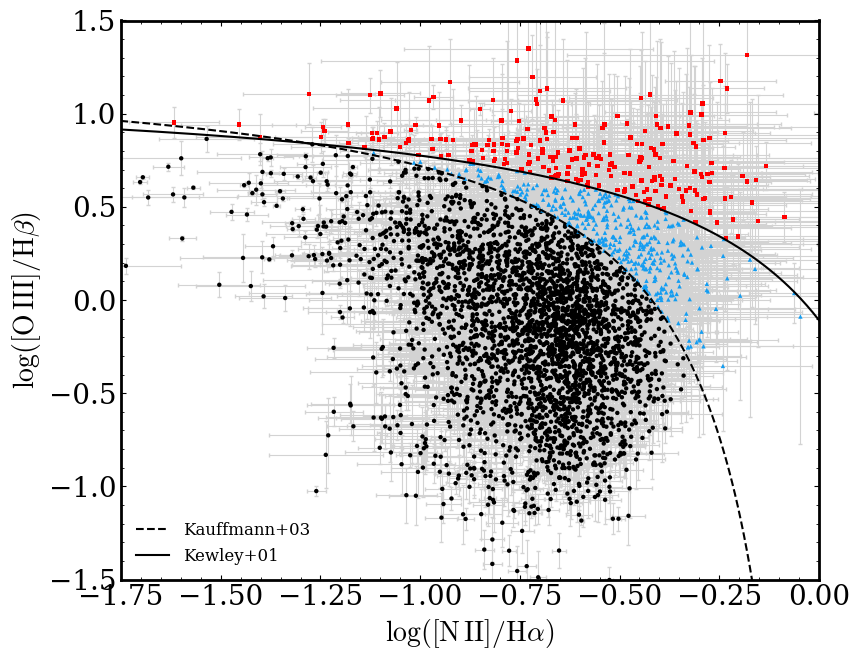

Using third color: False


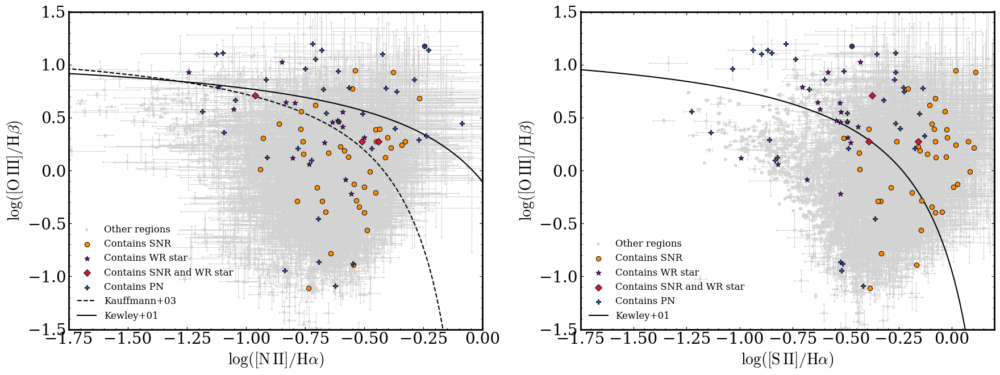

Using third color: False


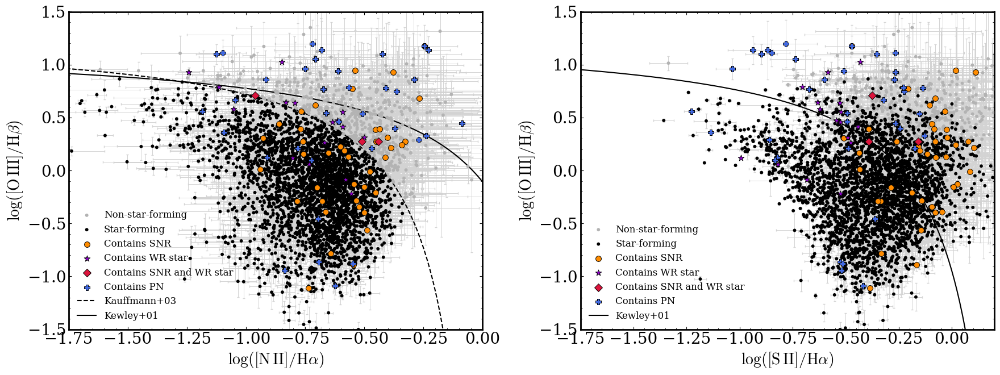

(<Figure size 1800x700 with 2 Axes>,
 array([<Axes: xlabel='$\\log([\\mathrm{N\\,II}]/\\mathrm{H}\\alpha)$', ylabel='$\\log([\\mathrm{O\\,III}]/\\mathrm{H}\\beta)$'>,
        <Axes: xlabel='$\\log([\\mathrm{S\\,II}]/\\mathrm{H}\\alpha)$', ylabel='$\\log([\\mathrm{O\\,III}]/\\mathrm{H}\\beta)$'>],
       dtype=object))

In [14]:
snr_cut=3
plot_bpt(cat, snr_cut=snr_cut, marker_size = 10, color_col = 'R_gal_kpc', cmap='rainbow', vmin=0, vmax=8, 
         colorbar_label='Galactocentric Radius (kpc)',
         savepath = str(paper_plot_path(f'M33_allfields_BPT_SNR{snr_cut}_colored_by_radius.png', subdir='bpt')))


plot_bpt(cat, snr_cut=snr_cut, marker_size = 10, 
         savepath = str(paper_plot_path(f'M33_allfields_BPT_SNR{snr_cut}.png', subdir='bpt')), ratio_pairs = [
            ('NII_Ha', 'OIII_Hb'),
            ('SII_Ha', 'OIII_Hb')])

plot_bpt(cat, snr_cut=snr_cut, marker_size = 10, 
         savepath = str(paper_plot_path(f'M33_allfields_BPT_SNR{snr_cut}.png', subdir='bpt')), ratio_pairs = [
            ('NII_Ha', 'OIII_Hb')])


# Two-panel BPT diagram highlighting regions that contain catalogued SNRs or WR stars.
plot_bpt(
    cat,
    snr_cut=snr_cut,
    marker_size=14,
    highlight_wr_snr=True,
    flagged_size_factor=2.6,
    ratio_pairs=[
        ('NII_Ha', 'OIII_Hb'),
        ('SII_Ha', 'OIII_Hb'),
    ],
    savepath=str(paper_plot_path(
        f'M33_allfields_BPT_SNR{snr_cut}_WR_SNR_highlighted.png',
        subdir='bpt',
    )),
)


# Two-panel BPT diagram with star-forming regions in black, non-star-forming regions in grey,
# and PN/SNR/WR-hosting regions overplotted.
cat_bpt_sf_gray = cat.copy()
cat_bpt_sf_gray['bpt_sf_display'] = np.where(
    cat_bpt_sf_gray['BPT_class_sum_dered'] == 'Star-forming',
    1.0,
    0.0,
)
plot_bpt(
    cat_bpt_sf_gray,
    snr_cut=snr_cut,
    marker_size=18,
    highlight_wr_snr=True,
    unflagged_color='lightgray',
    flagged_size_factor=2.8,
    sf_black_gray=True,
    ratio_pairs=[
        ('NII_Ha', 'OIII_Hb'),
        ('SII_Ha', 'OIII_Hb'),
    ],
    savepath=str(paper_plot_path(
        f'M33_allfields_BPT_SNR{snr_cut}_SF_black_gray_compact_objects.png',
        subdir='bpt',
    )),
)


In [15]:
# number of star-forming
sf_count = (cat['BPT_class_sum_dered'] == 'Star-forming').sum()
print(f'Number of star-forming regions: {sf_count} out of {len(cat)}')

Number of star-forming regions: 4476 out of 6397


In [16]:
np.nanmin(cat['SNR_Halpha_sum'])

#how many regions have SNR_Halpha_sum <= 3.0?
low_snr_count = np.sum(cat['SNR_Halpha_sum'] <= 3.0)
print(f"Number of regions with SNR_Halpha_sum <= 3.0: {low_snr_count}")

Number of regions with SNR_Halpha_sum <= 3.0: 308


In [17]:
# min(cat['area_px_after_carve'])

#how many regions have area_px_after_carve <= 20 and low Halpha flux?
small_region_count = np.sum((cat['area_px_after_carve'] <= 20))
print(f"Number of regions with area_px_after_carve <= 20 and F_Halpha <= 10.0: {small_region_count}")
#which field are these regions in?
small_regions = cat[(cat['area_px_after_carve'] <= 20)]
print(small_regions[['field', 'area_px_after_carve', 'F_Halpha_sum_dered']])

Number of regions with area_px_after_carve <= 20 and F_Halpha <= 10.0: 0
Empty DataFrame
Columns: [field, area_px_after_carve, F_Halpha_sum_dered]
Index: []


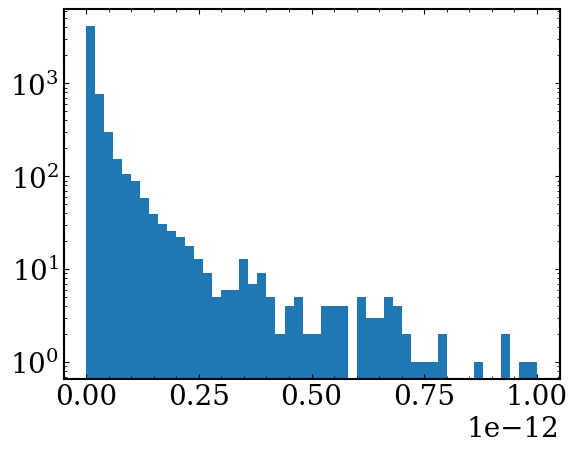

In [18]:
plt.hist(cat["F_Halpha_sum_dered"], bins=50, range=(1e-18, 1e-12), log=True)
# plt.xscale('log')
plt.show()

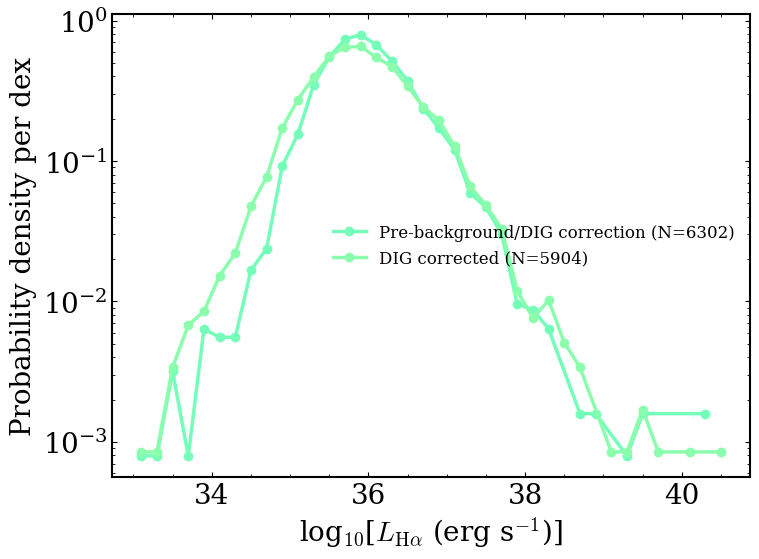

DIG comparison source, no_dig: CATALOGS/flux_catalogs/summed_map/no_dig/total_flux_catalog_combined.csv
DIG comparison source, dig_subtracted: CATALOGS/flux_catalogs/summed_map/dig_subtracted/total_flux_catalog_combined.csv


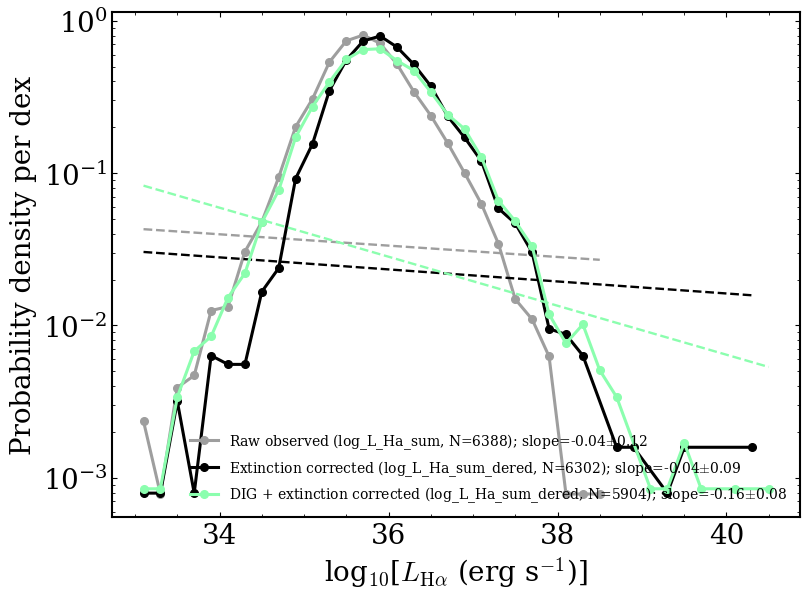

In [19]:
def load_available_flux_catalog(method, dig_mode, primary_only=True):
    base_dir = Path('CATALOGS') / 'flux_catalogs' / method / dig_mode
    preferred_paths = [
        base_dir / 'total_flux_catalog_combined.csv',
        base_dir / 'total_flux_catalog.csv',
    ]

    df = None
    source = None
    for path in preferred_paths:
        if path.exists():
            df = pd.read_csv(path)
            source = str(path)
            break

    if df is None:
        field_paths = sorted(base_dir.glob('flux_catalog_*.csv'))
        if not field_paths:
            raise FileNotFoundError(f'No available flux catalogs found in {base_dir}')
        df = pd.concat((pd.read_csv(path) for path in field_paths), ignore_index=True, sort=False)
        source = f'{len(field_paths)} field catalogs from {base_dir}'

    if primary_only and 'primary' in df.columns:
        df = df.loc[df['primary'].fillna(True)].copy().reset_index(drop=True)

    return df, source


cat_nodig, nodig_source = load_available_flux_catalog(catalog_method, 'no_dig', primary_only=primary_only)
cat_digsub, digsub_source = load_available_flux_catalog(catalog_method, 'dig_subtracted', primary_only=primary_only)

dig_before = cat_nodig['log_L_Ha_sum_dered'].to_numpy(dtype=float)
dig_after = cat_digsub['log_L_Ha_sum_dered'].to_numpy(dtype=float)

dig_before = dig_before[np.isfinite(dig_before)]
dig_after = dig_after[np.isfinite(dig_after)]

def luminosity_function_pdf_points(logL, bins):
    logL = np.asarray(logL, dtype=float)
    logL = logL[np.isfinite(logL)]
    if len(logL) == 0:
        return np.array([]), np.array([]), np.array([])
    counts, edges = np.histogram(logL, bins=bins)
    centers = 0.5 * (edges[:-1] + edges[1:])
    widths = np.diff(edges)
    pdf = counts / (np.sum(counts) * widths)
    detected = counts > 0
    return centers[detected], pdf[detected], counts[detected]

logL_bins = np.arange(33.0, 40.6, 0.2)
fig, ax = plt.subplots(figsize=(8, 6))

lf_specs = [
    (dig_before, lf_comparison_colors['pre_dig'], 'Pre-background/DIG correction'),
    (dig_after, lf_comparison_colors['dig_corrected'], 'DIG corrected'),
]

for logL_values, color, label in lf_specs:
    centers, pdf, counts = luminosity_function_pdf_points(logL_values, logL_bins)
    if len(centers) == 0:
        continue
    ax.plot(
        centers,
        pdf,
        marker='o',
        markersize=6,
        linewidth=2.5,
        color=color,
        label=f'{label} (N={len(logL_values)})',
    )

ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel(r'Probability density per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=12)
fig.tight_layout()
fig.savefig(
    paper_plot_path(
        f'M33_HII_Halpha_luminosity_function_corrections_{catalog_method}.png',
        subdir='luminosity_functions'
    ),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

print(f'DIG comparison source, no_dig: {nodig_source}')
print(f'DIG comparison source, dig_subtracted: {digsub_source}')


# Three-version luminosity function: raw observed, extinction corrected, and DIG+extinction corrected.
def _first_log_luminosity(df, candidates):
    for col in candidates:
        if col in df.columns:
            vals = pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float)
            if col.startswith('L_'):
                with np.errstate(divide='ignore', invalid='ignore'):
                    vals = np.log10(vals)
            return vals, col
    raise KeyError(f'None of these luminosity columns are present: {candidates}')


def _fit_lf_pdf_slope(logL_values, bins, min_points=4):
    centers, pdf, counts = luminosity_function_pdf_points(logL_values, bins)
    mask = np.isfinite(centers) & np.isfinite(pdf) & (pdf > 0) & (counts > 0)
    if mask.sum() < min_points:
        return centers, pdf, counts, None
    fit = linregress(centers[mask], np.log10(pdf[mask]))
    return centers, pdf, counts, fit

lf_three_specs = []
raw_logL, raw_col = _first_log_luminosity(cat_nodig, ['log_L_Ha_sum', 'L_Ha_sum', 'log_L_Ha_observed', 'L_Ha_observed'])
ext_logL, ext_col = _first_log_luminosity(cat_nodig, ['log_L_Ha_sum_dered', 'L_Ha_sum_dered'])
final_logL, final_col = _first_log_luminosity(cat_digsub, ['log_L_Ha_sum_dered', 'L_Ha_sum_dered'])
lf_three_specs = [
    (raw_logL, '0.62', 'Raw observed', raw_col, 1),
    (ext_logL, 'black', 'Extinction corrected', ext_col, 2),
    (final_logL, color_dic['L_Ha_sum_dered'], 'DIG + extinction corrected', final_col, 3),
]

fig, ax = plt.subplots(figsize=(8.5, 6.4))
for logL_values, color, label, col, zorder in lf_three_specs:
    logL_values = np.asarray(logL_values, dtype=float)
    logL_values = logL_values[np.isfinite(logL_values)]
    centers, pdf, counts, fit = _fit_lf_pdf_slope(logL_values, logL_bins)
    if len(centers) == 0:
        continue
    fit_label = f'{label} ({col}, N={len(logL_values)})'
    if fit is not None:
        fit_label += rf'; slope={fit.slope:.2f}$\pm${fit.stderr:.2f}'
    ax.plot(centers, pdf, marker='o', markersize=5.5, linewidth=2.2, color=color, label=fit_label, zorder=zorder)
    if fit is not None:
        xfit = np.linspace(np.nanmin(centers), np.nanmax(centers), 200)
        yfit = 10 ** (fit.slope * xfit + fit.intercept)
        ax.plot(xfit, yfit, linestyle='--', linewidth=1.7, color=color, zorder=zorder)

ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel(r'Probability density per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=10)
fig.tight_layout()
fig.savefig(
    paper_plot_path('M33_HII_Halpha_luminosity_function_raw_extcorr_digextcorr.png', subdir='luminosity_functions'),
    dpi=300,
    bbox_inches='tight',
)
plt.show()


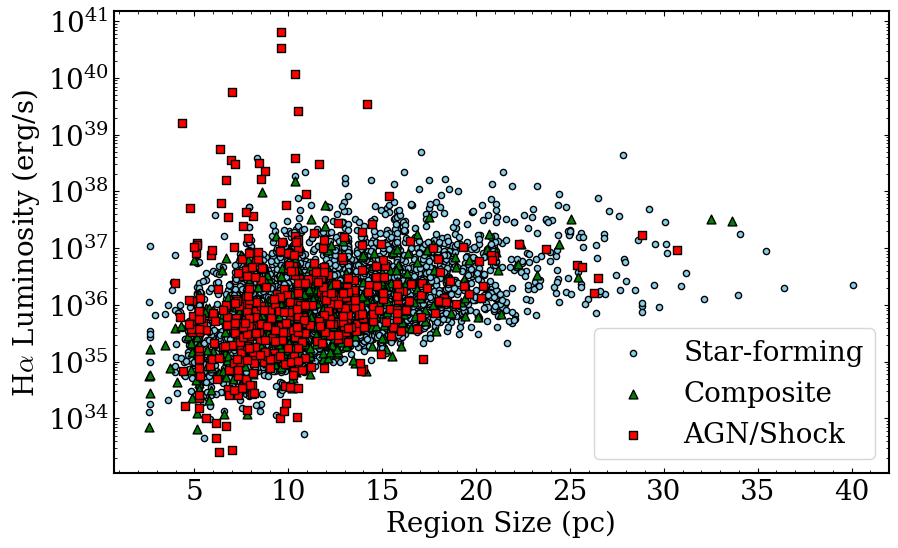

In [20]:
# plot radius vs luminosity
#don't include regions with tiny radius
mask = (cat['radius_p16_pc'] > 1) & (cat['radius_p50_pc'] > 1) & (cat['radius_p84_pc'] > 1)

plt.figure(figsize=(10, 6))
# plt.scatter(cat['radius_p84_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'purple', label = r'84\% radius')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'Star-forming')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'Star-forming')], 
            s=20, alpha=1, edgecolor='k', color = 'skyblue', marker='o', label='Star-forming')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'Composite')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'Composite')], 
            s=40, alpha=1, edgecolor='k', color = 'green', marker='^', label='Composite')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'AGN/Shock')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'AGN/Shock')], 
            s=40, alpha=1, edgecolor='k', color = 'red', marker='s', label='AGN/Shock')

# plt.scatter(cat['radius_p16_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'hotpink', label = r'16\% radius')
plt.yscale('log')
plt.xlabel('Region Size (pc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.legend()
plt.savefig(paper_plot_path('M33_HII_luminosity_vs_radius_BPT.png', subdir='scaling_relations'), dpi=300, bbox_inches='tight')
plt.show()


In [21]:
# Shared color dictionaries are initialized near the top of the notebook so early plots can use them.
# Recompute here as a harmless refresh before the radial-gradient section.
property_cmap = plt.get_cmap('rainbow')
property_color_positions = {
    'sum_A_V': 0.38,
    'L_Ha_sum_dered': 0.52,
    'ne_SII_cm3': 0.66,
    'logU_KK04': 0.76,
    'log_P_thermal_SII_over_k': 0.86,
    'radius_areaeq_pc': 0.94,
}
color_dic = {key: property_cmap(pos) for key, pos in property_color_positions.items()}
lf_comparison_colors = {
    'pre_dig': property_cmap(0.48),
    'dig_corrected': color_dic['L_Ha_sum_dered'],
}


In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FuncFormatter, NullFormatter

def plot_radial_gradient(
    cat,
    xcol,
    ycol,
    mask=None,
    bins=None,
    color='C0',
    xlabel='Galactocentric Radius (kpc)',
    ylabel='Value',
    title=None,
    scatter_label=None,
    summary_label=r'Median $\pm 1\sigma$ in bins',
    xlim=None,
    ylim=None,
    yscale='linear',
    xscale='linear',
    x_major_ticks=None,
    x_tick_plain=False,
    savepath=None,
    show=True,
    figsize=(10, 6),
    scatter_kwargs=None,
    errorbar_kwargs=None,
    binned_kwargs=None,
    fit_points=True,
    fit_bins=True,
    fit_points_range=None,
    fit_bins_range=None,
    alpha=0.5,
    fit_logy_points=False,
    fit_logy_bins=False,
    fit_logx_points=False,
    fit_logx_bins=False,
    fit_equation_x='x',
    fit_equation_y='y',
    log_base=10,
    fit_name=None,
):
    """
    Plot a radial gradient for ycol vs xcol, including scatter points, binned
    median with 16th/84th percentile error bars, and linear fits.

    Parameters
    ----------
    cat : dict-like, pandas DataFrame, astropy Table, or structured array
        Catalog containing xcol and ycol.
    xcol : str
        Name of the radius column (x-axis).
    ycol : str
        Name of the quantity column (y-axis).
    mask : array-like of bool, optional
        Boolean mask selecting rows to plot. If None, uses finite values only.
    bins : array-like, optional
        Bin edges. Default is np.arange(0, 20, 0.5).
    color : str, optional
        Main plot color for scatter and binned markers.
    xlabel, ylabel : str, optional
        Axis labels.
    title : str, optional
        Plot title.
    scatter_label : str, optional
        Label for scatter points.
    summary_label : str, optional
        Label for binned median/error bars.
    xlim, ylim : tuple, optional
        Axis limits.
    yscale : str, optional
        Y-axis scaling.
    xscale : str, optional
        X-axis scaling.
    savepath : str, optional
        If given, save figure to this path.
    show : bool, optional
        Whether to display the plot.
    figsize : tuple, optional
        Figure size.
    scatter_kwargs : dict, optional
        Extra kwargs for raw scatter points.
    errorbar_kwargs : dict, optional
        Extra kwargs for error bars.
    binned_kwargs : dict, optional
        Extra kwargs for binned markers.
    fit_points : bool, optional
        If True, fit all raw points with a straight line.
    fit_bins : bool, optional
        If True, fit binned medians with a straight line.
    fit_points_range : tuple, optional
        (xmin, xmax) range over which to fit raw points.
    fit_bins_range : tuple, optional
        (xmin, xmax) range over which to fit binned points.
    alpha : float, optional
        Alpha for raw scatter points.

    Returns
    -------
    results : dict
        Dictionary with bin_centers, medians, lower_errs, upper_errs, counts,
        point_fit, and binned_fit.
    """
    x = np.asarray(cat[xcol])
    y = np.asarray(cat[ycol])

    if mask is None:
        mask = np.isfinite(x) & np.isfinite(y)
    else:
        mask = np.asarray(mask) & np.isfinite(x) & np.isfinite(y)

    if bins is None:
        bins = np.arange(0, 20, 0.5)

    scatter_defaults = dict(
        s=30,
        alpha=alpha,
        facecolors='none',
        edgecolors=color,
        linewidths=1.0,
        marker='o',
        label=scatter_label,
        zorder=1,
    )
    if scatter_kwargs is not None:
        scatter_defaults.update(scatter_kwargs)

    errorbar_defaults = dict(
        fmt='none',
        ecolor='k',
        elinewidth=1.5,
        capsize=4,      # caps added
        capthick=1.5,
        zorder=3,
    )
    if errorbar_kwargs is not None:
        errorbar_defaults.update(errorbar_kwargs)

    binned_defaults = dict(
        s=180,
        marker='h',
        facecolors=color,
        edgecolors='k',
        linewidths=1.5,
        zorder=4,
        label=summary_label,
    )
    if binned_kwargs is not None:
        binned_defaults.update(binned_kwargs)

    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    medians = []
    lower_errs = []
    upper_errs = []
    counts = []

    for i in range(len(bins) - 1):
        in_bin = (x >= bins[i]) & (x < bins[i + 1]) & mask
        counts.append(np.sum(in_bin))

        if np.sum(in_bin) > 0:
            y_bin = y[in_bin]
            medians.append(np.median(y_bin))
            lower_errs.append(np.percentile(y_bin, 16))
            upper_errs.append(np.percentile(y_bin, 84))
        else:
            medians.append(np.nan)
            lower_errs.append(np.nan)
            upper_errs.append(np.nan)

    medians = np.array(medians)
    lower_errs = np.array(lower_errs)
    upper_errs = np.array(upper_errs)
    counts = np.array(counts)

    valid_bins = np.isfinite(medians)

    fig, ax = plt.subplots(figsize=figsize)

    # Raw points
    ax.scatter(x[mask], y[mask], **scatter_defaults)

    # Error bars for binned points
    ax.errorbar(
        bin_centers[valid_bins],
        medians[valid_bins],
        yerr=[
            medians[valid_bins] - lower_errs[valid_bins],
            upper_errs[valid_bins] - medians[valid_bins]
        ],
        **errorbar_defaults
    )

    # Binned hexagon markers
    ax.scatter(
        bin_centers[valid_bins],
        medians[valid_bins],
        **binned_defaults
    )

    point_fit = None
    binned_fit = None
    point_fit_stats = None
    binned_fit_stats = None

    # Fit all points
    if fit_points:
        fit_mask_points = mask.copy()
        if fit_points_range is not None:
            xmin, xmax = fit_points_range
            fit_mask_points &= (x >= xmin) & (x <= xmax)

        if np.sum(fit_mask_points) >= 2:
            x_fit_data = x[fit_mask_points]
            y_fit_data = y[fit_mask_points]

            # remove non-positive values if taking logs
            if fit_logx_points or fit_logy_points:
                positive = np.ones(len(y_fit_data), dtype=bool)
                if fit_logx_points:
                    positive &= x_fit_data > 0
                if fit_logy_points:
                    positive &= y_fit_data > 0
                x_fit_data = x_fit_data[positive]
                y_fit_data = y_fit_data[positive]

            x_fit_raw = x_fit_data.copy()
            if fit_logx_points:
                x_fit_data = np.log10(x_fit_data) if log_base == 10 else np.log(x_fit_data)

            if fit_logy_points:
                if log_base == 10:
                    y_fit_data = np.log10(y_fit_data)
                else:
                    y_fit_data = np.log(y_fit_data)

            if len(y_fit_data) >= 2:
                point_regression = linregress(x_fit_data, y_fit_data)
                m_pts, b_pts = point_regression.slope, point_regression.intercept
                point_fit = (m_pts, b_pts)
                point_fit_stats = {
                    'slope': m_pts,
                    'intercept': b_pts,
                    'slope_stderr': point_regression.stderr,
                    'intercept_stderr': point_regression.intercept_stderr,
                    'n_points': len(x_fit_data),
                }

                if fit_logx_points:
                    if xlim is not None and xlim[0] > 0 and xlim[1] > xlim[0]:
                        xfit_pts = np.geomspace(xlim[0], xlim[1], 300)
                    else:
                        xfit_pts = np.geomspace(np.nanmin(x_fit_raw), np.nanmax(x_fit_raw), 300)
                elif xlim is not None:
                    xfit_pts = np.linspace(xlim[0], xlim[1], 300)
                else:
                    xfit_pts = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 300)

                if fit_logy_points:
                    # convert back to linear space
                    if log_base == 10:
                        xfit_eval = np.log10(xfit_pts) if fit_logx_points else xfit_pts
                        yfit_pts = 10**(m_pts * xfit_eval + b_pts)
                        rhs_x = fr'\log({fit_equation_x})' if fit_logx_points else fit_equation_x
                        label = fr'$\log({fit_equation_y}) = {m_pts:.2f}\,{rhs_x} {b_pts:+.2f}$'
                    else:
                        xfit_eval = np.log(xfit_pts) if fit_logx_points else xfit_pts
                        yfit_pts = np.exp(m_pts * xfit_eval + b_pts)
                        rhs_x = fr'\ln({fit_equation_x})' if fit_logx_points else fit_equation_x
                        label = fr'$\ln({fit_equation_y}) = {m_pts:.2f}\,{rhs_x} {b_pts:+.2f}$'
                else:
                    xfit_eval = np.log10(xfit_pts) if fit_logx_points and log_base == 10 else (np.log(xfit_pts) if fit_logx_points else xfit_pts)
                    yfit_pts = m_pts * xfit_eval + b_pts
                    rhs_x = fr'\log({fit_equation_x})' if fit_logx_points else fit_equation_x
                    label = fr'${fit_equation_y} = {m_pts:.2f}\,{rhs_x} {b_pts:+.2f}$'

                ax.plot(
                    xfit_pts,
                    yfit_pts,
                    color='k',
                    linestyle='-',
                    linewidth=2.5,
                    label=label,
                    zorder=5,
                )

    # Fit binned medians
    if fit_bins:
        fit_mask_bins = valid_bins.copy()
        if fit_bins_range is not None:
            xmin, xmax = fit_bins_range
            fit_mask_bins &= (bin_centers >= xmin) & (bin_centers <= xmax)

        if np.sum(fit_mask_bins) >= 2:
            x_fit_data = bin_centers[fit_mask_bins]
            y_fit_data = medians[fit_mask_bins]

            if fit_logx_bins or fit_logy_bins:
                positive = np.ones(len(y_fit_data), dtype=bool)
                if fit_logx_bins:
                    positive &= x_fit_data > 0
                if fit_logy_bins:
                    positive &= y_fit_data > 0
                x_fit_data = x_fit_data[positive]
                y_fit_data = y_fit_data[positive]

            x_fit_raw = x_fit_data.copy()
            if fit_logx_bins:
                x_fit_data = np.log10(x_fit_data) if log_base == 10 else np.log(x_fit_data)

            if fit_logy_bins:
                if log_base == 10:
                    y_fit_data = np.log10(y_fit_data)
                else:
                    y_fit_data = np.log(y_fit_data)

            if len(y_fit_data) >= 2:
                binned_regression = linregress(x_fit_data, y_fit_data)
                m_bin, b_bin = binned_regression.slope, binned_regression.intercept
                binned_fit = (m_bin, b_bin)
                binned_fit_stats = {
                    'slope': m_bin,
                    'intercept': b_bin,
                    'slope_stderr': binned_regression.stderr,
                    'intercept_stderr': binned_regression.intercept_stderr,
                    'n_points': len(x_fit_data),
                }

                if fit_logx_bins:
                    if xlim is not None and xlim[0] > 0 and xlim[1] > xlim[0]:
                        xfit_bin = np.geomspace(xlim[0], xlim[1], 300)
                    else:
                        xfit_bin = np.geomspace(np.nanmin(x_fit_raw), np.nanmax(x_fit_raw), 300)
                elif xlim is not None:
                    xfit_bin = np.linspace(xlim[0], xlim[1], 300)
                else:
                    xfit_bin = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 300)

                if fit_logy_bins:
                    if log_base == 10:
                        xfit_eval = np.log10(xfit_bin) if fit_logx_bins else xfit_bin
                        yfit_bin = 10**(m_bin * xfit_eval + b_bin)
                        rhs_x = fr'\log({fit_equation_x})' if fit_logx_bins else fit_equation_x
                        label = fr'$\log({fit_equation_y}) = {m_bin:.2f}\,{rhs_x} {b_bin:+.2f}$ (bins)'
                    else:
                        xfit_eval = np.log(xfit_bin) if fit_logx_bins else xfit_bin
                        yfit_bin = np.exp(m_bin * xfit_eval + b_bin)
                        rhs_x = fr'\ln({fit_equation_x})' if fit_logx_bins else fit_equation_x
                        label = fr'$\ln({fit_equation_y}) = {m_bin:.2f}\,{rhs_x} {b_bin:+.2f}$ (bins)'
                else:
                    xfit_eval = np.log10(xfit_bin) if fit_logx_bins and log_base == 10 else (np.log(xfit_bin) if fit_logx_bins else xfit_bin)
                    yfit_bin = m_bin * xfit_eval + b_bin
                    rhs_x = fr'\log({fit_equation_x})' if fit_logx_bins else fit_equation_x
                    label = fr'${fit_equation_y} = {m_bin:.2f}\,{rhs_x} {b_bin:+.2f}$ (bins)'

                ax.plot(
                    xfit_bin,
                    yfit_bin,
                    color='k',
                    linestyle='--',
                    linewidth=2.5,
                    label=label,
                    zorder=5,
                )

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.minorticks_on()
    ax.set_xscale(xscale)
    ax.set_yscale(yscale)

    if title is not None:
        ax.set_title(title)
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)


    def _plain_axis_tick(value, _pos):
        if not np.isfinite(value):
            return ''
        if np.isclose(value, np.round(value), rtol=0, atol=1e-8):
            return f'{int(np.round(value))}'
        return f'{value:g}'

    if x_major_ticks is not None:
        ticks = []
        for tick in x_major_ticks:
            tick = float(tick)
            if not np.isfinite(tick):
                continue
            if xscale == 'log' and tick <= 0:
                continue
            if xlim is not None and not (min(xlim) <= tick <= max(xlim)):
                continue
            ticks.append(tick)
        if ticks:
            ax.xaxis.set_major_locator(FixedLocator(ticks))
            ax.xaxis.set_minor_formatter(NullFormatter())
    if x_tick_plain:
        ax.xaxis.set_major_formatter(FuncFormatter(_plain_axis_tick))

    handles, labels = ax.get_legend_handles_labels()
    if len(handles) > 0:
        leg = ax.legend(
            loc='upper right',
            frameon=True,
            framealpha=1.0,
            edgecolor='k',
            fancybox=False,
        )
        leg.get_frame().set_linewidth(1.5)

    if savepath is not None:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
    else:
        plt.close()

    results = {
        'bin_centers': bin_centers,
        'medians': medians,
        'lower_errs': lower_errs,
        'upper_errs': upper_errs,
        'counts': counts,
        'point_fit': point_fit,
        'binned_fit': binned_fit,
        'point_fit_stats': point_fit_stats,
        'binned_fit_stats': binned_fit_stats,
    }
    if fit_name is not None:
        radial_gradient_fit_results[fit_name] = results
    return results


def _binned_median_percentiles(x, y, bins, mask):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = np.asarray(mask, dtype=bool) & np.isfinite(x) & np.isfinite(y)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    medians = np.full(len(bin_centers), np.nan)
    p16 = np.full(len(bin_centers), np.nan)
    p84 = np.full(len(bin_centers), np.nan)
    counts = np.zeros(len(bin_centers), dtype=int)

    for i in range(len(bin_centers)):
        in_bin = mask & (x >= bins[i]) & (x < bins[i + 1])
        counts[i] = int(in_bin.sum())
        if counts[i] == 0:
            continue
        y_bin = y[in_bin]
        medians[i] = np.nanmedian(y_bin)
        p16[i] = np.nanpercentile(y_bin, 16)
        p84[i] = np.nanpercentile(y_bin, 84)

    return bin_centers, medians, p16, p84, counts


def _average_y_error(df, spec, mask):
    """Return a representative one-sigma y error in plotted units, if available."""
    err_col = spec.get('err_col')
    if err_col and err_col in df.columns:
        err = pd.to_numeric(df.loc[mask, err_col], errors='coerce').to_numpy(dtype=float)
        err = err[np.isfinite(err) & (err > 0)]
        return float(np.nanmedian(err)) if len(err) else np.nan

    if spec.get('err_from_fractional_cols'):
        value_col, value_err_col = spec['err_from_fractional_cols']
        if value_col in df.columns and value_err_col in df.columns:
            value = pd.to_numeric(df.loc[mask, value_col], errors='coerce').to_numpy(dtype=float)
            value_err = pd.to_numeric(df.loc[mask, value_err_col], errors='coerce').to_numpy(dtype=float)
            frac = value_err / value
            log_err = frac / np.log(10)
            log_err = log_err[np.isfinite(log_err) & (log_err > 0)]
            return float(np.nanmedian(log_err)) if len(log_err) else np.nan

    if spec.get('asymmetric_err_cols'):
        lo_col, hi_col = spec['asymmetric_err_cols']
        if lo_col in df.columns and hi_col in df.columns:
            lo = pd.to_numeric(df.loc[mask, lo_col], errors='coerce').to_numpy(dtype=float)
            hi = pd.to_numeric(df.loc[mask, hi_col], errors='coerce').to_numpy(dtype=float)
            err = 0.5 * (np.abs(lo) + np.abs(hi))
            err = err[np.isfinite(err) & (err > 0)]
            return float(np.nanmedian(err)) if len(err) else np.nan

    return np.nan


def _axis_fraction_to_data_y(ax, frac):
    ymin, ymax = ax.get_ylim()
    if ax.get_yscale() == 'log':
        return 10 ** (np.log10(ymin) + frac * (np.log10(ymax) - np.log10(ymin)))
    return ymin + frac * (ymax - ymin)


def _axis_fraction_to_data_x(ax, frac):
    xmin, xmax = ax.get_xlim()
    return xmin + frac * (xmax - xmin)


def _draw_average_error_marker(ax, avg_err, color):
    x0 = _axis_fraction_to_data_x(ax, 0.08)
    y0 = _axis_fraction_to_data_y(ax, 0.86)
    if np.isfinite(avg_err) and avg_err > 0:
        ax.errorbar(
            [x0], [y0], yerr=[[avg_err], [avg_err]],
            fmt='o', ms=4, color=color, ecolor='k', elinewidth=1.0,
            capsize=2.5, zorder=7,
        )
        ax.text(
            0.12, 0.87, r'$\tilde{\sigma}$=' + f'{avg_err:.2g}',
            transform=ax.transAxes, va='center', ha='left', fontsize=10,
        )
    else:
        return


def _format_slope_label(fit, units):
    if fit is None:
        return None
    slope_err = fit.stderr if np.isfinite(fit.stderr) else np.nan
    if np.isfinite(slope_err):
        return f'Slope = {fit.slope:.3g} $\\pm$ {slope_err:.2g} {units}'
    return f'Slope = {fit.slope:.3g} {units}'


def _fit_and_plot_gradient_line(ax, x, y, mask, xlim, color='k', fit_logy=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    fit_mask = np.asarray(mask, dtype=bool) & np.isfinite(x) & np.isfinite(y)
    if fit_logy:
        fit_mask &= y > 0
    if fit_mask.sum() < 2:
        return None

    y_fit = np.log10(y[fit_mask]) if fit_logy else y[fit_mask]
    fit = linregress(x[fit_mask], y_fit)
    xline = np.linspace(xlim[0], xlim[1], 300)
    yline = fit.slope * xline + fit.intercept
    if fit_logy:
        yline = 10 ** yline
    ax.plot(xline, yline, color=color, lw=2.0, zorder=5)
    return fit


def plot_combined_radial_gradients_with_histograms(
    df,
    specs,
    xcol='R_gal_kpc',
    bins=None,
    xlim=(0, 20),
    figsize=(11.5, 11.0),
    savepath=None,
    show=True,
    show_hist_stats=True,
    show_slope_legend=True,
):
    """Stack radial-gradient panels with a sideways distribution histogram beside each panel."""
    if bins is None:
        bins = np.arange(0, 20, 0.5)

    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(
        nrows=len(specs),
        ncols=2,
        width_ratios=[5.2, 1.15],
        hspace=0.05,
        wspace=0.02,
    )

    main_axes = []
    hist_axes = []
    x = pd.to_numeric(df[xcol], errors='coerce').to_numpy(dtype=float)

    for i, spec in enumerate(specs):
        ax = fig.add_subplot(gs[i, 0], sharex=main_axes[0] if main_axes else None)
        hax = fig.add_subplot(gs[i, 1], sharey=ax)
        main_axes.append(ax)
        hist_axes.append(hax)

        y = pd.to_numeric(df[spec['ycol']], errors='coerce').to_numpy(dtype=float)
        mask = np.asarray(spec['mask'], dtype=bool) & np.isfinite(x) & np.isfinite(y)
        color = spec.get('color', 'C0')

        ax.scatter(
            x[mask], y[mask],
            s=10, alpha=0.16, facecolors='none', edgecolors=color,
            linewidths=0.55, zorder=1,
        )

        bin_centers, medians, p16, p84, counts = _binned_median_percentiles(x, y, bins, mask)
        valid = np.isfinite(medians)
        ax.errorbar(
            bin_centers[valid], medians[valid],
            yerr=[medians[valid] - p16[valid], p84[valid] - medians[valid]],
            fmt='none', ecolor='k', elinewidth=1.05, capsize=2.5, capthick=1.05,
            zorder=3,
        )
        ax.scatter(
            bin_centers[valid], medians[valid],
            s=54, marker='D', facecolors=color, edgecolors='k', linewidths=0.8,
            zorder=4,
        )

        fit = _fit_and_plot_gradient_line(
            ax, x, y, mask, xlim=xlim, color='k',
            fit_logy=spec.get('fit_logy_points', False),
        )

        ax.set_ylabel(spec['ylabel'], fontsize=13)
        ax.set_xlim(*xlim)
        if spec.get('ylim') is not None:
            ax.set_ylim(*spec['ylim'])
        ax.set_yscale(spec.get('yscale', 'linear'))
        ax.minorticks_on()
        ax.tick_params(labelsize=11)
        if i < len(specs) - 1:
            ax.tick_params(labelbottom=False)
        else:
            ax.set_xlabel('Galactocentric Radius (kpc)', fontsize=14)

        data = y[mask]
        data = data[np.isfinite(data)]
        if len(data):
            if spec.get('yscale', 'linear') == 'log':
                positive = data[data > 0]
                if len(positive):
                    hist_bins = np.geomspace(np.nanmin(positive), np.nanmax(positive), 36)
                else:
                    hist_bins = 30
            else:
                hist_bins = 36
            hax.hist(
                data, bins=hist_bins, orientation='horizontal',
                color=color, alpha=0.22, edgecolor='k', linewidth=0.55,
            )
            median = np.nanmedian(data)
            p16_all = np.nanpercentile(data, 16)
            p84_all = np.nanpercentile(data, 84)
            stat_handles = [
                hax.axhline(median, color=color, linestyle='-', lw=1.7, label=f'Med. {median:.2g}'),
                hax.axhline(p16_all, color=color, linestyle='--', lw=1.2, label=f'16th {p16_all:.2g}'),
                hax.axhline(p84_all, color=color, linestyle='--', lw=1.2, label=f'84th {p84_all:.2g}'),
            ]
            if show_hist_stats:
                hax.legend(
                    handles=stat_handles, loc='upper right', frameon=False,
                    fontsize=7.5, handlelength=1.3, borderpad=0.2, labelspacing=0.15,
                )

        hax.set_yscale(spec.get('yscale', 'linear'))
        hax.tick_params(axis='y', labelleft=False, labelright=False)
        hax.tick_params(axis='x', labelsize=9)
        hax.set_xlabel('$N$', fontsize=10)
        hax.minorticks_on()
        hax.grid(False)

        avg_err = _average_y_error(df, spec, mask)
        _draw_average_error_marker(ax, avg_err, color)

        legend_handles = []
        if i == 0:
            legend_handles.append(mpl.lines.Line2D(
                [], [], marker='D', linestyle='none', markersize=7,
                markerfacecolor='0.65', markeredgecolor='k',
                label=r'Median $\pm$ 1$\sigma$ in radial bins',
            ))
        slope_label = _format_slope_label(fit, spec.get('slope_units', 'kpc$^{-1}$'))
        if show_slope_legend and slope_label is not None:
            legend_handles.append(mpl.lines.Line2D(
                [], [], color='k', lw=2.0, label=slope_label,
            ))
        if legend_handles:
            ax.legend(handles=legend_handles, loc='upper right', frameon=False, fontsize=9.5)

    fig.align_ylabels(main_axes)

    if savepath is not None:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close(fig)
    return fig, main_axes, hist_axes


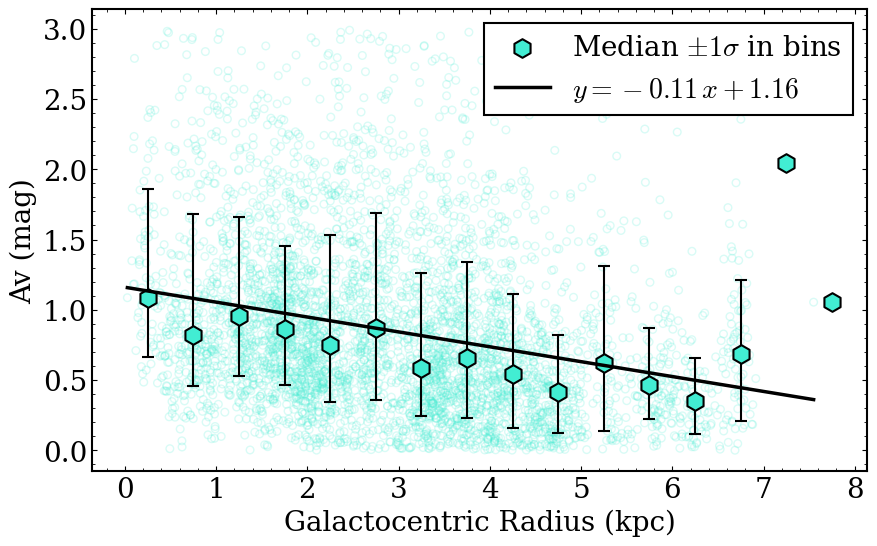

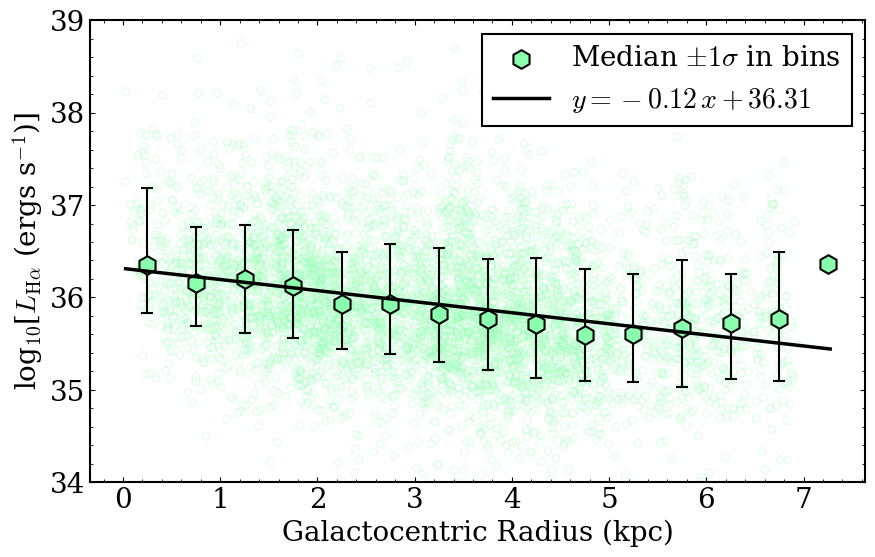

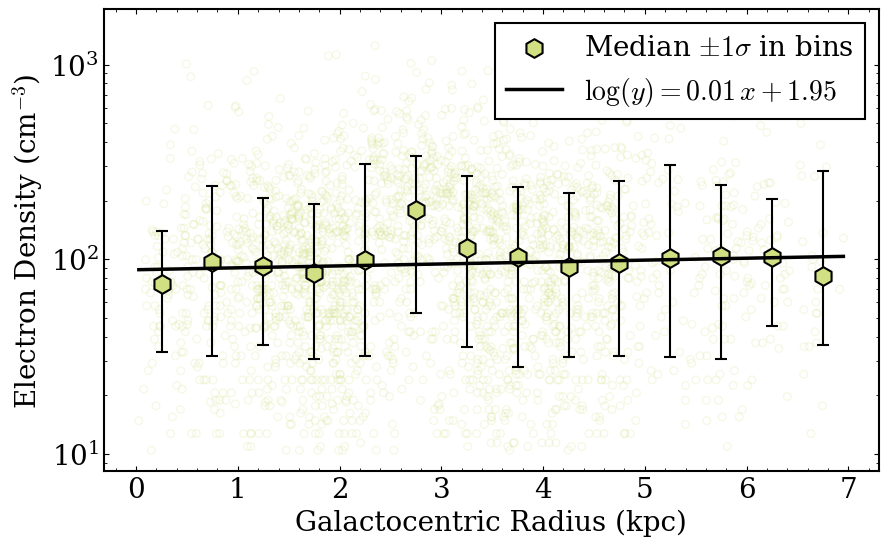

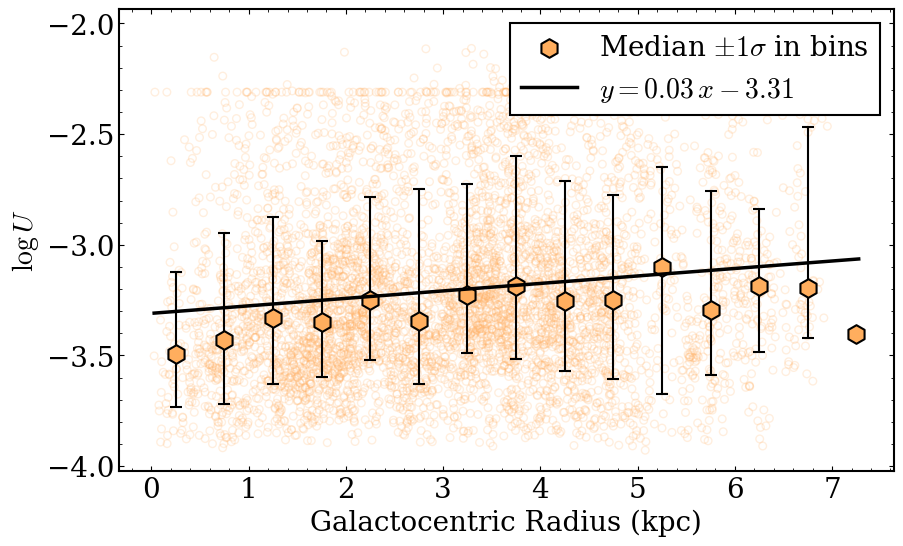

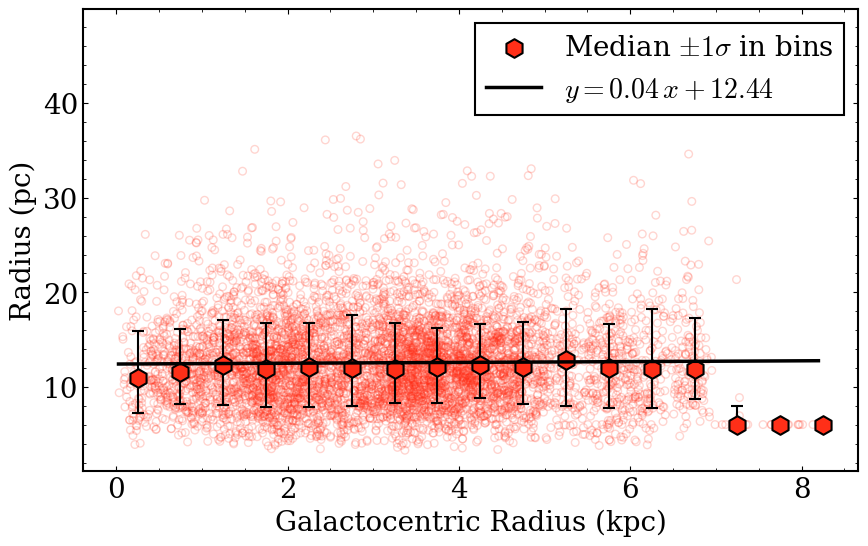

In [23]:
"""
AV
"""
mask = (
    np.isfinite(cat['sum_A_V']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['sum_A_V'] > 0) &
    (cat['sum_A_V'] < 3)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='sum_A_V',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['sum_A_V'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Av (mag)',
    fit_bins=False,
    alpha = 0.2,
    fit_name='radialAv',
    savepath=str(paper_plot_path('M33_HII_Av_vs_Rgal.png', subdir='radial_gradients'))
)

"""
Ha Luminosity
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['L_Ha_sum_dered'] < 1e40) &
    (cat['L_Ha_sum_dered'] > 1e34)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='log_L_Ha_sum_dered',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['L_Ha_sum_dered'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'log$_{10}$[$L_{\rm H\alpha}$ (ergs s$^{-1}$)]',
    ylim=(34, 39),
    # yscale='log',
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=False,
    fit_logy_bins=False,
    fit_name='radialLHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_Rgal.png', subdir='radial_gradients'))
)
"""
ne
"""
mask = (
    np.isfinite(cat['ne_SII_cm3']) &
    np.isfinite(cat['R_gal_kpc']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['ne_SII_cm3'] > 10)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='ne_SII_cm3',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    # ylim=(0, 1000),
    yscale='log',
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_name='radialNe',
    savepath=str(paper_plot_path('M33_HII_ne_SII_cm3_vs_Rgal.png', subdir='radial_gradients'))
)

"""
Ionization parameter
"""

mask = (
    np.isfinite(cat['logU_KK04']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['logU_KK04'] < -2) &
    (cat['logU_KK04'] > -4)
)
results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='logU_KK04',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['logU_KK04'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'$\log U$',
    # ylim=(-4, -2),
    yscale='linear',
    alpha=0.2,
    fit_bins=False,
    fit_name='radialLogU',
    savepath=str(paper_plot_path('M33_HII_log_U_KK04_vs_Rgal.png', subdir='radial_gradients'))
)

"""
Radius
"""

mask = (
    np.isfinite(cat['radius_areaeq_pc']) &
    np.isfinite(cat['R_gal_kpc'])
)
results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='radius_areaeq_pc',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['radius_areaeq_pc'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Radius (pc)',
    # ylim=(-4, -2),
    fit_bins=False,
    yscale='linear',
    alpha=0.2,
    fit_name='radialRadius',
    savepath=str(paper_plot_path('M33_HII_radius_areaeq_pc_vs_Rgal.png', subdir='radial_gradients'))
)


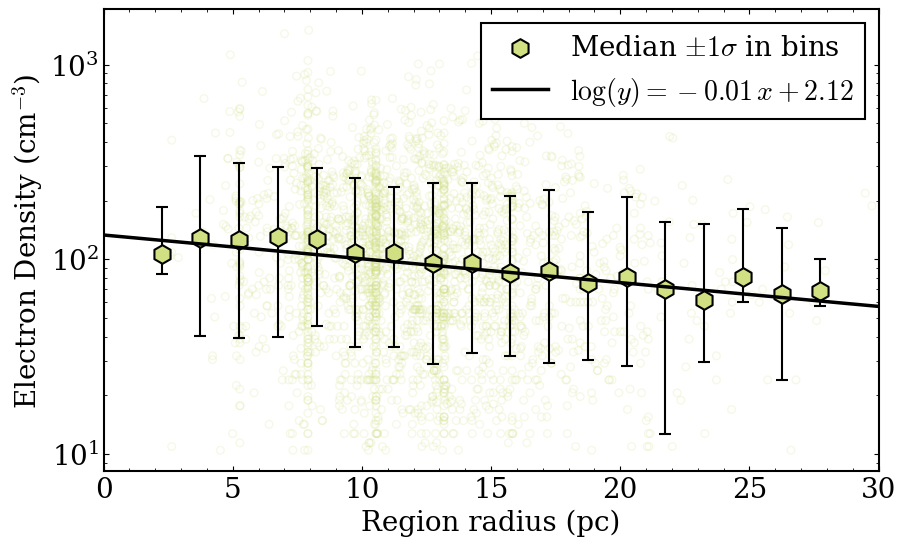

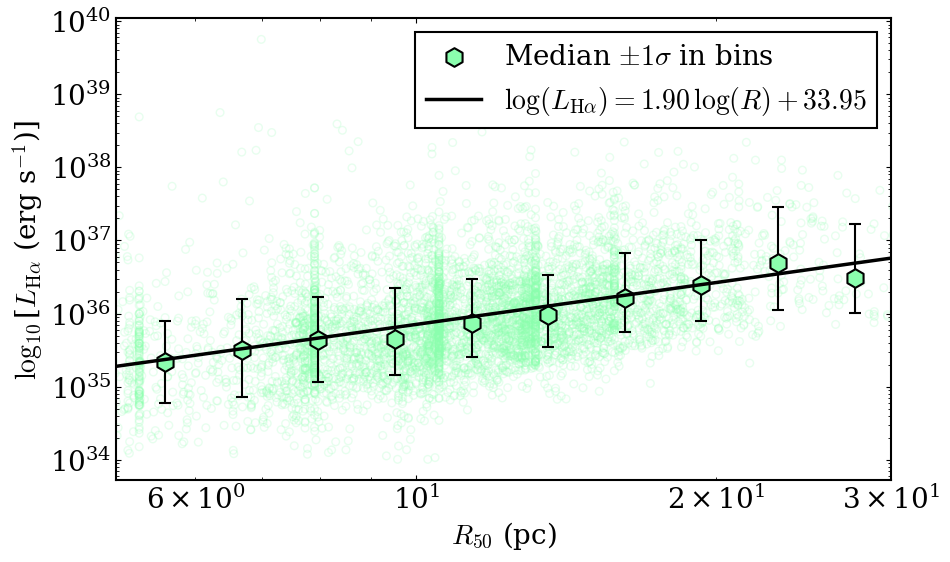

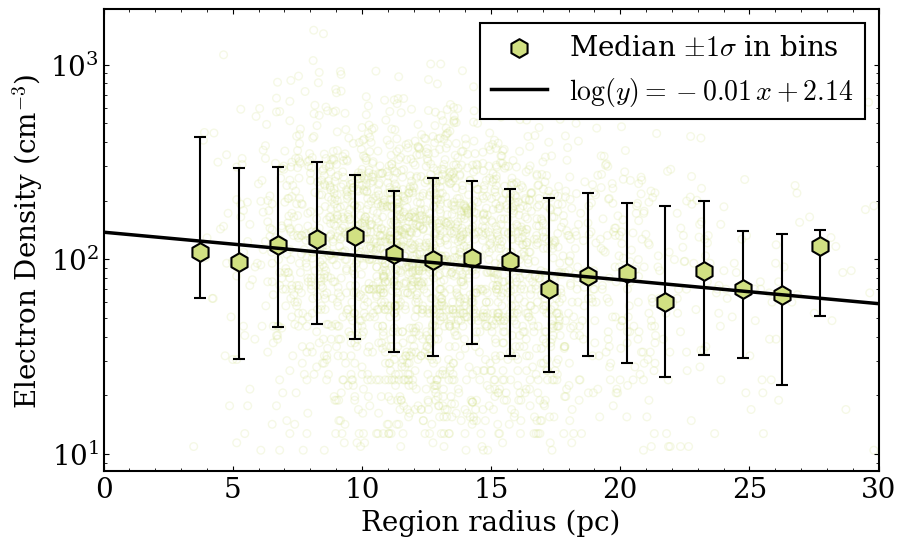

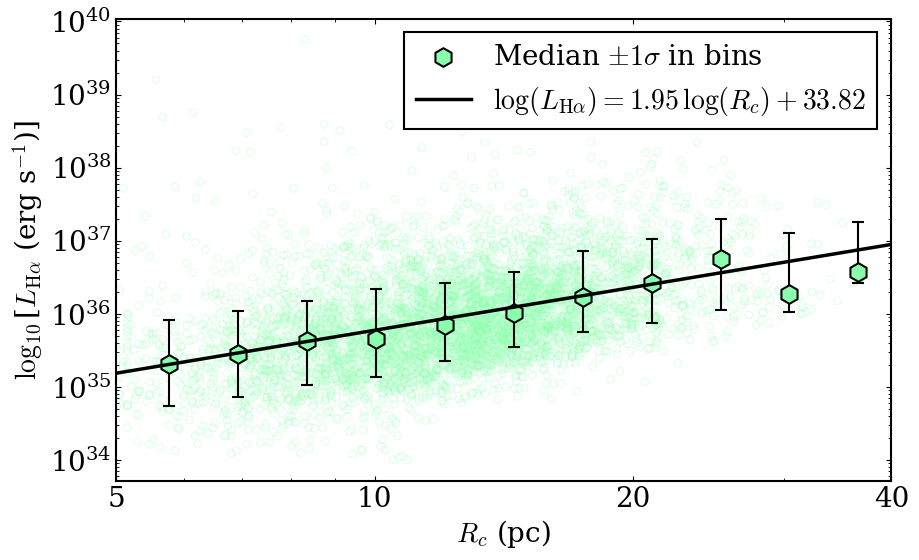

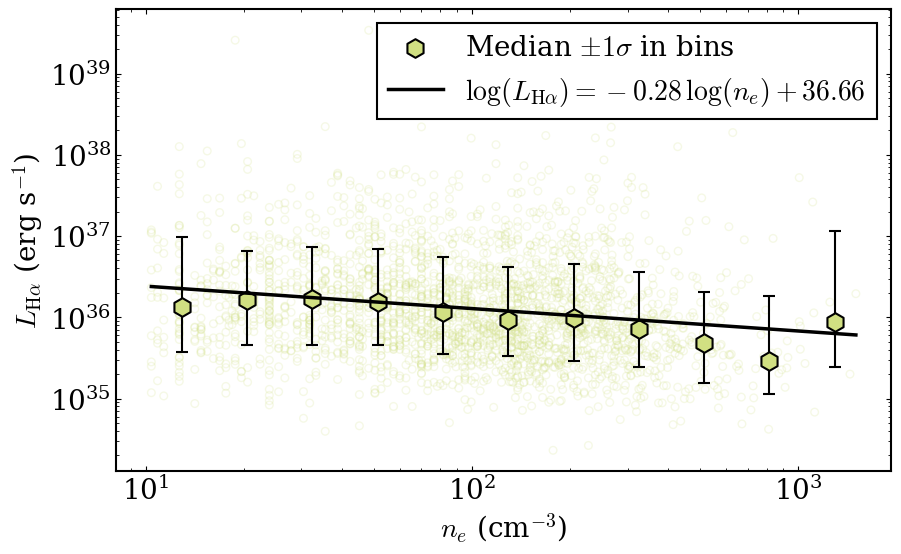

In [24]:
"""
ne
"""
mask = (
    np.isfinite(cat['ne_SII_cm3']) &
    np.isfinite(cat['R_gal_kpc']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['ne_SII_cm3'] > 10)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='radius_p50_pc',
    ycol='ne_SII_cm3',
    mask=mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    # ylim=(0, 1000),
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_name='scalingR50Ne',
    savepath=str(paper_plot_path('M33_HII_ne_SII_cm3_vs_r50.png', subdir='scaling_relations'))
)

"""
Luminosity vs size
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['radius_p50_pc']) &
    (cat['radius_p50_pc'] > 0) &
    (cat['L_Ha_sum_dered'] > 1e34) &
    (cat['L_Ha_sum_dered'] < 1e40)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='radius_p50_pc',
    ycol='L_Ha_sum_dered',
    mask=mask,
    bins=np.geomspace(3, 30, 14),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$R_{50}$ (pc)',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    # ylim=(0, 1000),
    xlim=(5, 30),
    xscale='log',
    yscale='log',
    fit_bins=False,
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_logx_points=True,
    fit_logx_bins=True,
    fit_equation_x=r'R',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_name='scalingR50LHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_r50.png', subdir='scaling_relations'))
)

"""
ne
"""
mask = (
    np.isfinite(cat['ne_SII_cm3']) &
    np.isfinite(cat['R_gal_kpc']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['ne_SII_cm3'] > 10)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='radius_areaeq_pc',
    ycol='ne_SII_cm3',
    mask=mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    # ylim=(0, 1000),
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_bins=False,
    fit_name='scalingAreaNe',
    savepath=str(paper_plot_path('M33_HII_ne_SII_cm3_vs_areaeq.png', subdir='scaling_relations'))
)

"""
Luminosity vs size
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['radius_areaeq_pc']) &
    (cat['radius_areaeq_pc'] > 0) &
    (cat['L_Ha_sum_dered'] > 1e34) &
    (cat['L_Ha_sum_dered'] < 1e40)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='radius_areaeq_pc',
    ycol='L_Ha_sum_dered',
    mask=mask,
    bins=np.geomspace(3, 40, 15),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$R_c$ (pc)',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    # ylim=(0, 1000),
    xlim=(5, 40),
    xscale='log',
    x_major_ticks=(5, 10, 20, 40),
    x_tick_plain=True,
    yscale='log',
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_logx_points=True,
    fit_logx_bins=True,
    fit_equation_x=r'R_c',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_bins=False,
    fit_name='scalingAreaLHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_areaeq.png', subdir='scaling_relations'))
)


"""
Luminosity vs electron density
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['ne_SII_cm3']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] > 10) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['L_Ha_sum_dered'] > 1e34) &
    (cat['L_Ha_sum_dered'] < 1e40)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='ne_SII_cm3',
    ycol='L_Ha_sum_dered',
    mask=mask,
    bins=np.logspace(1, 4, 16),
    color=color_dic['ne_SII_cm3'],
    xlabel=r'$n_e$ (cm$^{-3}$)',
    ylabel=r'$L_{\rm H\alpha}$ (erg s$^{-1}$)',
    xscale='log',
    yscale='log',
    fit_bins=False,
    alpha=0.2,
    fit_logx_points=True,
    fit_logy_points=True,
    fit_equation_x=r'n_e',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_name='scalingNeLHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_ne_SII_cm3.png', subdir='scaling_relations'))
)


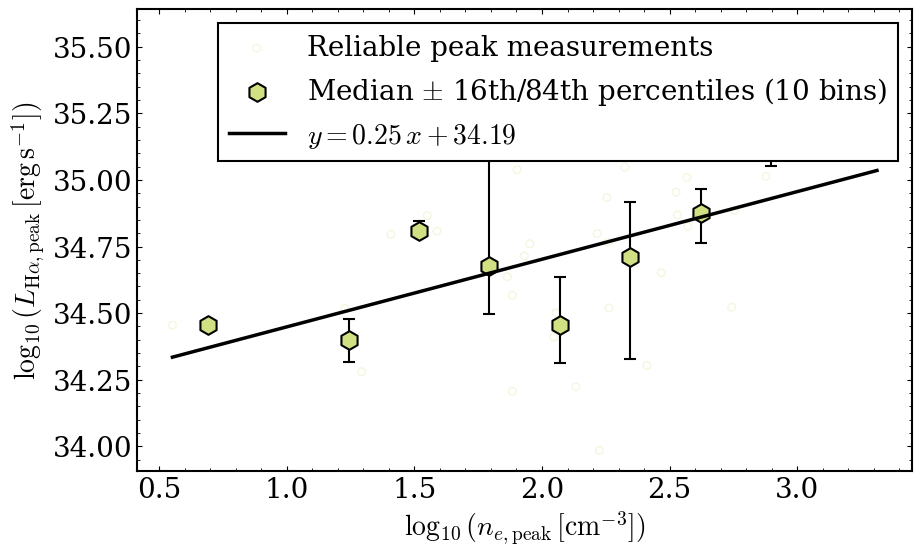

In [25]:
"""
Peak Halpha luminosity vs peak electron density
"""
peak_relation = cat.copy()
peak_relation["log_ne_SII_peak_cm3"] = np.log10(peak_relation["ne_SII_peak_cm3"])

mask = (
    np.isfinite(peak_relation["log_ne_SII_peak_cm3"]) &
    np.isfinite(peak_relation["log_L_Ha_peak_dered"]) &
    peak_relation["ne_SII_peak_reliable"].fillna(False) &
    (peak_relation["ne_SII_peak_cm3"] > 0) &
    (peak_relation["L_Ha_peak_dered"] > 0)
)

if mask.sum() < 2:
    raise ValueError("Need at least two reliable peak-density measurements for this plot.")

x_peak = peak_relation.loc[mask, "log_ne_SII_peak_cm3"].to_numpy()
peak_density_bins = np.linspace(np.nanmin(x_peak), np.nanmax(x_peak), 11)

peak_luminosity_density_results = plot_radial_gradient(
    cat=peak_relation,
    xcol="log_ne_SII_peak_cm3",
    ycol="log_L_Ha_peak_dered",
    mask=mask,
    bins=peak_density_bins,
    color=color_dic.get("ne_SII_cm3", "C6"),
    xlabel=r"$\log_{10}(n_{e,\rm peak}\,[{\rm cm}^{-3}])$",
    ylabel=r"$\log_{10}(L_{{\rm H}\alpha,\rm peak}\,[{\rm erg\,s}^{-1}])$",
    scatter_label="Reliable peak measurements",
    summary_label=r"Median $\pm$ 16th/84th percentiles (10 bins)",
    alpha=0.25,
    fit_points=True,
    fit_bins=False,
    fit_logy_points=False,
    fit_logy_bins=False,
    fit_name="scalingPeakLHaNe",
    savepath=str(paper_plot_path(
        "M33_HII_peak_Ha_luminosity_vs_peak_ne.png",
        subdir="scaling_relations",
    )),
)

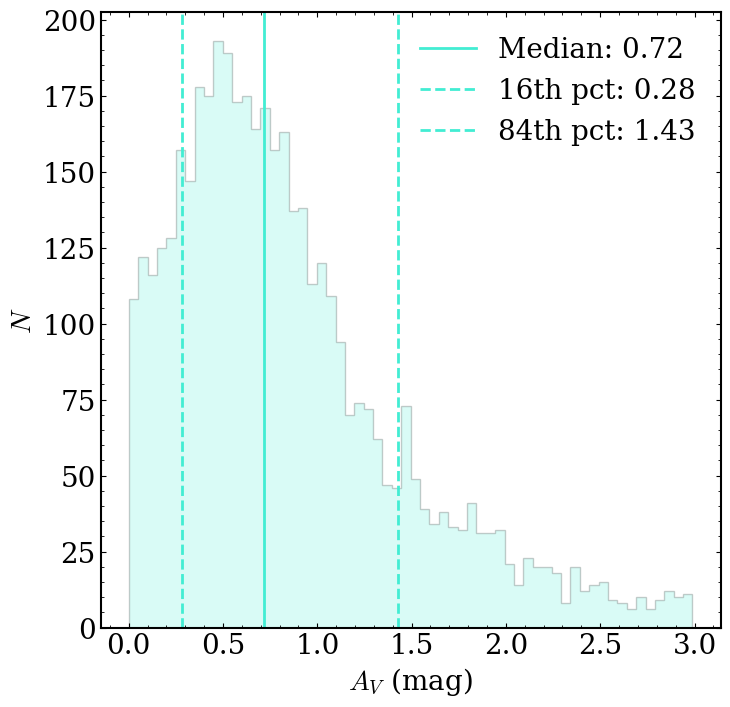

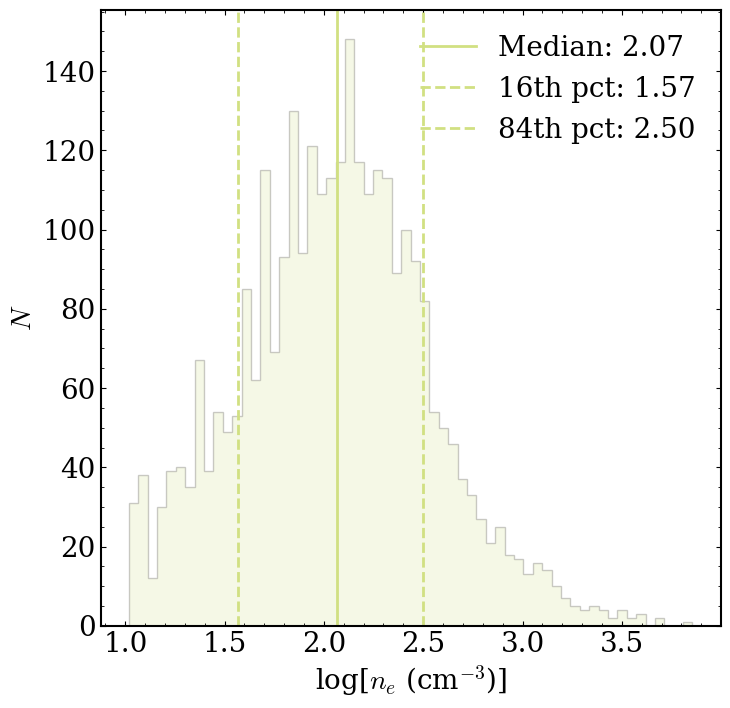

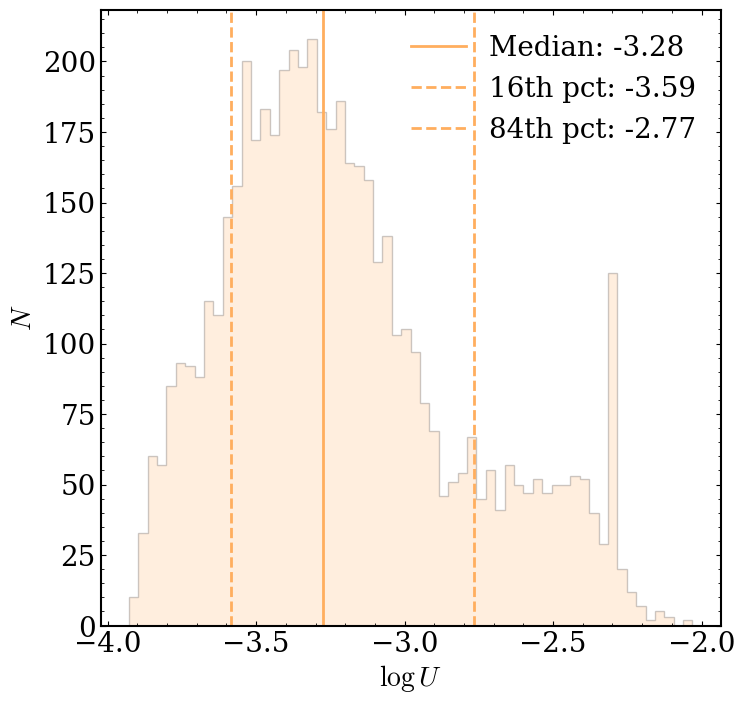

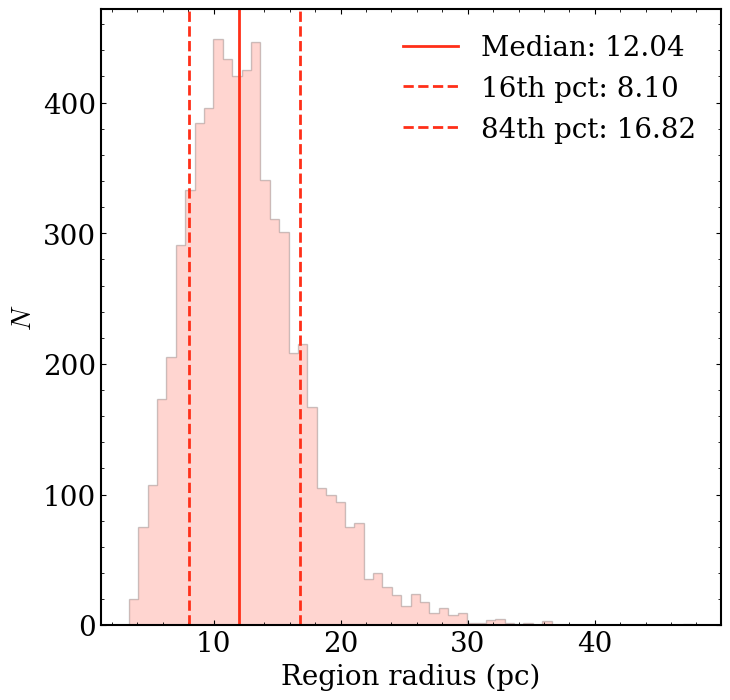

In [26]:
# make a histogram plot of each parameter, showing the median and 16th/84th percentiles
def plot_histogram_with_percentiles(
    cat,
    col,
    mask=None,
    bins=30,
    color='C0',
    xlabel=None,
    ylabel='$N$',
    title=None,
    savepath=None,
    show=True,
    figsize=(8, 8),
    log = False,
):
    data = np.asarray(cat[col])

    if mask is None:
        mask = np.isfinite(data)
    else:
        mask = np.asarray(mask) & np.isfinite(data)

    if log:
        data = np.log10(data[mask])
    else:
        data = data[mask]
        
    if param =='sum_A_V':
        data = data[(data > 0) & (data < 3)]

    if param == 'ne_SII_cm3':
        #log it
        data = data[(data > 10) & (data < 10000)]
        data = np.log10(data)
        
    
    
    median = np.median(data)
    p16 = np.percentile(data, 16)
    p84 = np.percentile(data, 84)
    
    

    plt.figure(figsize=figsize)
    plt.hist(data, bins=bins, color=color, alpha = 0.2, edgecolor='k', histtype='stepfilled', linewidth=1)
    plt.axvline(median, color=color, linestyle='-', lw = 2, label=f'Median: {median:.2f}')
    plt.axvline(p16, color=color, linestyle='--', lw = 2, label=f'16th pct: {p16:.2f}')
    plt.axvline(p84, color=color, linestyle='--', lw = 2, label=f'84th pct: {p84:.2f}')
    plt.xlabel(xlabel if xlabel else col)
    plt.ylabel(ylabel)
    plt.legend(frameon=False)

    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
    else:
        plt.close()
        
params_to_histogram = [
    'sum_A_V',
    'ne_SII_cm3',
    'logU_KK04',
    'radius_areaeq_pc',
]

xlabels = [
    r'$A_V$ (mag)',
    r'log[$n_e$ (cm$^{-3}$)]',
    r'$\log U$',
    r'Region radius (pc)',
]


for param in params_to_histogram:
    mask = np.isfinite(cat[param])
    plot_histogram_with_percentiles(
        cat=cat,
        col=param,
        mask=mask,
        bins=60,
        color=color_dic.get(param, 'C0'),
        xlabel=xlabels[params_to_histogram.index(param)],
        title=f'Histogram of {param}',
        savepath=str(paper_plot_path(f'M33_HII_histogram_{param}.png', subdir='histograms'))
    )


In [27]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_dig_annulus
dig_halpha_anchor
dig_halpha_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
F_Halpha_sum_digsub
F_Halpha_e_sum_digsub
SNR_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
F_Hbeta_sum_digsub
F_Hbeta_e_sum_digsub
SNR_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_mad
[OIII]5007_dig_clip_upper
[OIII]5007_dig_npix
[OIII]5007_dig_npix_used
F_[OIII]5007_sum_digsub
F_[OIII]5007_e_sum_digsub
SNR_[OIII]5007_sum_digsub
F_[SII]6716_sum_nodig
F_[SII]6716_e_sum_nodig
SNR_[SII]6716_sum_nodig
[SII]6716_dig_median
[SII]6716_dig_mad
[SII]6716_dig_clip_upper
[SII]6716_dig_npix
[SII]6716_dig_npix_used
F_[SII]6716_sum_digsub
F_[SII]6716_e_sum_digsub
SNR_[SII]6716_su

Fast Santoro/Clauset fit
N total           = 5904
Best xmin         = 5.293e+36
Best alpha        = 1.9680
Best KS           = 0.0254
N above xmin      = 704
xmin uncertainty  = 1.951e+36
Candidates tested = 588
alpha uncertainty ~ 0.036


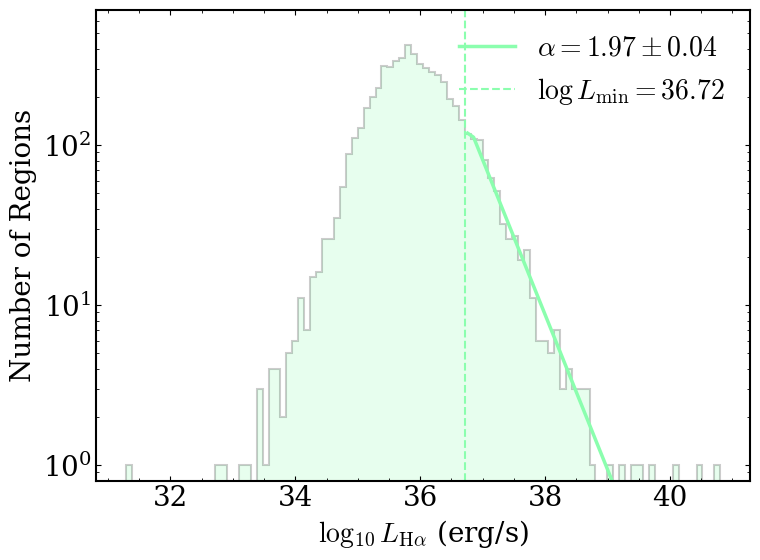

Wrote 237 auto-generated commands to PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex


In [28]:
def empirical_cdf(sorted_x):
    n = len(sorted_x)
    return np.arange(1, n + 1) / n

def model_cdf_continuous_powerlaw(x, xmin, alpha):
    # valid for x >= xmin, alpha > 1
    return 1.0 - (x / xmin) ** (1.0 - alpha)

def ks_statistic_continuous_powerlaw(sorted_x, xmin, alpha):
    F_emp = empirical_cdf(sorted_x)
    F_model = model_cdf_continuous_powerlaw(sorted_x, xmin, alpha)
    return np.max(np.abs(F_emp - F_model))

def mle_alpha_continuous_powerlaw(x_tail, xmin):
    """
    Closed-form MLE for continuous power law:
        p(x) = (alpha-1) xmin^(alpha-1) x^(-alpha), x >= xmin
    """
    n = len(x_tail)
    s = np.sum(np.log(x_tail / xmin))
    if s <= 0:
        return np.nan
    return 1.0 + n / s

def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ------------------------------------------------------------
# Fast Santoro / Clauset fit
# ------------------------------------------------------------
def santoro_powerlaw_fit_fast(
    L,
    alpha_range=(1.0, 3.0),
    xmin_stride=5,
    min_tail_n=30,
    n_bootstrap=0,
    random_seed=42,
    verbose=True
):
    """
    Fast unbinned power-law fit:
    - candidate xmin from empirical points within median ± 1 sigma
    - alpha from closed-form MLE (no alpha grid search)
    - choose best model by minimum KS
    - optional bootstrap for xmin uncertainty

    Parameters
    ----------
    L : array-like
        Linear luminosities.
    alpha_range : tuple
        Allowed range of alpha, e.g. (1.0, 3.0)
    xmin_stride : int
        Only test every xmin_stride-th candidate xmin for speed.
    min_tail_n : int
        Minimum number of points above xmin.
    n_bootstrap : int
        Number of bootstrap runs. Set 0 for speed while testing.
    """
    rng = np.random.default_rng(random_seed)

    L = np.asarray(L, dtype=float)
    L = L[np.isfinite(L)]
    L = L[L > 0]
    L = np.sort(L)

    if len(L) < min_tail_n:
        raise ValueError("Not enough positive luminosities.")

    alpha_min, alpha_max = alpha_range

    # search window for xmin
    med = np.median(L)
    sig = np.std(L, ddof=1)
    xmin_lo = med - sig
    xmin_hi = med + sig

    xmin_candidates = np.unique(L[(L >= xmin_lo) & (L <= xmin_hi)])
    if len(xmin_candidates) == 0:
        raise ValueError("No xmin candidates found in median ± 1 sigma range.")

    # stride for speed
    xmin_candidates = xmin_candidates[::xmin_stride]

    best = None
    fit_rows = []

    # Because L is sorted, we can use searchsorted instead of repeated masking
    for xmin in xmin_candidates:
        i0 = np.searchsorted(L, xmin, side='left')
        x_tail = L[i0:]
        n_tail = len(x_tail)

        if n_tail < min_tail_n:
            continue

        alpha = mle_alpha_continuous_powerlaw(x_tail, xmin)
        if not np.isfinite(alpha):
            continue
        if not (alpha_min <= alpha <= alpha_max):
            continue

        ks = ks_statistic_continuous_powerlaw(x_tail, xmin, alpha)

        row = {
            "xmin": xmin,
            "alpha": alpha,
            "ks": ks,
            "n_tail": n_tail
        }
        fit_rows.append(row)

        if (best is None) or (ks < best["ks"]):
            best = row

    if best is None:
        raise ValueError("No valid fit found. Try decreasing xmin_stride or min_tail_n.")

    # --------------------------------------------------------
    # bootstrap xmin uncertainty
    # --------------------------------------------------------
    bootstrap_xmins = []
    bootstrap_alphas = []

    if n_bootstrap > 0:
        for _ in range(n_bootstrap):
            Lb = rng.choice(L, size=len(L), replace=True)
            Lb.sort()

            med_b = np.median(Lb)
            sig_b = np.std(Lb, ddof=1)
            xmin_lo_b = med_b - sig_b
            xmin_hi_b = med_b + sig_b

            xmin_candidates_b = np.unique(Lb[(Lb >= xmin_lo_b) & (Lb <= xmin_hi_b)])
            xmin_candidates_b = xmin_candidates_b[::xmin_stride]

            best_b = None
            for xmin_b in xmin_candidates_b:
                i0_b = np.searchsorted(Lb, xmin_b, side='left')
                x_tail_b = Lb[i0_b:]
                n_tail_b = len(x_tail_b)

                if n_tail_b < min_tail_n:
                    continue

                alpha_b = mle_alpha_continuous_powerlaw(x_tail_b, xmin_b)
                if not np.isfinite(alpha_b):
                    continue
                if not (alpha_min <= alpha_b <= alpha_max):
                    continue

                ks_b = ks_statistic_continuous_powerlaw(x_tail_b, xmin_b, alpha_b)

                if (best_b is None) or (ks_b < best_b["ks"]):
                    best_b = {"xmin": xmin_b, "alpha": alpha_b, "ks": ks_b}

            if best_b is not None:
                bootstrap_xmins.append(best_b["xmin"])
                bootstrap_alphas.append(best_b["alpha"])

    bootstrap_xmins = np.array(bootstrap_xmins)
    bootstrap_alphas = np.array(bootstrap_alphas)

    xmin_err = np.std(bootstrap_xmins, ddof=1) if len(bootstrap_xmins) > 1 else np.nan

    if verbose:
        print("Fast Santoro/Clauset fit")
        print(f"N total           = {len(L)}")
        print(f"Best xmin         = {best['xmin']:.3e}")
        print(f"Best alpha        = {best['alpha']:.4f}")
        print(f"Best KS           = {best['ks']:.4f}")
        print(f"N above xmin      = {best['n_tail']}")
        print(f"xmin uncertainty  = {xmin_err:.3e}")
        print(f"Candidates tested = {len(fit_rows)}")

    return {
        "L": L,
        "xmin_best": best["xmin"],
        "alpha_best": best["alpha"],
        "ks_best": best["ks"],
        "n_tail_best": best["n_tail"],
        "xmin_err": xmin_err,
        "bootstrap_xmins": bootstrap_xmins,
        "bootstrap_alphas": bootstrap_alphas,
        "fit_rows": fit_rows,
        "xmin_search_range": (xmin_lo, xmin_hi),
    }

# ------------------------------------------------------------
# Optional alpha uncertainty from likelihood curve at best xmin
# This part is cheap because it's only done once.
# ------------------------------------------------------------
def alpha_uncertainty_from_likelihood(
    L, xmin, alpha_best, alpha_range=(1.0, 3.0), n_alpha_grid=400
):
    x_tail = np.sort(L[L >= xmin])
    alpha_grid = np.linspace(alpha_range[0], alpha_range[1], n_alpha_grid)

    n = len(x_tail)
    sum_logx = np.sum(np.log(x_tail))
    log_xmin = np.log(xmin)

    # vectorized log-likelihood
    # logL = n*log(alpha-1) + n*(alpha-1)*log(xmin) - alpha*sum(log x)
    valid = alpha_grid > 1
    logL = np.full_like(alpha_grid, -np.inf, dtype=float)
    a = alpha_grid[valid]
    logL[valid] = n * np.log(a - 1.0) + n * (a - 1.0) * log_xmin - a * sum_logx

    rel_like = np.exp(logL - np.nanmax(logL))

    peak_mask = rel_like > 0.05
    x_fit = alpha_grid[peak_mask]
    y_fit = rel_like[peak_mask]

    if len(x_fit) < 5:
        x_fit = alpha_grid[valid]
        y_fit = rel_like[valid]

    p0 = [1.0, alpha_best, 0.1]
    bounds = ([0.0, alpha_range[0], 1e-4], [np.inf, alpha_range[1], 10.0])

    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=p0, bounds=bounds, maxfev=10000)
        sigma_alpha = popt[2]
    except Exception:
        w = rel_like[valid] / np.sum(rel_like[valid])
        mu = np.sum(w * alpha_grid[valid])
        sigma_alpha = np.sqrt(np.sum(w * (alpha_grid[valid] - mu)**2))
        popt = None

    return sigma_alpha, alpha_grid, rel_like, popt

# ------------------------------------------------------------
# Visualization: overplot unbinned fit on histogram
# ------------------------------------------------------------
def plot_histogram_with_unbinned_powerlaw_fit(results, bins=30, outfile=None):
    L = results["L"]
    xmin = results["xmin_best"]
    alpha = results["alpha_best"]

    logL = np.log10(L)
    counts, edges = np.histogram(logL, bins=bins)
    centers = 0.5 * (edges[:-1] + edges[1:])

    n_tail = np.sum(L >= xmin)
    L_edges = 10**edges

    model_counts = np.full_like(counts, np.nan, dtype=float)

    for i in range(len(counts)):
        L1 = L_edges[i]
        L2 = L_edges[i + 1]

        if L2 <= xmin:
            continue

        L1_eff = max(L1, xmin)
        prob = (xmin ** (alpha - 1.0)) * (L1_eff ** (1.0 - alpha) - L2 ** (1.0 - alpha))
        model_counts[i] = n_tail * prob

    plt.figure(figsize=(8, 6))
    plt.hist(logL, bins=bins, color=color_dic['L_Ha_sum_dered'], alpha = 0.2, edgecolor='k', histtype='stepfilled', linewidth=1.5)
    plt.plot(centers, model_counts, lw=2.5, color= color_dic['L_Ha_sum_dered'],
             label=fr'$\alpha={alpha:.2f} \pm {sigma_alpha:.2f}$')
    plt.axvline(np.log10(xmin), color=color_dic['L_Ha_sum_dered'], ls='--', lw=1.5,
                label=fr'$\log L_{{\min}}={np.log10(xmin):.2f}$')

    plt.xlabel(r'$\log_{10} L_{\mathrm{H}\alpha}$ (erg/s)')
    plt.ylabel('Number of Regions')
    plt.yscale('log')
    plt.minorticks_on()
    plt.legend(frameon=False)
    plt.ylim(0.8,)
    plt.tight_layout()

    if outfile is not None:
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    plt.show()

L = np.asarray(cat['L_Ha_sum_dered'], dtype=float)

luminosity_function_results = santoro_powerlaw_fit_fast(
    L,
    alpha_range=(0.0, 3.0),
    xmin_stride=10,   # bigger = faster
    min_tail_n=30,
    n_bootstrap=10,    # keep at 0 while testing
    verbose=True
)

sigma_alpha, alpha_grid, rel_like, gfit = alpha_uncertainty_from_likelihood(
    luminosity_function_results["L"],
    luminosity_function_results["xmin_best"],
    luminosity_function_results["alpha_best"],
    alpha_range=(1.0, 3.0),
    n_alpha_grid=400
)

print(f"alpha uncertainty ~ {sigma_alpha:.3f}")

plot_histogram_with_unbinned_powerlaw_fit(
    luminosity_function_results,
    bins=100,
    
    outfile=str(paper_plot_path('M33_HII_hist_with_fast_unbinned_powerlaw_fit.png', subdir='luminosity_function'))
)

# Finalize the auto-generated Overleaf numbers after the radial and luminosity fits.
for fit_name, fit_results in radial_gradient_fit_results.items():
    add_fit_values(values, formats, fit_results.get('point_fit_stats'), fit_name)
    add_fit_values(values, formats, fit_results.get('binned_fit_stats'), f'{fit_name}Bins')

values['luminosityFunctionAlpha'] = luminosity_function_results['alpha_best']
values['luminosityFunctionAlphaErr'] = sigma_alpha
values['luminosityFunctionSlope'] = -luminosity_function_results['alpha_best']
values['luminosityFunctionSlopeErr'] = sigma_alpha
values['luminosityFunctionLogLmin'] = np.log10(luminosity_function_results['xmin_best'])
values['luminosityFunctionKSDistance'] = luminosity_function_results['ks_best']
values['luminosityFunctionNTail'] = luminosity_function_results['n_tail_best']
if {'has_snr_in_boundary', 'has_wr_in_boundary'}.issubset(cat.columns):
    snr_hosts = cat['has_snr_in_boundary'].fillna(False).astype(bool)
    wr_hosts = cat['has_wr_in_boundary'].fillna(False).astype(bool)
    values['nRegionsContainingSNR'] = int(snr_hosts.sum())
    values['nRegionsContainingWR'] = int(wr_hosts.sum())
    values['nRegionsContainingSNRAndWR'] = int((snr_hosts & wr_hosts).sum())
    values['nRegionsContainingSNROrWR'] = int((snr_hosts | wr_hosts).sum())
if 'has_pn_in_boundary' in cat.columns:
    pn_hosts = cat['has_pn_in_boundary'].fillna(False).astype(bool)
    values['nRegionsContainingPN'] = int(pn_hosts.sum())
if 'n_pn_in_boundary' in cat.columns:
    values['nCrossMatchedPN'] = int(pd.to_numeric(cat['n_pn_in_boundary'], errors='coerce').fillna(0).sum())
formats.update({
    'luminosityFunctionAlpha': '.4f',
    'luminosityFunctionAlphaErr': '.4f',
    'luminosityFunctionSlope': '.4f',
    'luminosityFunctionSlopeErr': '.4f',
    'luminosityFunctionLogLmin': '.3f',
    'luminosityFunctionKSDistance': '.4f',
})

add_halpha_flux_partition_values(values, formats)
catalog_numbers_path = paper_plot_path('catalog_numbers.tex')
write_latex_commands(catalog_numbers_path, values, formats)
print(f'Wrote {len(values)} auto-generated commands to {catalog_numbers_path}')

Star-forming regions with SNR > 3 in all required lines: 3610
Fast Santoro/Clauset fit
N total           = 3610
Best xmin         = 6.393e+36
Best alpha        = 2.1500
Best KS           = 0.0262
N above xmin      = 450
xmin uncertainty  = 2.502e+36
Candidates tested = 346
Star-forming SNR>3 alpha uncertainty ~ 0.054


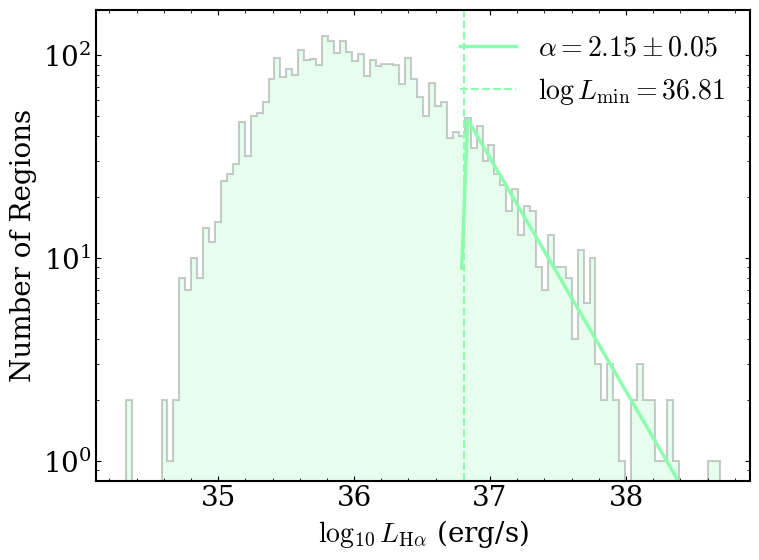

Rewrote PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex with unsuffixed fit commands from the star-forming SNR>3 sample and All-suffixed commands from the full catalog.


{'bin_centers': array([  12.92446596,   20.48389812,   32.46479069,   51.45322575,
          81.54786722,  129.24465962,  204.8389812 ,  324.64790685,
         514.53225752,  815.47867224, 1292.44659623, 2048.38981199,
        3246.47906852, 5145.32257517, 8154.7867224 ]),
 'medians': array([1.80205083e+36, 1.83129249e+36, 2.20364590e+36, 1.90798932e+36,
        1.35349150e+36, 1.05056420e+36, 1.19682991e+36, 8.21647933e+35,
        4.63308620e+35, 3.20681253e+35, 5.91301745e+35,            nan,
                   nan,            nan,            nan]),
 'lower_errs': array([5.26696612e+35, 5.29052635e+35, 5.00382503e+35, 5.07359575e+35,
        4.13251289e+35, 3.50584350e+35, 2.97931167e+35, 2.50868814e+35,
        1.55620723e+35, 1.87238226e+35, 2.29560903e+35,            nan,
                   nan,            nan,            nan]),
 'upper_errs': array([1.08425489e+37, 6.87433161e+36, 7.62016140e+36, 9.83336137e+36,
        6.49931198e+36, 4.50115250e+36, 5.91765100e+36, 4.88422727e

In [29]:
# Star-forming, high-SNR-only versions of key catalog plots.
# Uses the same all-lines SNR > 3 criterion as \nregionssnrthree.

def all_lines_snr_mask(df, snr_cut=3.0):
    snr_cols = [
        'SNR_Halpha_sum',
        'SNR_Hbeta_sum',
        'SNR_[OIII]5007_sum',
        'SNR_[SII]6716_sum',
        'SNR_[NII]6583_sum',
    ]
    missing = [col for col in snr_cols if col not in df.columns]
    if missing:
        raise KeyError(f'Missing SNR columns required for star-forming-only plots: {missing}')
    mask = np.ones(len(df), dtype=bool)
    for col in snr_cols:
        mask &= pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float) > snr_cut
    return mask


starforming_snrthree_mask = (
    (cat['BPT_class_sum_dered'] == 'Star-forming') &
    all_lines_snr_mask(cat, snr_cut=3.0)
)
cat_starforming_snrthree = cat.loc[starforming_snrthree_mask].copy().reset_index(drop=True)
print(f'Star-forming regions with SNR > 3 in all required lines: {len(cat_starforming_snrthree)}')

# The all-catalog fits were accumulated by the preceding plot cells.
# From here onward, collect the same fit names for the star-forming SNR>3 subset.
all_catalog_radial_gradient_fit_results = dict(radial_gradient_fit_results)
radial_gradient_fit_results = {}


def sf_plot_path(filename, subdir=None):
    sf_subdir = 'star_forming_only' if subdir is None else f'star_forming_only/{subdir}'
    return paper_plot_path(filename, subdir=sf_subdir)


# Region-property histograms for the star-forming, high-SNR subset.
for param, xlabel in zip(params_to_histogram, xlabels):
    mask = np.isfinite(cat_starforming_snrthree[param])
    plot_histogram_with_percentiles(
        cat=cat_starforming_snrthree,
        col=param,
        mask=mask,
        bins=60,
        color=color_dic.get(param, 'C0'),
        xlabel=xlabel,
        title=f'Star-forming, SNR>3 histogram of {param}',
        savepath=str(sf_plot_path(f'M33_HII_histogram_{param}.png', subdir='histograms')),
        show=False,
    )


# Radial gradients for the star-forming, high-SNR subset.
sf_radial_specs = [
    dict(
        filename='M33_HII_Av_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='sum_A_V',
        mask=(
            np.isfinite(cat_starforming_snrthree['sum_A_V']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['sum_A_V'] > 0) &
            (cat_starforming_snrthree['sum_A_V'] < 3)
        ),
        color=color_dic['sum_A_V'],
        ylabel=r'Av (mag)',
        fit_bins=False,
        alpha=0.2,
        fit_name='radialAv',
    ),
    dict(
        filename='M33_HII_L_Ha_sum_dered_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='log_L_Ha_sum_dered',
        mask=(
            np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34)
        ),
        color=color_dic['L_Ha_sum_dered'],
        ylabel=r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
        fit_bins=False,
        fit_logy_points=False,
        fit_logy_bins=False,
        alpha=0.2,
        fit_name='radialLHa',
    ),
    dict(
        filename='M33_HII_ne_SII_cm3_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='ne_SII_cm3',
        mask=(
            np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
            (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
            (cat_starforming_snrthree['ne_SII_cm3'] > 10)
        ),
        color=color_dic['ne_SII_cm3'],
        ylabel=r'Electron Density (cm$^{-3}$)',
        yscale='log',
        fit_bins=False,
        fit_logy_points=True,
        fit_logy_bins=True,
        alpha=0.2,
        fit_name='radialNe',
    ),
    dict(
        filename='M33_HII_log_U_KK04_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='logU_KK04',
        mask=(
            np.isfinite(cat_starforming_snrthree['logU_KK04']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['logU_KK04'] < -2) &
            (cat_starforming_snrthree['logU_KK04'] > -4)
        ),
        color=color_dic['logU_KK04'],
        ylabel=r'$\log U$',
        yscale='linear',
        fit_bins=False,
        alpha=0.2,
        fit_name='radialLogU',
    ),
    dict(
        filename='M33_HII_radius_areaeq_pc_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='radius_areaeq_pc',
        mask=(
            np.isfinite(cat_starforming_snrthree['radius_areaeq_pc']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc'])
        ),
        color=color_dic['radius_areaeq_pc'],
        ylabel=r'Radius (pc)',
        yscale='linear',
        fit_bins=False,
        alpha=0.2,
        fit_name='radialRadius',
    ),
]

for spec in sf_radial_specs:
    spec = spec.copy()
    filename = spec.pop('filename')
    plot_radial_gradient(
        cat=cat_starforming_snrthree,
        bins=np.arange(0, 20, 0.5),
        xlabel='Galactocentric Radius (kpc)',
        savepath=str(sf_plot_path(filename, subdir='radial_gradients')),
        show=False,
        **spec,
    )


# Combined radial-gradient figure for the star-forming, high-SNR subset.
sf_combined_radial_gradient_specs = [
    dict(
        ycol='sum_A_V',
        mask=(
            np.isfinite(cat_starforming_snrthree['sum_A_V']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['sum_A_V'] > 0) &
            (cat_starforming_snrthree['sum_A_V'] < 3) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['sum_A_V'],
        ylabel=r'$A_V$ (mag)',
        err_col='sum_A_V_err',
        slope_units=r'mag kpc$^{-1}$',
    ),
    dict(
        ycol='log_L_Ha_sum_dered',
        mask=(
            np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['L_Ha_sum_dered'],
        ylabel=r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
        ylim=(34, 39),
        err_from_fractional_cols=('F_Halpha_sum_dered', 'F_Halpha_e_sum_dered'),
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='ne_SII_cm3',
        mask=(
            np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
            (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
            (cat_starforming_snrthree['ne_SII_cm3'] > 10) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['ne_SII_cm3'],
        ylabel=r'$n_e$ (cm$^{-3}$)',
        yscale='log',
        fit_logy_points=True,
        asymmetric_err_cols=('ne_SII_cm3_mc_minus', 'ne_SII_cm3_mc_plus'),
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='logU_KK04',
        mask=(
            np.isfinite(cat_starforming_snrthree['logU_KK04']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['logU_KK04'] < -2) &
            (cat_starforming_snrthree['logU_KK04'] > -4) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['logU_KK04'],
        ylabel=r'$\log U$',
        err_col='logU_KK04_e',
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='log_P_thermal_SII_over_k',
        mask=(
            np.isfinite(cat_starforming_snrthree['log_P_thermal_SII_over_k']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            cat_starforming_snrthree.get('P_thermal_SII_reliable', pd.Series(True, index=cat_starforming_snrthree.index)).fillna(False) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['log_P_thermal_SII_over_k'],
        ylabel=r'log$_{10}$[$P/k$ (K cm$^{-3}$)]',
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='radius_areaeq_pc',
        mask=(
            np.isfinite(cat_starforming_snrthree['radius_areaeq_pc']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['radius_areaeq_pc'],
        ylabel=r'Radius (pc)',
        slope_units=r'pc kpc$^{-1}$',
    ),
]

sf_combined_radial_gradient_fig, sf_combined_radial_gradient_axes, sf_combined_radial_gradient_hist_axes = plot_combined_radial_gradients_with_histograms(
    cat_starforming_snrthree,
    sf_combined_radial_gradient_specs,
    xcol='R_gal_kpc',
    bins=np.arange(0, 8.5, 0.5),
    xlim=(0, 8),
    figsize=(13.5, 12.5),
    savepath=str(sf_plot_path('M33_HII_radial_gradients_multipanel_with_histograms.png', subdir='radial_gradients')),
    show=False,
)


# Luminosity-size relations for the star-forming, high-SNR subset.
sf_ne_size_mask = (
    np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
    np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
    cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
    (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
    (cat_starforming_snrthree['ne_SII_cm3'] > 10)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='radius_p50_pc',
    ycol='ne_SII_cm3',
    mask=sf_ne_size_mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_name='scalingR50Ne',
    savepath=str(sf_plot_path('M33_HII_ne_SII_cm3_vs_r50.png', subdir='scaling_relations')),
    show=False,
)

sf_lha_r50_mask = (
    np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
    np.isfinite(cat_starforming_snrthree['radius_p50_pc']) &
    (cat_starforming_snrthree['radius_p50_pc'] > 0) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='radius_p50_pc',
    ycol='L_Ha_sum_dered',
    mask=sf_lha_r50_mask,
    bins=np.geomspace(3, 30, 14),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$R_{50}$ (pc)',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    xscale='log',
    yscale='log',
    xlim=(3, 30),
    fit_bins=False,
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_logx_points=True,
    fit_logx_bins=True,
    fit_equation_x=r'R',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_name='scalingR50LHa',
    savepath=str(sf_plot_path('M33_HII_L_Ha_sum_dered_vs_r50.png', subdir='scaling_relations')),
    show=False,
)

plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='radius_areaeq_pc',
    ycol='ne_SII_cm3',
    mask=sf_ne_size_mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_bins=False,
    fit_name='scalingAreaNe',
    savepath=str(sf_plot_path('M33_HII_ne_SII_cm3_vs_areaeq.png', subdir='scaling_relations')),
    show=False,
)

sf_lha_area_mask = (
    np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
    np.isfinite(cat_starforming_snrthree['radius_areaeq_pc']) &
    (cat_starforming_snrthree['radius_areaeq_pc'] > 0) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='radius_areaeq_pc',
    ycol='L_Ha_sum_dered',
    mask=sf_lha_area_mask,
    bins=np.geomspace(3, 40, 15),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$R_c$ (pc)',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    xscale='log',
    x_major_ticks=(3, 10, 20, 40),
    x_tick_plain=True,
    yscale='log',
    xlim=(3, 40),
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_logx_points=True,
    fit_logx_bins=True,
    fit_equation_x=r'R_c',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_bins=False,
    fit_name='scalingAreaLHa',
    savepath=str(sf_plot_path('M33_HII_L_Ha_sum_dered_vs_areaeq.png', subdir='scaling_relations')),
    show=False,
)

# Peak Halpha luminosity vs peak electron density for the star-forming, high-SNR subset.
sf_peak_relation = cat_starforming_snrthree.copy()
sf_peak_relation['log_ne_SII_peak_cm3'] = np.log10(sf_peak_relation['ne_SII_peak_cm3'])
sf_peak_mask = (
    np.isfinite(sf_peak_relation['log_ne_SII_peak_cm3']) &
    np.isfinite(sf_peak_relation['log_L_Ha_peak_dered']) &
    sf_peak_relation['ne_SII_peak_reliable'].fillna(False) &
    (sf_peak_relation['ne_SII_peak_cm3'] > 0) &
    (sf_peak_relation['L_Ha_peak_dered'] > 0)
)
if sf_peak_mask.sum() >= 2:
    sf_x_peak = sf_peak_relation.loc[sf_peak_mask, 'log_ne_SII_peak_cm3'].to_numpy()
    sf_peak_density_bins = np.linspace(np.nanmin(sf_x_peak), np.nanmax(sf_x_peak), 11)
    plot_radial_gradient(
        cat=sf_peak_relation,
        xcol='log_ne_SII_peak_cm3',
        ycol='log_L_Ha_peak_dered',
        mask=sf_peak_mask,
        bins=sf_peak_density_bins,
        color=color_dic.get('ne_SII_cm3', 'C6'),
        xlabel=r'$\log_{10}(n_{e,\rm peak}\,[{\rm cm}^{-3}])$',
        ylabel=r'$\log_{10}(L_{{\rm H}\alpha,\rm peak}\,[{\rm erg\,s}^{-1}])$',
        scatter_label='Reliable peak measurements',
        summary_label=r'Median $\pm$ 16th/84th percentiles (10 bins)',
        alpha=0.25,
        fit_points=True,
        fit_bins=False,
        fit_logy_points=False,
        fit_logy_bins=False,
        fit_name='scalingPeakLHaNe',
        savepath=str(sf_plot_path('M33_HII_peak_Ha_luminosity_vs_peak_ne.png', subdir='scaling_relations')),
        show=False,
    )
else:
    print('Skipping star-forming peak luminosity-density fit: fewer than two reliable points.')


# Luminosity function for the star-forming, high-SNR subset.
if 'luminosity_function_pdf_points' not in globals():
    def luminosity_function_pdf_points(logL, bins):
        logL = np.asarray(logL, dtype=float)
        logL = logL[np.isfinite(logL)]
        if len(logL) == 0:
            return np.array([]), np.array([]), np.array([])
        counts, edges = np.histogram(logL, bins=bins)
        centers = 0.5 * (edges[:-1] + edges[1:])
        widths = np.diff(edges)
        pdf = counts / (np.sum(counts) * widths)
        detected = counts > 0
        return centers[detected], pdf[detected], counts[detected]
if 'logL_bins' not in globals():
    logL_bins = np.arange(33.0, 40.6, 0.2)
sf_logL = pd.to_numeric(cat_starforming_snrthree['log_L_Ha_sum_dered'], errors='coerce').to_numpy(dtype=float)
sf_logL = sf_logL[np.isfinite(sf_logL)]
fig, ax = plt.subplots(figsize=(8, 6))
centers, pdf, counts = luminosity_function_pdf_points(sf_logL, logL_bins)
if len(centers) > 0:
    ax.plot(
        centers,
        pdf,
        marker='o',
        markersize=6,
        linewidth=2.5,
        color=color_dic['L_Ha_sum_dered'],
        label=f'Star-forming, SNR>3 (N={len(sf_logL)})',
    )
ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel(r'Probability density per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=12)
fig.tight_layout()
fig.savefig(
    sf_plot_path('M33_HII_Halpha_luminosity_function_pdf.png', subdir='luminosity_functions'),
    dpi=300,
    bbox_inches='tight',
)
plt.close(fig)

sf_L = pd.to_numeric(cat_starforming_snrthree['L_Ha_sum_dered'], errors='coerce').to_numpy(dtype=float)
sf_luminosity_function_results = santoro_powerlaw_fit_fast(
    sf_L,
    alpha_range=(0.0, 3.0),
    xmin_stride=10,
    min_tail_n=30,
    n_bootstrap=10,
    verbose=True,
)
sf_sigma_alpha, sf_alpha_grid, sf_rel_like, sf_gfit = alpha_uncertainty_from_likelihood(
    sf_luminosity_function_results['L'],
    sf_luminosity_function_results['xmin_best'],
    sf_luminosity_function_results['alpha_best'],
    alpha_range=(1.0, 3.0),
    n_alpha_grid=400,
)
print(f'Star-forming SNR>3 alpha uncertainty ~ {sf_sigma_alpha:.3f}')

_sigma_alpha_full_catalog = sigma_alpha
try:
    sigma_alpha = sf_sigma_alpha
    plot_histogram_with_unbinned_powerlaw_fit(
        sf_luminosity_function_results,
        bins=100,
        outfile=str(sf_plot_path(
            'M33_HII_hist_with_fast_unbinned_powerlaw_fit.png',
            subdir='luminosity_function',
        )),
    )
finally:
    sigma_alpha = _sigma_alpha_full_catalog

# Rewrite the Overleaf numbers so unsuffixed fit commands refer to the
# star-forming SNR>3 sample, and all-catalog fit commands carry an All suffix.
def add_fit_values_with_suffix(values, formats, fit, prefix, suffix='All', fmt='.4f'):
    if not fit:
        return
    keys = {
        'slope': f'{prefix}Slope{suffix}',
        'intercept': f'{prefix}Intercept{suffix}',
        'slope_stderr': f'{prefix}SlopeErr{suffix}',
        'intercept_stderr': f'{prefix}InterceptErr{suffix}',
        'n_points': f'{prefix}N{suffix}',
    }
    for source, command in keys.items():
        if source not in fit:
            continue
        values[command] = fit[source]
        if source != 'n_points':
            formats[command] = fmt

for fit_name, fit_results in all_catalog_radial_gradient_fit_results.items():
    add_fit_values_with_suffix(values, formats, fit_results.get('point_fit_stats'), fit_name, suffix='All')
    add_fit_values_with_suffix(values, formats, fit_results.get('binned_fit_stats'), fit_name, suffix='BinsAll')

def clear_fit_values(values, formats, prefix):
    for suffix in ['Slope', 'Intercept', 'SlopeErr', 'InterceptErr', 'N']:
        values.pop(f'{prefix}{suffix}', None)
        formats.pop(f'{prefix}{suffix}', None)

for fit_name in all_catalog_radial_gradient_fit_results:
    clear_fit_values(values, formats, fit_name)
    clear_fit_values(values, formats, f'{fit_name}Bins')

for fit_name, fit_results in radial_gradient_fit_results.items():
    add_fit_values(values, formats, fit_results.get('point_fit_stats'), fit_name)
    add_fit_values(values, formats, fit_results.get('binned_fit_stats'), f'{fit_name}Bins')

# Preserve full-catalog luminosity-function values with an All suffix.
values['luminosityFunctionAlphaAll'] = luminosity_function_results['alpha_best']
values['luminosityFunctionAlphaErrAll'] = sigma_alpha
values['luminosityFunctionSlopeAll'] = -luminosity_function_results['alpha_best']
values['luminosityFunctionSlopeErrAll'] = sigma_alpha
values['luminosityFunctionLogLminAll'] = np.log10(luminosity_function_results['xmin_best'])
values['luminosityFunctionKSDistanceAll'] = luminosity_function_results['ks_best']
values['luminosityFunctionNTailAll'] = luminosity_function_results['n_tail_best']

# Use the current unsuffixed luminosity-function names for the star-forming SNR>3 sample.
values['luminosityFunctionAlpha'] = sf_luminosity_function_results['alpha_best']
values['luminosityFunctionAlphaErr'] = sf_sigma_alpha
values['luminosityFunctionSlope'] = -sf_luminosity_function_results['alpha_best']
values['luminosityFunctionSlopeErr'] = sf_sigma_alpha
values['luminosityFunctionLogLmin'] = np.log10(sf_luminosity_function_results['xmin_best'])
values['luminosityFunctionKSDistance'] = sf_luminosity_function_results['ks_best']
values['luminosityFunctionNTail'] = sf_luminosity_function_results['n_tail_best']

formats.update({
    'luminosityFunctionAlpha': '.4f',
    'luminosityFunctionAlphaErr': '.4f',
    'luminosityFunctionSlope': '.4f',
    'luminosityFunctionSlopeErr': '.4f',
    'luminosityFunctionLogLmin': '.3f',
    'luminosityFunctionKSDistance': '.4f',
    'luminosityFunctionAlphaAll': '.4f',
    'luminosityFunctionAlphaErrAll': '.4f',
    'luminosityFunctionSlopeAll': '.4f',
    'luminosityFunctionSlopeErrAll': '.4f',
    'luminosityFunctionLogLminAll': '.3f',
    'luminosityFunctionKSDistanceAll': '.4f',
})

add_halpha_flux_partition_values(values, formats)
catalog_numbers_path = paper_plot_path('catalog_numbers.tex')
write_latex_commands(catalog_numbers_path, values, formats)
print(
    f'Rewrote {catalog_numbers_path} with unsuffixed fit commands from the '
    f'star-forming SNR>3 sample and All-suffixed commands from the full catalog.'
)


# Luminosity versus electron density for the star-forming, high-SNR subset.
sf_lha_ne_mask = (
    np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
    np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
    cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
    (cat_starforming_snrthree['ne_SII_cm3'] > 10) &
    (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='ne_SII_cm3',
    ycol='L_Ha_sum_dered',
    mask=sf_lha_ne_mask,
    bins=np.logspace(1, 4, 16),
    color=color_dic['ne_SII_cm3'],
    xlabel=r'$n_e$ (cm$^{-3}$)',
    ylabel=r'$L_{\rm H\alpha}$ (erg s$^{-1}$)',
    xscale='log',
    yscale='log',
    fit_bins=False,
    alpha=0.2,
    fit_logx_points=True,
    fit_logy_points=True,
    fit_equation_x=r'n_e',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_name='scalingNeLHa',
    savepath=str(sf_plot_path('M33_HII_L_Ha_sum_dered_vs_ne_SII_cm3.png', subdir='scaling_relations')),
    show=False,
)


In [30]:

# --- helper: parse "Paper (Year)" out of your existing label strings ---
_paper_re = re.compile(r"\(([^()]+?\d{4})\)\s*$")  # grabs content in last "(...)" that ends with a year


def extract_paper_id(label: str) -> str:
    """
    Returns something stable like:
      'Kobulnicky & Kewley 2004'
      'Dopita et al. 2016'
    Falls back to full label if it can't parse.
    """
    m = _paper_re.search(label)
    return m.group(1).strip() if m else str(label).strip()


METALLICITY_COLUMN_INFO = {
    'Z_12logOH': ('KK04 iterative', 'R23/O32'),
    'Z_N2_Brazzini2024': ('Brazzini et al. 2024', 'N2'),
    'Z_O3N2_Brazzini2024': ('Brazzini et al. 2024', 'O3N2'),
    'Z_N2S2Halpha_Brazzini2024': ('Brazzini et al. 2024', 'N2S2Halpha'),
    'Z_R3_Brazzini2024': ('Brazzini et al. 2024', 'R3'),
    'Z_R23_Maiolino2008': ('Maiolino et al. 2008', 'R23'),
    'Z_N2_Maiolino2008': ('Maiolino et al. 2008', 'N2'),
    'Z_R23_Curti2017': ('Curti et al. 2017', 'R23'),
    'Z_R3_Curti2017': ('Curti et al. 2017', 'R3'),
    'Z_N2_Curti2017': ('Curti et al. 2017', 'N2'),
    'Z_O3N2_Curti2017': ('Curti et al. 2017', 'O3N2'),
    'Z_R_Pilyugin2016_highN2': ('Pilyugin et al. 2016 high N2', 'R'),
    'Z_R_Pilyugin2016_lowN2': ('Pilyugin et al. 2016 low N2', 'R'),
    'Z_S_Pilyugin2016_highN2': ('Pilyugin et al. 2016 high N2', 'S'),
    'Z_S_Pilyugin2016_lowN2': ('Pilyugin et al. 2016 low N2', 'S'),
    'Z_R23_KK2004': ('Kobulnicky & Kewley 2004', 'R23'),
    'Z_NII_KD2002': ('Kewley & Dopita 2002', 'NII'),
    'Z_D2016': ('Dopita et al. 2016', 'N2S2Halpha'),
    'Z_O3N2_M2013': ('Marino et al. 2013', 'O3N2'),
    'Z_N2_M2013': ('Marino et al. 2013', 'N2'),
    'Z_C2001': ('Charlot & Longhetti 2001', 'CL01'),
    'Z_N2_PP2004': ('Pettini \\& Pagel 2004', 'N2'),
    'Z_O3N2_PP2004': ('Pettini \\& Pagel 2004', 'O3N2'),
    'Z_N2_Brown2016': ('Brown et al. 2016', 'N2'),
    'Z_O3N2_Brown2016': ('Brown et al. 2016', 'O3N2'),
    'Z_N2O2_Brown2016': ('Brown et al. 2016', 'N2O2'),
    'Z_N2O2_KD2002': ('Kewley & Dopita 2002', 'N2O2'),
}


def _infer_metallicity_column_info(col):
    stem = col.removeprefix('Z_')
    parts = stem.split('_')
    if len(parts) == 1:
        return (parts[0], parts[0])
    indicator = parts[0]
    reference = ' '.join(parts[1:])
    return (reference, indicator)


def build_metallicity_calibrations(df, include_all=True):
    """Build the calibration registry for every saved metallicity column in the catalog."""
    nan_series = lambda: pd.Series(np.nan, index=df.index)
    cols = [
        col for col in df.columns
        if col.startswith('Z_') and not col.endswith('_e') and f'{col}_e' in df.columns
    ]
    if not include_all:
        cols = [col for col in METALLICITY_COLUMN_INFO if col in df.columns]
    ordered = [col for col in METALLICITY_COLUMN_INFO if col in cols]
    ordered += sorted(col for col in cols if col not in METALLICITY_COLUMN_INFO)
    calibrations = []
    for col in ordered:
        label, line_group = METALLICITY_COLUMN_INFO.get(col, _infer_metallicity_column_info(col))
        calibrations.append((df[col], df.get(f'{col}_e', nan_series()), label, line_group, col))
    return calibrations


# --- unified calibration registry ---
# Each entry: (data_array, error_array, label, line_group, column_name)
calibrations = build_metallicity_calibrations(cat)


In [31]:
from itertools import cycle

def build_style_map(calibrations):
    paper_ids = []
    for item in calibrations:
        label = item[2]
        pid = extract_paper_id(label)
        if pid not in paper_ids:
            paper_ids.append(pid)
    print(len(paper_ids), "unique papers found.")
    cmap = plt.get_cmap('rainbow')
    colors = cmap(np.linspace(0, 1, 8))
    marker_cycle = cycle(['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', '8'])

    style_map = {}
    for i, pid in enumerate(paper_ids):
        style_map[pid] = {
            "color": colors[i % len(colors)],
            "marker": next(marker_cycle),
        }
    return style_map

style_map = build_style_map(calibrations)


13 unique papers found.


In [32]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_dig_annulus
dig_halpha_anchor
dig_halpha_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
F_Halpha_sum_digsub
F_Halpha_e_sum_digsub
SNR_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
F_Hbeta_sum_digsub
F_Hbeta_e_sum_digsub
SNR_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_mad
[OIII]5007_dig_clip_upper
[OIII]5007_dig_npix
[OIII]5007_dig_npix_used
F_[OIII]5007_sum_digsub
F_[OIII]5007_e_sum_digsub
SNR_[OIII]5007_sum_digsub
F_[SII]6716_sum_nodig
F_[SII]6716_e_sum_nodig
SNR_[SII]6716_sum_nodig
[SII]6716_dig_median
[SII]6716_dig_mad
[SII]6716_dig_clip_upper
[SII]6716_dig_npix
[SII]6716_dig_npix_used
F_[SII]6716_sum_digsub
F_[SII]6716_e_sum_digsub
SNR_[SII]6716_su

In [33]:
# print(np.nanmean(cat['Z_O3N2_PP2004_e']))
# print(np.nanmean(cat['Z_O3N2_Brown2016_e']))
# print(np.nanmean(cat['Z_N2O2_Brown2016_e']))


In [34]:
def fit_line_and_plot(
    x, y, label, *,
    yerr=None,
    do_plot=True,
    alpha=0.1,
    s=30,
    color=None,
    marker='o',
    shade_alpha=0.25,
    outline_lw=5,
    line_lw=3,
    bins=None,
    plot_bins=True,
    bin_min_count=1,
    bin_stat='median',
    bin_percentiles=(16, 84),
    bin_marker='h',
    bin_s=180,
    bin_edgecolor='k',
    bin_lw=1.5,
    capsize=4,
    capthick=1.5,
    fit_all_points=True,
    fit_binned=False,
    fit_range=None,
    fit_binned_range=None,
    fit_logy_points=False,
    fit_logy_bins=False,
    log_base=10,
    scatter_hollow=True,
    show_band=True,
    show_point_errors=False,
    legend=True,
    legend_loc='upper right',
    legend_frame=True,
):
    import numpy as np
    import matplotlib.pyplot as plt

    x = np.asarray(x, float)
    y = np.asarray(y, float)
    if yerr is None:
        yerr = np.full_like(y, np.nan, dtype=float)
    else:
        yerr = np.asarray(yerr, float)

    def _apply_log(arr, log_base=10):
        if log_base == 10:
            return np.log10(arr)
        elif log_base in ['e', np.e]:
            return np.log(arr)
        raise ValueError("log_base must be 10 or 'e'")

    def _transform_yerr(yf, yerrf, fit_logy=False, log_base=10):
        if not fit_logy:
            return yerrf
        with np.errstate(divide='ignore', invalid='ignore'):
            if log_base == 10:
                return yerrf / (np.log(10.0) * yf)
            return yerrf / yf

    def _fit_linear(xf, yf, yerrf=None, fit_logy=False, log_base=10):
        xf = np.asarray(xf, float)
        yf = np.asarray(yf, float)
        if yerrf is None:
            yerrf = np.full_like(yf, np.nan, dtype=float)
        else:
            yerrf = np.asarray(yerrf, float)

        ok = np.isfinite(xf) & np.isfinite(yf)
        xf = xf[ok]
        yf = yf[ok]
        yerrf = yerrf[ok]

        if fit_logy:
            pos = yf > 0
            xf = xf[pos]
            yerrf = yerrf[pos]
            yf = yf[pos]
            if len(yf) < 2:
                return np.nan, np.nan, xf, yf, yerrf
            yerrf = _transform_yerr(yf, yerrf, fit_logy=True, log_base=log_base)
            yf = _apply_log(yf, log_base=log_base)

        if len(xf) < 2:
            return np.nan, np.nan, xf, yf, yerrf

        good_err = np.isfinite(yerrf) & (yerrf > 0)
        if good_err.sum() >= 2:
            m, b = np.polyfit(xf[good_err], yf[good_err], 1, w=1.0 / yerrf[good_err])
        else:
            m, b = np.polyfit(xf, yf, 1)
        return m, b, xf, yf, yerrf

    def _eval_fit(m, b, xgrid, fit_logy=False, log_base=10):
        if fit_logy:
            y_model = m * xgrid + b
            if log_base == 10:
                return 10**y_model
            elif log_base in ['e', np.e]:
                return np.exp(y_model)
        return m * xgrid + b

    def _fit_label(m, b, which='points', fit_logy=False, log_base=10, weighted=False):
        suffix = "weighted" if weighted else which
        if fit_logy:
            if log_base == 10:
                return fr'$\log(y) = {m:.2f}x {b:+.2f}$ ({suffix})'
            return fr'$\ln(y) = {m:.2f}x {b:+.2f}$ ({suffix})'
        return fr'$y = {m:.2f}x {b:+.2f}$ ({suffix})'

    msk = np.isfinite(x) & np.isfinite(y)
    if msk.sum() < 2:
        if do_plot:
            plt.scatter(x, y, alpha=alpha, s=s, color=color)
        return {
            'point_fit': (np.nan, np.nan),
            'binned_fit': (np.nan, np.nan),
            'bin_centers': None,
            'bin_values': None,
            'bin_yerr_low': None,
            'bin_yerr_high': None,
            'bin_counts': None,
        }

    xf = x[msk]
    yf = y[msk]
    yef = yerr[msk]

    bin_centers = None
    bin_values = None
    bin_yerr_low = None
    bin_yerr_high = None
    bin_counts = None
    binned_fit = (np.nan, np.nan)

    if bins is not None and plot_bins:
        bins = np.asarray(bins, float)
        bin_centers_ = 0.5 * (bins[:-1] + bins[1:])
        vals, lo, hi, cnt = [], [], [], []
        for i in range(len(bins) - 1):
            in_bin = (xf >= bins[i]) & (xf < bins[i + 1])
            nbin = np.sum(in_bin)
            cnt.append(nbin)
            if nbin >= bin_min_count:
                yb = yf[in_bin]
                yeb = yef[in_bin]
                if bin_stat == 'median':
                    y0 = np.median(yb)
                else:
                    raise ValueError("Currently only bin_stat='median' is supported.")
                p_lo, p_hi = np.percentile(yb, bin_percentiles)
                base_lo = y0 - p_lo
                base_hi = p_hi - y0
                finite_yeb = yeb[np.isfinite(yeb) & (yeb > 0)]
                med_err = np.median(finite_yeb) if finite_yeb.size else 0.0
                vals.append(y0)
                lo.append(np.sqrt(base_lo**2 + med_err**2))
                hi.append(np.sqrt(base_hi**2 + med_err**2))
            else:
                vals.append(np.nan)
                lo.append(np.nan)
                hi.append(np.nan)
        bin_centers = np.asarray(bin_centers_)
        bin_values = np.asarray(vals)
        bin_yerr_low = np.asarray(lo)
        bin_yerr_high = np.asarray(hi)
        bin_counts = np.asarray(cnt)

    if do_plot and show_point_errors:
        valid_err = np.isfinite(yef) & (yef > 0)
        if np.any(valid_err):
            plt.errorbar(xf[valid_err], yf[valid_err], yerr=yef[valid_err], fmt='none', ecolor=color, alpha=max(alpha, 0.15), elinewidth=0.8, capsize=0, zorder=0)

    if do_plot:
        scatter_kwargs = dict(alpha=alpha, s=s, marker=marker, zorder=1)
        if scatter_hollow:
            scatter_kwargs.update(facecolors='none', edgecolors=color, linewidths=1.0)
        else:
            scatter_kwargs.update(c=color, edgecolors=color, linewidths=0.1)
        plt.scatter(xf, yf, **scatter_kwargs)

    point_fit = (np.nan, np.nan)
    if fit_all_points:
        xfit_data = xf.copy()
        yfit_data = yf.copy()
        yerr_data = yef.copy()
        if fit_range is not None:
            xmin, xmax = fit_range
            keep = (xfit_data >= xmin) & (xfit_data <= xmax)
            xfit_data = xfit_data[keep]
            yfit_data = yfit_data[keep]
            yerr_data = yerr_data[keep]
        m, b, xfit_use, yfit_use, yerr_use = _fit_linear(xfit_data, yfit_data, yerr_data, fit_logy=fit_logy_points, log_base=log_base)
        point_fit = (m, b)
        if do_plot and np.isfinite(m) and np.isfinite(b):
            xline = np.linspace(np.nanmin(xfit_data if len(xfit_data) else xf), np.nanmax(xfit_data if len(xfit_data) else xf), 300)
            yline = _eval_fit(m, b, xline, fit_logy=fit_logy_points, log_base=log_base)
            if show_band and (not fit_logy_points) and len(xfit_use) > 2:
                n = len(xfit_use)
                xbar = np.mean(xfit_use)
                yfit_pts = m * xfit_use + b
                s_err = np.sqrt(np.sum((yfit_use - yfit_pts) ** 2) / (n - 2))
                Sxx = np.sum((xfit_use - xbar) ** 2)
                if Sxx > 0:
                    y_err = s_err * np.sqrt(1 / n + (xline - xbar) ** 2 / Sxx)
                    plt.fill_between(xline, yline - y_err, yline + y_err, color=color, alpha=shade_alpha, zorder=2)
            plt.plot(xline, yline, color='black', linewidth=outline_lw, linestyle='-', zorder=3)
            weighted = np.isfinite(yerr_use).sum() >= 2
            plt.plot(xline, yline, color=color, linewidth=line_lw, linestyle='-', label=_fit_label(m, b, which='points', fit_logy=fit_logy_points, log_base=log_base, weighted=weighted), zorder=4)

    if do_plot and (bin_centers is not None):
        valid_bins = np.isfinite(bin_centers) & np.isfinite(bin_values) & np.isfinite(bin_yerr_low) & np.isfinite(bin_yerr_high)
        if np.any(valid_bins):
            plt.errorbar(bin_centers[valid_bins], bin_values[valid_bins], yerr=[bin_yerr_low[valid_bins], bin_yerr_high[valid_bins]], fmt='none', ecolor='k', elinewidth=1.5, capsize=capsize, capthick=capthick, zorder=5)
            plt.scatter(bin_centers[valid_bins], bin_values[valid_bins], s=bin_s, marker=bin_marker, facecolors=color, edgecolors=bin_edgecolor, linewidths=bin_lw, zorder=6, label=f'{label} bins')

    if fit_binned and (bin_centers is not None) and (bin_values is not None):
        valid_bins = np.isfinite(bin_centers) & np.isfinite(bin_values)
        xb = bin_centers[valid_bins]
        yb = bin_values[valid_bins]
        yeb = 0.5 * (bin_yerr_low[valid_bins] + bin_yerr_high[valid_bins]) if bin_yerr_low is not None else np.full_like(yb, np.nan)
        if fit_binned_range is not None:
            xmin, xmax = fit_binned_range
            keep = (xb >= xmin) & (xb <= xmax)
            xb = xb[keep]
            yb = yb[keep]
            yeb = yeb[keep]
        mb, bb, xb_use, yb_use, yeb_use = _fit_linear(xb, yb, yeb, fit_logy=fit_logy_bins, log_base=log_base)
        binned_fit = (mb, bb)
        if do_plot and np.isfinite(mb) and np.isfinite(bb):
            xline_b = np.linspace(np.nanmin(xb if len(xb) else bin_centers[valid_bins]), np.nanmax(xb if len(xb) else bin_centers[valid_bins]), 300)
            yline_b = _eval_fit(mb, bb, xline_b, fit_logy=fit_logy_bins, log_base=log_base)
            weighted = np.isfinite(yeb_use).sum() >= 2
            plt.plot(xline_b, yline_b, color='k', linestyle='--', linewidth=2.5, label=_fit_label(mb, bb, which='bins', fit_logy=fit_logy_bins, log_base=log_base, weighted=weighted), zorder=7)

    if do_plot and legend:
        leg = plt.legend(loc=legend_loc, frameon=legend_frame, framealpha=1.0, edgecolor='k')
        if leg is not None:
            leg.get_frame().set_linewidth(1.5)

    return {
        'point_fit': point_fit,
        'binned_fit': binned_fit,
        'bin_centers': bin_centers,
        'bin_values': bin_values,
        'bin_yerr_low': bin_yerr_low,
        'bin_yerr_high': bin_yerr_high,
        'bin_counts': bin_counts,
    }


In [35]:
# Literature M33 gradients overplotted on metallicity calibration panels.
literature_gradients = [
    dict(label='Rosolowsky+2008', m=-0.027, b=8.36, ls='-'),
    dict(label='Magrini+2010', m=-0.044, b=8.447, ls='--'),
    dict(label='Rogers+2022', m=-0.037, b=8.59, ls='-.'),
]

PAPER_METALLICITY_SELECTION = [
    'Z_O3N2_M2013',
    'Z_N2S2Halpha_Brazzini2024',
    'Z_N2_M2013',
    'Z_R3_Brazzini2024',
    'Z_N2O2_Brown2016',
]


def _calibration_col(item):
    return item[4] if len(item) > 4 else None


def _select_calibrations(calibrations, selected_columns=None):
    if selected_columns is None:
        return list(calibrations)
    selected = []
    wanted = list(selected_columns)
    for col in wanted:
        match = [item for item in calibrations if _calibration_col(item) == col]
        if match:
            selected.append(match[0])
        else:
            print(f'Warning: requested metallicity calibration column not found: {col}')
    return selected


def _metallicity_fit_with_covariance(x, y, yerr=None):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    if yerr is None:
        yerr = np.full_like(y, np.nan, dtype=float)
    else:
        yerr = np.asarray(yerr, dtype=float)

    ok = np.isfinite(x) & np.isfinite(y)
    x = x[ok]
    y = y[ok]
    yerr = yerr[ok]
    if len(x) < 2:
        return np.nan, np.nan, np.nan, np.nan

    good_err = np.isfinite(yerr) & (yerr > 0)
    x_fit = x[good_err] if good_err.sum() >= 2 else x
    y_fit = y[good_err] if good_err.sum() >= 2 else y
    weights = 1.0 / yerr[good_err] if good_err.sum() >= 2 else None
    if len(x_fit) < 2:
        return np.nan, np.nan, np.nan, np.nan

    m, b = np.polyfit(x_fit, y_fit, 1, w=weights)
    m_err = np.nan
    b_err = np.nan
    if len(x_fit) > 2:
        try:
            _, cov = np.polyfit(x_fit, y_fit, 1, w=weights, cov=True)
            m_err = float(np.sqrt(cov[0, 0]))
            b_err = float(np.sqrt(cov[1, 1]))
        except Exception:
            reg = linregress(x_fit, y_fit)
            m_err = reg.stderr
            b_err = reg.intercept_stderr
    return float(m), float(b), float(m_err), float(b_err)


def _metallicity_binned_stats(x, y, yerr, bins, min_count=5):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    yerr = np.asarray(yerr, dtype=float)
    centers = 0.5 * (bins[:-1] + bins[1:])
    med = np.full(len(centers), np.nan)
    lo = np.full(len(centers), np.nan)
    hi = np.full(len(centers), np.nan)
    counts = np.zeros(len(centers), dtype=int)

    for i in range(len(centers)):
        in_bin = np.isfinite(x) & np.isfinite(y) & (x >= bins[i]) & (x < bins[i + 1])
        counts[i] = int(in_bin.sum())
        if counts[i] < min_count:
            continue
        yb = y[in_bin]
        yeb = yerr[in_bin]
        y0 = np.nanmedian(yb)
        p16 = np.nanpercentile(yb, 16)
        p84 = np.nanpercentile(yb, 84)
        finite_err = yeb[np.isfinite(yeb) & (yeb > 0)]
        med_err = np.nanmedian(finite_err) if finite_err.size else 0.0
        med[i] = y0
        lo[i] = np.sqrt((y0 - p16) ** 2 + med_err ** 2)
        hi[i] = np.sqrt((p84 - y0) ** 2 + med_err ** 2)
    return centers, med, lo, hi, counts


def _average_metallicity_error(yerr):
    yerr = np.asarray(yerr, dtype=float)
    good = yerr[np.isfinite(yerr) & (yerr > 0)]
    return float(np.nanmedian(good)) if len(good) else np.nan


def _calibration_display_name(label, line_group):
    clean = _clean_calibration_label(label) if '_clean_calibration_label' in globals() else str(label).replace('\\&', '&')
    return f'{line_group}: {clean}'


def _metallicity_color_map(calibrations):
    cmap = plt.get_cmap('rainbow')
    # Use only the blue-purple portion of rainbow, kept separate from the green-red property palette.
    colors = cmap(np.linspace(0.02, 0.30, max(len(calibrations), 2)))
    return {_calibration_col(item) or f'{item[3]}_{item[2]}': colors[i] for i, item in enumerate(calibrations)}


def plot_metallicity_calibration_multipanel(
    calibrations,
    style_map,
    R_gal,
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_calibrations_multipanel.png',
    fit_range=(0, 8),
    bins=None,
    ylim=(8, 9),
    selected_columns=None,
    show_histograms=True,
    show=True,
):
    """Plot one wide stacked metallicity-gradient panel per calibration with side histograms."""
    mpl.rcParams['text.usetex'] = False
    if bins is None:
        bins = np.arange(fit_range[0], fit_range[1] + 0.5, 0.5)

    selected_calibrations = _select_calibrations(calibrations, selected_columns)
    if not selected_calibrations:
        raise RuntimeError('No metallicity calibrations were selected for plotting.')

    x = np.asarray(R_gal, dtype=float)
    xgrid = np.linspace(fit_range[0], fit_range[1], 300)
    available = []
    for item in selected_calibrations:
        arr, err, label, grp = item[:4]
        col = _calibration_col(item)
        y = np.asarray(arr, dtype=float)
        yerr = np.asarray(err, dtype=float) if err is not None else np.full_like(y, np.nan, dtype=float)
        mask = np.isfinite(x) & np.isfinite(y) & (x >= fit_range[0]) & (x <= fit_range[1])
        if mask.sum() < 2:
            continue
        available.append((y, yerr, label, grp, col, mask))

    if not available:
        raise RuntimeError('No metallicity calibrations have enough finite data to plot.')

    if selected_columns is None:
        group_order = ['R23/O32', 'R23', 'R', 'S', 'O3N2', 'N2S2Halpha', 'N2', 'R3', 'N2O2', 'NII', 'CL01']
        group_rank = {grp: i for i, grp in enumerate(group_order)}
        available.sort(key=lambda item: (group_rank.get(item[3], 99), item[2]))

    color_by_col = _metallicity_color_map([(None, None, label, grp, col) for _, _, label, grp, col, _ in available])

    fig_height = max(2.45 * len(available), 8.5)
    fig = plt.figure(figsize=(13.8, fig_height))
    gs = fig.add_gridspec(
        nrows=len(available), ncols=2,
        width_ratios=[5.6, 1.08],
        hspace=0.06, wspace=0.025,
    )
    main_axes = []
    hist_axes = []

    for i, (y, yerr, label, grp, col, mask) in enumerate(available):
        ax = fig.add_subplot(gs[i, 0], sharex=main_axes[0] if main_axes else None, sharey=main_axes[0] if main_axes else None)
        hax = fig.add_subplot(gs[i, 1], sharey=ax)
        main_axes.append(ax)
        hist_axes.append(hax)

        color = color_by_col[col]
        pid = extract_paper_id(label)
        marker = style_map.get(pid, {}).get('marker', 'o')

        ax.scatter(
            x[mask], y[mask],
            s=11, alpha=0.14, facecolors='none', edgecolors=color,
            linewidths=0.5, marker=marker, zorder=1,
        )

        centers, med, lo, hi, counts = _metallicity_binned_stats(x[mask], y[mask], yerr[mask], bins, min_count=5)
        valid = np.isfinite(med)
        ax.errorbar(
            centers[valid], med[valid],
            yerr=[lo[valid], hi[valid]],
            fmt='none', ecolor='k', elinewidth=1.0, capsize=2.5, capthick=1.0,
            zorder=3,
        )
        ax.scatter(
            centers[valid], med[valid],
            s=44, marker='D', facecolors=color, edgecolors='k', linewidths=0.75,
            zorder=4,
        )

        slope, intercept, slope_err, _ = _metallicity_fit_with_covariance(x[mask], y[mask], yerr[mask])
        if np.isfinite(slope) and np.isfinite(intercept):
            ax.plot(xgrid, slope * xgrid + intercept, color=color, lw=2.4, zorder=5)

        for lit in literature_gradients:
            ax.plot(
                xgrid, lit['b'] + lit['m'] * xgrid,
                color='k', linestyle=lit['ls'], linewidth=1.05, alpha=0.75,
                zorder=2,
            )

        slope_text = f'slope = {slope:.3f}'
        if np.isfinite(slope_err):
            slope_text += f' $\\pm$ {slope_err:.3f}'
        slope_text += r' dex kpc$^{-1}$'
        ax.text(
            0.02, 0.91,
            f'{_calibration_display_name(label, grp)}\n{slope_text}',
            transform=ax.transAxes,
            ha='left', va='top', fontsize=12.5,
            bbox=dict(boxstyle='round,pad=0.25', facecolor='white', edgecolor='none', alpha=0.72),
            zorder=8,
        )

        avg_err = _average_metallicity_error(yerr[mask])
        if np.isfinite(avg_err):
            xerr_pt = fit_range[1] - 0.45
            yerr_pt = ylim[1] - 0.16
            ax.errorbar(
                [xerr_pt], [yerr_pt], yerr=[[avg_err], [avg_err]],
                fmt='o', ms=4.5, color=color, ecolor='k', elinewidth=1.0,
                capsize=2.5, zorder=8,
            )
            ax.text(
                0.965, 0.84, r'$\tilde{\sigma}_Z$=' + f'{avg_err:.2g}',
                transform=ax.transAxes, ha='right', va='center', fontsize=10.5,
                bbox=dict(boxstyle='round,pad=0.16', facecolor='white', edgecolor='none', alpha=0.65),
                zorder=8,
            )

        data = y[mask]
        data = data[np.isfinite(data)]
        if show_histograms and len(data):
            hax.hist(data, bins=np.linspace(ylim[0], ylim[1], 34), orientation='horizontal', color=color, alpha=0.24, edgecolor='k', linewidth=0.45)
            median = np.nanmedian(data)
            p16 = np.nanpercentile(data, 16)
            p84 = np.nanpercentile(data, 84)
            handles = [
                hax.axhline(median, color=color, linestyle='-', lw=1.5, label=f'Med. {median:.2f}'),
                hax.axhline(p16, color=color, linestyle='--', lw=1.1, label=f'16th {p16:.2f}'),
                hax.axhline(p84, color=color, linestyle='--', lw=1.1, label=f'84th {p84:.2f}'),
            ]
            hax.legend(handles=handles, loc='upper right', frameon=False, fontsize=7.2, handlelength=1.25, borderpad=0.15, labelspacing=0.12)
        hax.set_xlabel('$N$', fontsize=9.5)
        hax.tick_params(axis='x', labelsize=8.5)
        hax.tick_params(axis='y', labelleft=False, labelright=False)
        hax.set_ylim(*ylim)
        hax.minorticks_on()

        ax.set_xlim(*fit_range)
        ax.set_ylim(*ylim)
        ax.minorticks_on()
        ax.tick_params(axis='both', labelsize=10.5)
        ax.set_ylabel('12 + log(O/H)', fontsize=12)
        if i < len(available) - 1:
            ax.tick_params(labelbottom=False)

    main_axes[-1].set_xlabel('Galactocentric Radius (kpc)', fontsize=13)

    calibration_handles = [
        mpl.lines.Line2D([], [], color=color_by_col[col], marker='D', linestyle='none', markersize=7, label=_calibration_display_name(label, grp))
        for _, _, label, grp, col, _ in available
    ]
    literature_handles = [
        mpl.lines.Line2D([], [], color='k', linestyle=lit['ls'], linewidth=1.4, label=lit['label'])
        for lit in literature_gradients
    ]
    max_handles = 12 if len(calibration_handles) > 8 else len(calibration_handles)
    legend_handles = calibration_handles[:max_handles] + literature_handles
    if len(calibration_handles) > max_handles:
        legend_handles.insert(max_handles, mpl.lines.Line2D([], [], linestyle='none', label=f'+ {len(calibration_handles) - max_handles} more calibrations'))
    fig.legend(
        handles=legend_handles,
        loc='upper center', bbox_to_anchor=(0.5, 0.996),
        ncol=4,
        frameon=False, fontsize=11.5,
    )
    fig.subplots_adjust(top=0.965 if len(available) > 8 else 0.93)

    outpath = paper_plot_path(filename, subdir=save_subdir)
    fig.savefig(outpath, dpi=300, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close(fig)
    return outpath, main_axes, hist_axes


# Backwards-compatible wrapper name; now writes one stacked multi-panel figure per catalog subset.
def plot_calibration_panel(line_group, calibrations, style_map, R_gal, save_subdir='metallicity_calibrations', filename_prefix='', show=True):
    return plot_metallicity_calibration_multipanel(
        calibrations,
        style_map,
        R_gal,
        save_subdir=save_subdir,
        filename=f'{filename_prefix}M33_metallicity_calibrations_multipanel.png',
        show=show,
    )


def plot_metallicity_vs_ionization_pressure_grid(
    df,
    calibrations,
    style_map,
    selected_columns=None,
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_vs_logU_pressure_grid.png',
    show=True,
):
    """Plot metallicity calibrations versus logU and log(P/k) in a two-column grid."""
    mpl.rcParams['text.usetex'] = False
    selected_calibrations = _select_calibrations(calibrations, selected_columns)
    selected_calibrations = [item for item in selected_calibrations if _calibration_col(item) in df.columns]
    if not selected_calibrations:
        raise RuntimeError('No metallicity calibrations were selected for the logU/pressure grid.')

    # Match the purple-blue colour assignment used by the metallicity radial-gradient panels.
    color_by_col = _metallicity_color_map(selected_calibrations)

    x_specs = [
        ('logU_KK04', r'$\log U$'),
        ('log_P_thermal_SII_over_k', r'$\log_{10}(P/k\,[{\rm K\,cm}^{-3}])$'),
    ]
    nrows = len(selected_calibrations)
    fig, axes = plt.subplots(nrows, 2, figsize=(13.5, max(2.2 * nrows, 5.5)), sharex='col', sharey=True)
    axes = np.atleast_2d(axes)

    for row, item in enumerate(selected_calibrations):
        y_arr, y_err, label, grp = item[:4]
        col = _calibration_col(item)
        display = _calibration_display_name(label, grp)
        color = color_by_col.get(col, 'C0')
        y = pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float)
        for j, (xcol, xlabel) in enumerate(x_specs):
            ax = axes[row, j]
            if xcol not in df.columns:
                ax.text(0.5, 0.5, f'Missing {xcol}', transform=ax.transAxes, ha='center', va='center')
                ax.set_axis_off()
                continue
            x = pd.to_numeric(df[xcol], errors='coerce').to_numpy(dtype=float)
            mask = np.isfinite(x) & np.isfinite(y) & (y >= 8.0) & (y <= 9.0)
            ax.scatter(x[mask], y[mask], s=9, alpha=0.18, color=color, edgecolors='none')
            if mask.sum() >= 3:
                fit = linregress(x[mask], y[mask])
                xgrid = np.linspace(np.nanmin(x[mask]), np.nanmax(x[mask]), 200)
                ax.plot(xgrid, fit.slope * xgrid + fit.intercept, color='k', lw=2.0,
                        label=rf'slope={fit.slope:.3f}$\pm${fit.stderr:.3f}')
                ax.legend(frameon=False, fontsize=10, loc='upper right')
            ax.set_ylim(8, 9)
            ax.minorticks_on()
            if row == nrows - 1:
                ax.set_xlabel(xlabel)
            if j == 0:
                ax.set_ylabel(r'$12+\log({\rm O/H})$')
                ax.text(0.02, 0.93, display, transform=ax.transAxes, ha='left', va='top', fontsize=11,
                        bbox=dict(facecolor='white', alpha=0.70, edgecolor='none', pad=2))
    fig.tight_layout()
    outpath = paper_plot_path(filename, subdir=save_subdir)
    fig.savefig(outpath, dpi=300, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close(fig)
    return outpath, axes


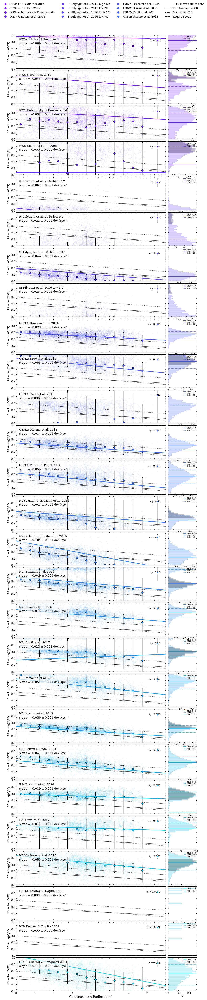

Wrote all-indicator metallicity gradient multipanel: PAPER_PLOTS/summed_map/dig_subtracted/metallicity_calibrations/M33_metallicity_calibrations_all_indicators_multipanel.png


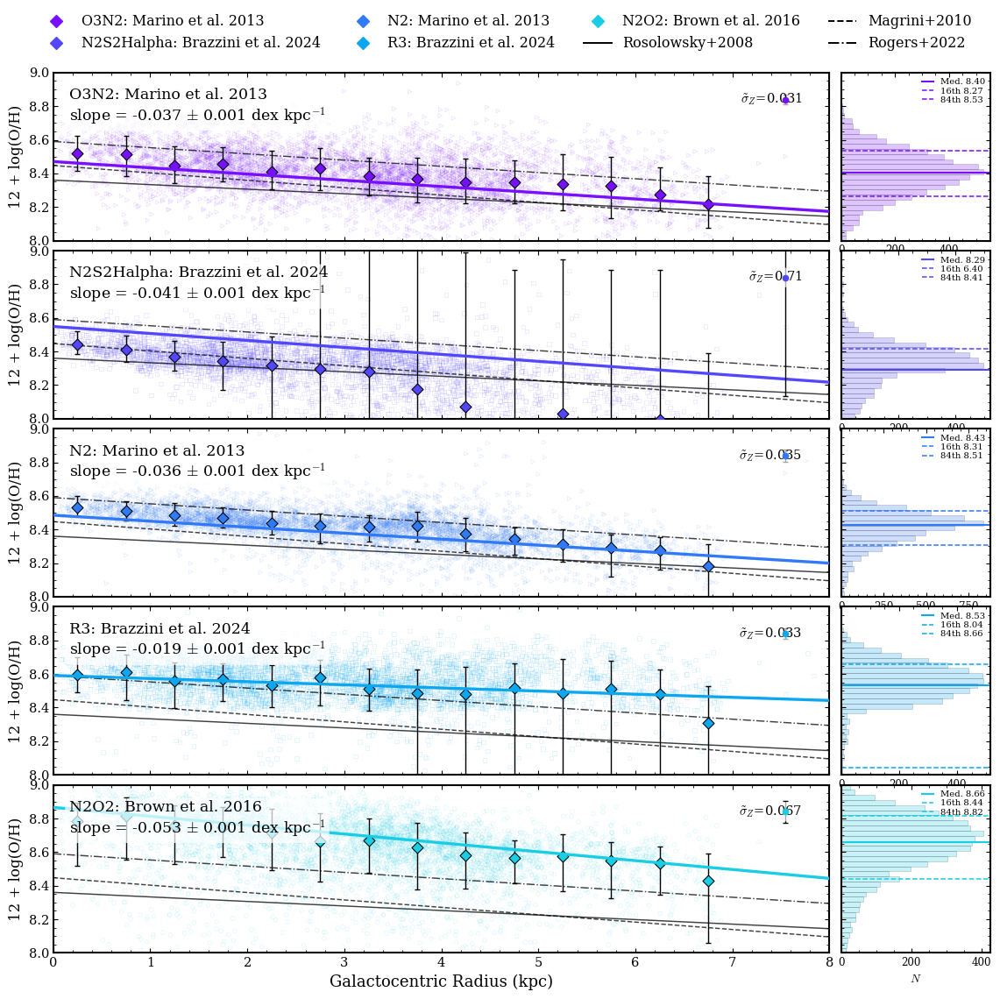

Wrote paper metallicity gradient multipanel: PAPER_PLOTS/summed_map/dig_subtracted/metallicity_calibrations/M33_metallicity_calibrations_paper_multipanel.png
Updated compatibility metallicity multipanel alias: PAPER_PLOTS/summed_map/dig_subtracted/metallicity_calibrations/M33_metallicity_calibrations_multipanel.png
Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.


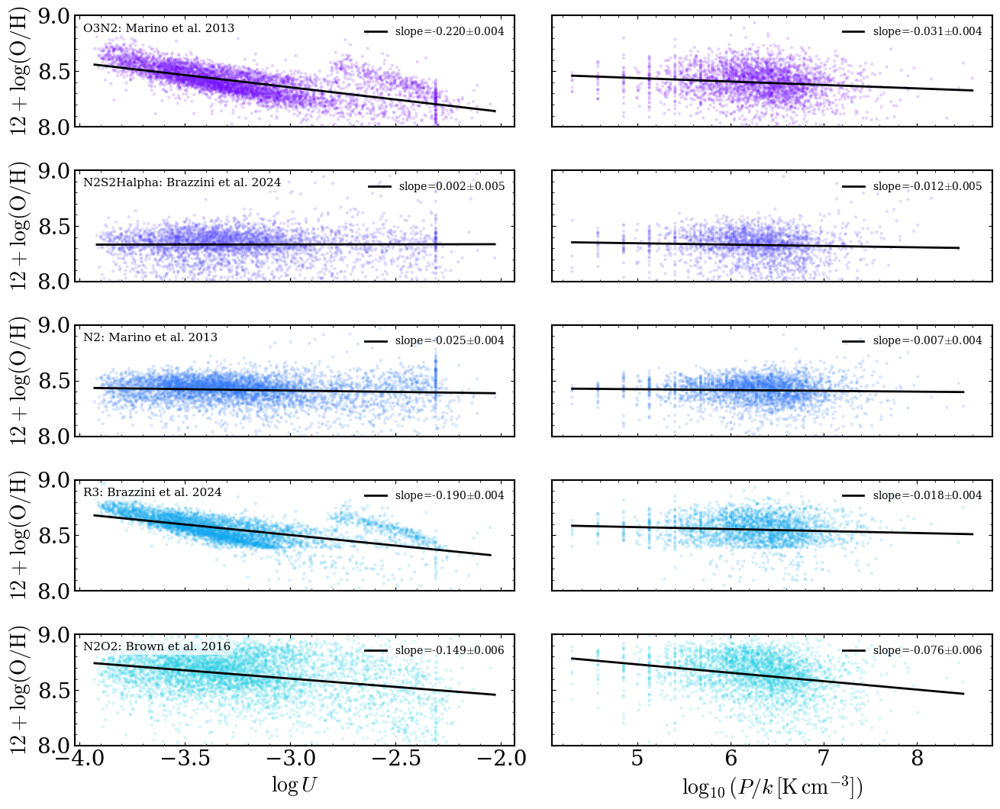

Wrote metallicity versus logU/pressure grid: PAPER_PLOTS/summed_map/dig_subtracted/metallicity_calibrations/M33_metallicity_vs_logU_pressure_grid.png


In [36]:
metallicity_all_multipanel_path, metallicity_all_multipanel_axes, metallicity_all_multipanel_hist_axes = plot_metallicity_calibration_multipanel(
    calibrations,
    style_map,
    cat['R_gal_kpc'],
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_calibrations_all_indicators_multipanel.png',
)
print(f'Wrote all-indicator metallicity gradient multipanel: {metallicity_all_multipanel_path}')

metallicity_paper_multipanel_path, metallicity_paper_multipanel_axes, metallicity_paper_multipanel_hist_axes = plot_metallicity_calibration_multipanel(
    calibrations,
    style_map,
    cat['R_gal_kpc'],
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_calibrations_paper_multipanel.png',
    selected_columns=PAPER_METALLICITY_SELECTION,
)
print(f'Wrote paper metallicity gradient multipanel: {metallicity_paper_multipanel_path}')

metallicity_multipanel_alias_path = paper_plot_path(
    'M33_metallicity_calibrations_multipanel.png',
    subdir='metallicity_calibrations',
)
shutil.copyfile(metallicity_paper_multipanel_path, metallicity_multipanel_alias_path)
print(f'Updated compatibility metallicity multipanel alias: {metallicity_multipanel_alias_path}')
print('Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.')


metallicity_logu_pressure_grid_path, _ = plot_metallicity_vs_ionization_pressure_grid(
    cat,
    calibrations,
    style_map,
    selected_columns=PAPER_METALLICITY_SELECTION,
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_vs_logU_pressure_grid.png',
)
print(f'Wrote metallicity versus logU/pressure grid: {metallicity_logu_pressure_grid_path}')


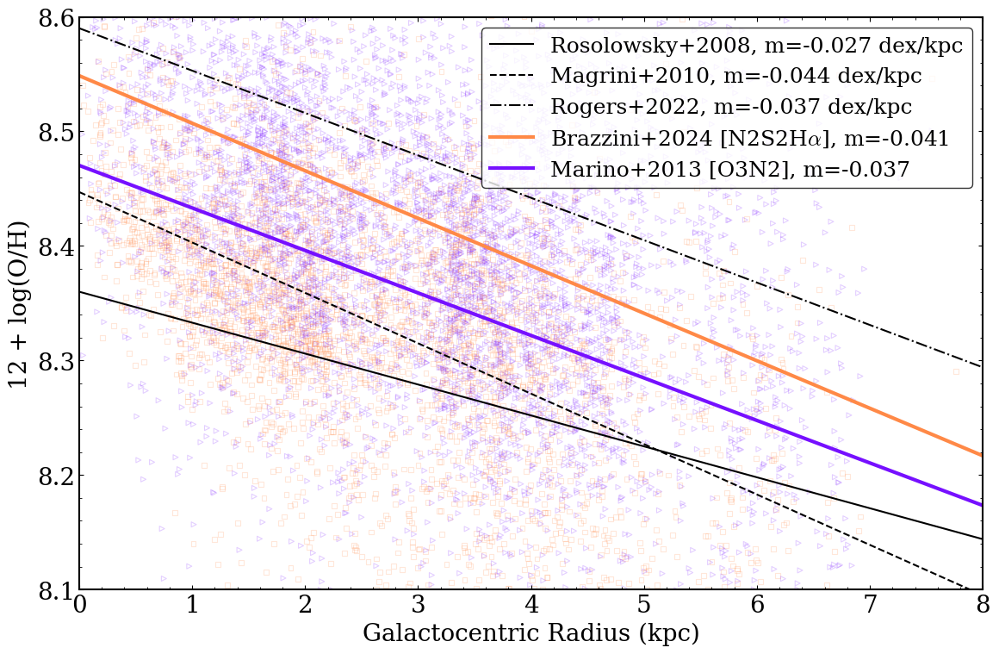

Selected calibrations for presentation panel:
  clean_label line_group   slope  intercept  n_points  rms_to_ref_mean  rms_to_closest_ref
Brazzini+2024 N2S2Halpha -0.0415     8.5485      5509           0.0623              0.0602
  Marino+2013       O3N2 -0.0371     8.4702      5455           0.0026              0.0533
Wrote metallicity gradient slope table: PAPER_PLOTS/summed_map/dig_subtracted/tables/metallicity_gradient_slopes.tex
Wrote metallicity gradient slope CSV: PAPER_PLOTS/summed_map/dig_subtracted/tables/metallicity_gradient_slopes.csv


In [37]:
# Presentation-only panel: compare selected calibrations to literature M33 gradients.

def _clean_calibration_label(label):
    return label.replace(' et al. ', '+').replace('\\&', '&')


def _metallicity_linear_fit_with_errors(x, y, yerr=None):
    """Match fit_line_and_plot's weighted/unweighted linear fit and return errors where possible."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    if yerr is None:
        yerr = np.full_like(y, np.nan, dtype=float)
    else:
        yerr = np.asarray(yerr, dtype=float)

    ok = np.isfinite(x) & np.isfinite(y)
    x = x[ok]
    y = y[ok]
    yerr = yerr[ok]
    if len(x) < 2:
        return np.nan, np.nan, np.nan, np.nan

    good_err = np.isfinite(yerr) & (yerr > 0)
    x_fit = x[good_err] if good_err.sum() >= 2 else x
    y_fit = y[good_err] if good_err.sum() >= 2 else y
    weights = 1.0 / yerr[good_err] if good_err.sum() >= 2 else None

    if len(x_fit) < 2:
        return np.nan, np.nan, np.nan, np.nan

    m, b = np.polyfit(x_fit, y_fit, 1, w=weights)
    slope_err = np.nan
    intercept_err = np.nan
    if len(x_fit) > 2:
        try:
            _coeff, cov = np.polyfit(x_fit, y_fit, 1, w=weights, cov=True)
            slope_err = float(np.sqrt(cov[0, 0]))
            intercept_err = float(np.sqrt(cov[1, 1]))
        except Exception:
            reg = linregress(x_fit, y_fit)
            slope_err = reg.stderr
            intercept_err = reg.intercept_stderr
    return float(m), float(b), float(slope_err), float(intercept_err)


def summarize_calibration_matches(calibrations, R_gal, fit_range=(0, 8), min_points=30):
    x = np.asarray(R_gal, dtype=float)
    xgrid = np.linspace(fit_range[0], fit_range[1], 300)
    ref_stack = np.vstack([g['b'] + g['m'] * xgrid for g in literature_gradients])
    ref_mean = np.nanmean(ref_stack, axis=0)
    rows = []

    for item in calibrations:
        arr, err, label, grp = item[:4]
        y = np.asarray(arr, dtype=float)
        yerr = np.asarray(err, dtype=float) if err is not None else np.full_like(y, np.nan, dtype=float)
        mask = np.isfinite(x) & np.isfinite(y) & (x >= fit_range[0]) & (x <= fit_range[1])
        if mask.sum() < min_points:
            continue

        m, b, m_err, b_err = _metallicity_linear_fit_with_errors(x[mask], y[mask], yerr[mask])
        if not (np.isfinite(m) and np.isfinite(b)):
            continue

        model = m * xgrid + b
        rms_to_ref_mean = np.sqrt(np.mean((model - ref_mean) ** 2))
        rms_to_closest_ref = min(
            np.sqrt(np.mean((model - (g['b'] + g['m'] * xgrid)) ** 2))
            for g in literature_gradients
        )

        rows.append(dict(
            label=label,
            clean_label=_clean_calibration_label(label),
            line_group=grp,
            slope=m,
            slope_stderr=m_err,
            intercept=b,
            intercept_stderr=b_err,
            n_points=int(mask.sum()),
            rms_to_ref_mean=rms_to_ref_mean,
            rms_to_closest_ref=rms_to_closest_ref,
        ))

    return pd.DataFrame(rows).sort_values(['line_group', 'clean_label']).reset_index(drop=True)


def plot_m33_metallicity_presentation_panel(calibrations, style_map, R_gal, fit_range=(0, 8), save_subdir='presentation', filename='M33_metallicity_gradient_presentation_panel.png', show=True):
    summary = summarize_calibration_matches(calibrations, R_gal, fit_range=fit_range, min_points=30)
    selected_specs = [
        ('Brazzini et al. 2024', 'N2S2Halpha', r'Brazzini+2024 [N2S2H$\alpha$]'),
        ('Marino et al. 2013', 'O3N2', 'Marino+2013 [O3N2]'),
    ]
    presentation_colors = {
        ('Brazzini et al. 2024', 'N2S2Halpha'): plt.cm.rainbow(0.82),
        ('Marino et al. 2013', 'O3N2'): plt.cm.rainbow(0.02),
    }
    selected_rows = []
    for label, grp, plot_label in selected_specs:
        match = summary.loc[(summary['label'] == label) & (summary['line_group'] == grp)].copy()
        if match.empty:
            continue
        match['plot_label'] = plot_label
        selected_rows.append(match.iloc[[0]])
    if not selected_rows:
        raise RuntimeError('None of the requested presentation calibrations were available in the current catalog.')
    selected = pd.concat(selected_rows, ignore_index=True)

    x = np.asarray(R_gal, dtype=float)
    xgrid = np.linspace(fit_range[0], fit_range[1], 300)
    fig, ax = plt.subplots(figsize=(12, 8))

    for g in literature_gradients:
        ax.plot(xgrid, g['b'] + g['m'] * xgrid, color='k', 
                linestyle=g['ls'], linewidth=1.5, label=f"{g['label']}, m={g['m']:.3f} dex/kpc")

    selected_keys = {(row.label, row.line_group) for row in selected.itertuples(index=False)}
    for item in calibrations:
        arr, err, label, grp = item[:4]
        if (label, grp) not in selected_keys:
            continue

        row = selected.loc[(selected['label'] == label) & (selected['line_group'] == grp)].iloc[0]
        pid = extract_paper_id(label)
        st = style_map[pid]
        plot_color = presentation_colors.get((label, grp), st['color'])
        y = np.asarray(arr, dtype=float)
        mask = np.isfinite(x) & np.isfinite(y) & (x >= fit_range[0]) & (x <= fit_range[1])
        if mask.sum() == 0:
            continue

        ax.scatter(
            x[mask], y[mask],
            s=18, alpha=0.2,
            facecolors='none', edgecolors=plot_color, marker=st['marker'], linewidths=0.8,
        )
        ax.plot(
            xgrid, row['slope'] * xgrid + row['intercept'],
            color=plot_color, linewidth=3.0,
            label=f"{row['plot_label']}, m={row['slope']:.3f}",
        )

    ax.set_xlabel('Galactocentric Radius (kpc)')
    ax.set_ylabel('12 + log(O/H)')
    ax.set_xlim(fit_range)
    ax.set_ylim(8.1, 8.6)
    ax.minorticks_on()
    ax.legend(fontsize=18, loc='upper right', frameon=True, edgecolor='black', facecolor='white')
    # ax.set_title('M33 metallicity gradients: literature vs selected calibrations')
    fig.tight_layout()
    fig.savefig(
        paper_plot_path(filename, subdir=save_subdir),
        dpi=300,
        bbox_inches='tight'
    )
    if show:
        plt.show()
    else:
        plt.close(fig)

    display_cols = ['clean_label', 'line_group', 'slope', 'intercept', 'n_points', 'rms_to_ref_mean', 'rms_to_closest_ref']
    print('Selected calibrations for presentation panel:')
    print(selected[display_cols].round({'slope': 4, 'intercept': 4, 'rms_to_ref_mean': 4, 'rms_to_closest_ref': 4}).to_string(index=False))
    return selected, summary


presentation_selected, presentation_summary = plot_m33_metallicity_presentation_panel(
    calibrations,
    style_map,
    cat['R_gal_kpc'],
    fit_range=(0, 8),
)


def _latex_escape_table_value(value):
    text = str(value)
    replacements = {
        '\\': r'\textbackslash{}',
        '&': r'\&',
        '%': r'\%',
        '$': r'\$',
        '#': r'\#',
        '_': r'\_',
        '{': r'\{',
        '}': r'\}',
    }
    for old, new in replacements.items():
        text = text.replace(old, new)
    return text


def write_metallicity_gradient_table(summary, filename='metallicity_gradient_slopes.tex'):
    table = summary[['line_group', 'clean_label', 'slope', 'slope_stderr']].copy()
    table = table.rename(columns={
        'line_group': 'Indicator',
        'clean_label': 'Reference',
        'slope': 'Slope',
        'slope_stderr': 'Slope error',
    })
    table = table.sort_values(['Indicator', 'Reference']).reset_index(drop=True)

    lines = [
        r'\begin{table}',
        r'\centering',
        r'\caption{Metallicity radial-gradient slopes for each calibration. Slopes are fit over $0<R_{\rm gal}<8$ kpc and have units of dex kpc$^{-1}$.}',
        r'\label{tab:metallicity_gradient_slopes}',
        r'\begin{tabular}{llrr}',
        r'\hline',
        r'Indicator & Reference & Slope & Slope error \\',
        r'\hline',
    ]
    last_indicator = None
    for _, row in table.iterrows():
        indicator_value = row['Indicator']
        indicator = _latex_escape_table_value(indicator_value)
        reference = _latex_escape_table_value(row['Reference'])
        if last_indicator is not None and indicator_value != last_indicator:
            lines.append(r'\hline')
        slope_value = row['Slope']
        slope_err_value = row['Slope error']
        slope = f'{slope_value:.4f}' if np.isfinite(slope_value) else r'\nodata'
        slope_err = f'{slope_err_value:.4f}' if np.isfinite(slope_err_value) else r'\nodata'
        lines.append(f'{indicator} & {reference} & {slope} & {slope_err} ' + r'\\')
        last_indicator = indicator_value
    lines.extend([
        r'\hline',
        r'\end{tabular}',
        r'\end{table}',
        '',
    ])

    table_path = paper_plot_path(filename, subdir='tables')
    table_path.write_text('\n'.join(lines), encoding='utf-8')
    csv_path = paper_plot_path(filename.replace('.tex', '.csv'), subdir='tables')
    table.to_csv(csv_path, index=False)
    print(f'Wrote metallicity gradient slope table: {table_path}')
    print(f'Wrote metallicity gradient slope CSV: {csv_path}')
    return table_path, csv_path, table


metallicity_gradient_table_path, metallicity_gradient_csv_path, metallicity_gradient_table = write_metallicity_gradient_table(presentation_summary)


In [38]:
# Star-forming, high-SNR-only metallicity calibration plots.
if 'all_lines_snr_mask' not in globals():
    def all_lines_snr_mask(df, snr_cut=3.0):
        snr_cols = [
            'SNR_Halpha_sum',
            'SNR_Hbeta_sum',
            'SNR_[OIII]5007_sum',
            'SNR_[SII]6716_sum',
            'SNR_[NII]6583_sum',
        ]
        missing = [col for col in snr_cols if col not in df.columns]
        if missing:
            raise KeyError(f'Missing SNR columns required for star-forming-only plots: {missing}')
        mask = np.ones(len(df), dtype=bool)
        for col in snr_cols:
            mask &= pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float) > snr_cut
        return mask

if 'cat_starforming_snrthree' not in globals():
    starforming_snrthree_mask = (
        (cat['BPT_class_sum_dered'] == 'Star-forming') &
        all_lines_snr_mask(cat, snr_cut=3.0)
    )
    cat_starforming_snrthree = cat.loc[starforming_snrthree_mask].copy().reset_index(drop=True)

sf_calibrations = build_metallicity_calibrations(cat_starforming_snrthree)
sf_style_map = build_style_map(sf_calibrations)

sf_metallicity_all_multipanel_path, sf_metallicity_all_multipanel_axes, sf_metallicity_all_multipanel_hist_axes = plot_metallicity_calibration_multipanel(
    sf_calibrations,
    sf_style_map,
    cat_starforming_snrthree['R_gal_kpc'],
    save_subdir='star_forming_only/metallicity_calibrations',
    filename='M33_metallicity_calibrations_all_indicators_multipanel.png',
    show=False,
)
print(f'Wrote star-forming all-indicator metallicity gradient multipanel: {sf_metallicity_all_multipanel_path}')

sf_metallicity_paper_multipanel_path, sf_metallicity_paper_multipanel_axes, sf_metallicity_paper_multipanel_hist_axes = plot_metallicity_calibration_multipanel(
    sf_calibrations,
    sf_style_map,
    cat_starforming_snrthree['R_gal_kpc'],
    save_subdir='star_forming_only/metallicity_calibrations',
    filename='M33_metallicity_calibrations_paper_multipanel.png',
    selected_columns=PAPER_METALLICITY_SELECTION,
    show=False,
)
print(f'Wrote star-forming paper metallicity gradient multipanel: {sf_metallicity_paper_multipanel_path}')

sf_metallicity_multipanel_alias_path = sf_plot_path(
    'M33_metallicity_calibrations_multipanel.png',
    subdir='metallicity_calibrations',
)
shutil.copyfile(sf_metallicity_paper_multipanel_path, sf_metallicity_multipanel_alias_path)
print(f'Updated star-forming compatibility metallicity multipanel alias: {sf_metallicity_multipanel_alias_path}')
print('Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.')

sf_presentation_selected, sf_presentation_summary = plot_m33_metallicity_presentation_panel(
    sf_calibrations,
    sf_style_map,
    cat_starforming_snrthree['R_gal_kpc'],
    fit_range=(0, 8),
    save_subdir='star_forming_only/presentation',
    filename='M33_metallicity_gradient_presentation_panel.png',
    show=False,
)


sf_metallicity_logu_pressure_grid_path, _ = plot_metallicity_vs_ionization_pressure_grid(
    cat_starforming_snrthree,
    sf_calibrations,
    sf_style_map,
    selected_columns=PAPER_METALLICITY_SELECTION,
    save_subdir='star_forming_only/metallicity_calibrations',
    filename='M33_metallicity_vs_logU_pressure_grid.png',
    show=False,
)
print(f'Wrote star-forming metallicity versus logU/pressure grid: {sf_metallicity_logu_pressure_grid_path}')


13 unique papers found.
Wrote star-forming all-indicator metallicity gradient multipanel: PAPER_PLOTS/summed_map/dig_subtracted/star_forming_only/metallicity_calibrations/M33_metallicity_calibrations_all_indicators_multipanel.png
Wrote star-forming paper metallicity gradient multipanel: PAPER_PLOTS/summed_map/dig_subtracted/star_forming_only/metallicity_calibrations/M33_metallicity_calibrations_paper_multipanel.png
Updated star-forming compatibility metallicity multipanel alias: PAPER_PLOTS/summed_map/dig_subtracted/star_forming_only/metallicity_calibrations/M33_metallicity_calibrations_multipanel.png
Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.
Selected calibrations for presentation panel:
  clean_label line_group   slope  intercept  n_points  rms_to_ref_mean  rms_to_closest_ref
Brazzini+2024 N2S2Halpha -0.0428      8.555      3590           0.0642              0.0596
  Marino+2013       O3N2 -0.0378      8.477      3610   

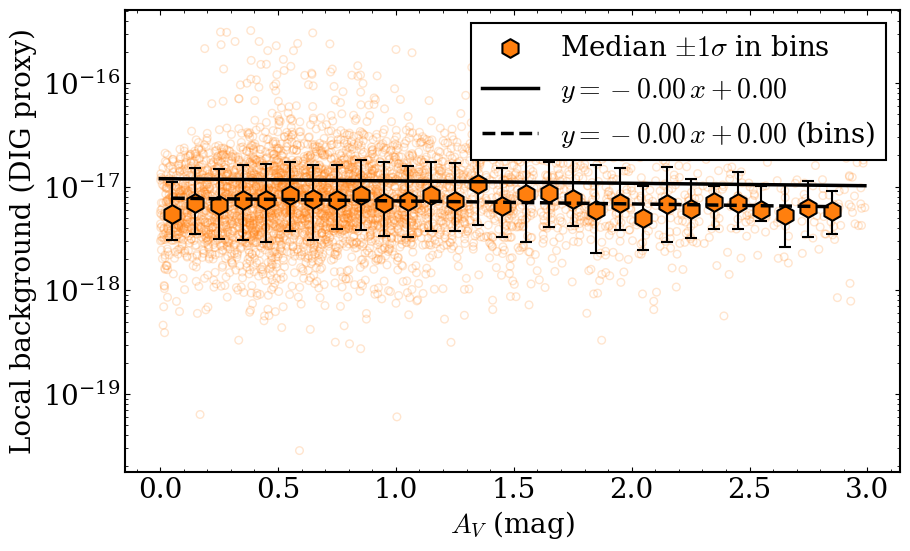

{'bin_centers': array([0.05, 0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95, 1.05,
        1.15, 1.25, 1.35, 1.45, 1.55, 1.65, 1.75, 1.85, 1.95, 2.05, 2.15,
        2.25, 2.35, 2.45, 2.55, 2.65, 2.75, 2.85]),
 'medians': array([5.48030307e-18, 6.93744002e-18, 6.72301584e-18, 7.42753757e-18,
        7.43773923e-18, 8.38190904e-18, 7.54803966e-18, 7.39834503e-18,
        8.22794299e-18, 6.94388545e-18, 7.30999894e-18, 8.30831970e-18,
        7.25982108e-18, 1.05304321e-17, 6.47607113e-18, 8.47859603e-18,
        8.77617351e-18, 7.63347726e-18, 5.90123851e-18, 6.95119310e-18,
        5.02586150e-18, 6.75802365e-18, 6.04917114e-18, 7.18118228e-18,
        6.88287938e-18, 5.93791107e-18, 5.35473892e-18, 6.17971378e-18,
        5.81982131e-18]),
 'lower_errs': array([3.05125818e-18, 3.50258666e-18, 3.09730389e-18, 3.05874347e-18,
        2.92634742e-18, 3.75792538e-18, 3.06760538e-18, 3.88530572e-18,
        3.81925542e-18, 3.37144429e-18, 3.23370164e-18, 3.74293551e-18,
        3.7266

In [39]:
# plot DIG level vs Av
sel = (cat['sum_A_V'] < 3) & (cat['sum_A_V'] > 0) & np.isfinite(cat['sum_A_V']) & np.isfinite(cat['bg_local'])
# plt.scatter(cat['sum_A_V'][sel], cat['bg_local'][sel], alpha=0.2, s=10, color='C1')
# plt.yscale('log')

plot_radial_gradient(
    cat=cat,
    xcol='sum_A_V',
    ycol='bg_local',
    mask=sel,
    bins=np.arange(0, 3, 0.1),
    color='C1',
    xlabel=r'$A_V$ (mag)',
    ylabel='Local background (DIG proxy)',
    yscale='log',
    alpha=0.2,
    savepath=str(paper_plot_path('M33_HII_bg_local_vs_Av.png', subdir='dig_diagnostics'))
)


In [40]:
# Multi-panel cutout plot for one example region with configurable line-ratio / line-map panels.

INTRINSIC_HA_HB_MAP = 2.86
R_V_MAP = 3.1


def ccm89_k_lambda_map(wave_angstrom, R_V=3.1):
    wave_micron = wave_angstrom * 1e-4
    x = 1.0 / wave_micron
    y = x - 1.82
    a = (
        1
        + 0.17699 * y
        - 0.50447 * y**2
        - 0.02427 * y**3
        + 0.72085 * y**4
        + 0.01979 * y**5
        - 0.77530 * y**6
        + 0.32999 * y**7
    )
    b = (
        1.41338 * y
        + 2.28305 * y**2
        + 1.07233 * y**3
        - 5.38434 * y**4
        - 0.62251 * y**5
        + 5.30260 * y**6
        - 2.09002 * y**7
    )
    return a * R_V + b


LINE_WAVELENGTHS_REGION = {
    'Hbflux': 4861.0,
    'OIII4959flux': 4959.0,
    'OIII5007flux': 5007.0,
    'Haflux': 6563.0,
    'NII6548flux': 6548.0,
    'NII6584flux': 6584.0,
    'NII6583flux': 6584.0,
    'SII6716flux': 6716.0,
    'SII6731flux': 6731.0,
    'OII3727flux': 3727.0,
}


def _normalize_region_identifier(field, region_id):
    field = str(field)
    if isinstance(region_id, str):
        rid = region_id.strip()
        if '_' in rid:
            region_label = int(rid.split('_')[-1])
            return rid, region_label
        region_label = int(float(rid))
        return f"{field}_{region_label:04d}", region_label
    region_label = int(region_id)
    return f"{field}_{region_label:04d}", region_label



def _sum_maps_from_spec(field, line_names, maps_dir, scale=1e-17, cache=None):
    if isinstance(line_names, (str, bytes)):
        line_names = [line_names]
    else:
        line_names = list(line_names)

    arrays = []
    for line_name in line_names:
        key = (field, line_name, scale)
        if cache is not None and key in cache:
            data = cache[key]
        else:
            map_path = Path(maps_dir) / f"M33-{field}" / f"M33{field}-{line_name}.fits"
            if not map_path.exists():
                raise FileNotFoundError(f"Missing map for {field} {line_name}: {map_path}")
            data = fits.getdata(map_path).astype(float)
            data = np.where(np.isfinite(data), data / scale, np.nan)
            if cache is not None:
                cache[key] = data
        arrays.append(data)

    return np.nansum(np.stack(arrays, axis=0), axis=0)



def _compute_ebv_map(field, maps_dir, cache=None, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    cache_key = ('EBV', field, intrinsic_ha_hb, R_V)
    if cache is not None and cache_key in cache:
        return cache[cache_key]

    ha = _sum_maps_from_spec(field, 'Haflux', maps_dir=maps_dir, cache=cache)
    hb = _sum_maps_from_spec(field, 'Hbflux', maps_dir=maps_dir, cache=cache)

    k_ha = ccm89_k_lambda_map(6563.0, R_V=R_V)
    k_hb = ccm89_k_lambda_map(4861.0, R_V=R_V)
    delta_k = k_hb - k_ha

    with np.errstate(divide='ignore', invalid='ignore'):
        ratio = ha / hb
        ebv = (2.5 / delta_k) * np.log10(ratio / intrinsic_ha_hb)

    good = np.isfinite(ha) & np.isfinite(hb) & (ha > 0) & (hb > 0)
    ebv = np.where(good, ebv, np.nan)
    ebv = np.where(np.isfinite(ebv), np.clip(ebv, 0, None), np.nan)

    if cache is not None:
        cache[cache_key] = ebv
    return ebv



def _deredden_single_line_map(field, line_name, maps_dir, cache=None, scale=1e-17, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    wave = LINE_WAVELENGTHS_REGION.get(line_name)
    if wave is None:
        raise KeyError(f"No wavelength mapping configured for line {line_name}")

    flux_map = _sum_maps_from_spec(field, line_name, maps_dir=maps_dir, scale=scale, cache=cache)
    ebv_map = _compute_ebv_map(field, maps_dir=maps_dir, cache=cache, intrinsic_ha_hb=intrinsic_ha_hb, R_V=R_V)
    k_line = ccm89_k_lambda_map(wave, R_V=R_V)
    correction = 10.0 ** (0.4 * ebv_map * k_line)

    with np.errstate(invalid='ignore'):
        flux_map_dered = flux_map * correction
    flux_map_dered = np.where(np.isfinite(flux_map), flux_map_dered, np.nan)
    return flux_map_dered



def _sum_dereddened_maps(field, line_names, maps_dir, cache=None, scale=1e-17, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    if isinstance(line_names, (str, bytes)):
        line_names = [line_names]
    else:
        line_names = list(line_names)

    arrays = [
        _deredden_single_line_map(
            field,
            line_name,
            maps_dir=maps_dir,
            cache=cache,
            scale=scale,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
        for line_name in line_names
    ]
    return np.nansum(np.stack(arrays, axis=0), axis=0)



def _build_flux_map(field, line_names, maps_dir, cache=None, scale=1e-17, deredden=False, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    if deredden:
        return _sum_dereddened_maps(
            field,
            line_names,
            maps_dir=maps_dir,
            cache=cache,
            scale=scale,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
    return _sum_maps_from_spec(field, line_names, maps_dir=maps_dir, scale=scale, cache=cache)



def _make_region_panel_map(field, panel_spec, maps_dir, cache=None):
    kind = panel_spec.get('kind', 'ratio').lower()
    use_deredden = panel_spec.get('deredden', False)
    intrinsic_ha_hb = panel_spec.get('intrinsic_ha_hb', INTRINSIC_HA_HB_MAP)
    R_V = panel_spec.get('R_V', R_V_MAP)

    if kind == 'ratio':
        numerator = _build_flux_map(
            field,
            panel_spec['numerator_lines'],
            maps_dir=maps_dir,
            scale=panel_spec.get('numerator_scale', 1e-17),
            cache=cache,
            deredden=use_deredden,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
        denominator = _build_flux_map(
            field,
            panel_spec['denominator_lines'],
            maps_dir=maps_dir,
            scale=panel_spec.get('denominator_scale', 1e-17),
            cache=cache,
            deredden=use_deredden,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )

        min_num = panel_spec.get('min_num')
        min_den = panel_spec.get('min_den')
        if min_num is not None:
            numerator = np.where(numerator >= min_num, numerator, np.nan)
        if min_den is not None:
            denominator = np.where(denominator >= min_den, denominator, np.nan)

        with np.errstate(divide='ignore', invalid='ignore'):
            image = numerator / denominator
        image = np.where(np.isfinite(image), image, np.nan)

        if panel_spec.get('log10', True):
            image = np.where(image > 0, image, np.nan)
            with np.errstate(divide='ignore', invalid='ignore'):
                image = np.log10(image)

    elif kind == 'line':
        image = _build_flux_map(
            field,
            panel_spec['lines'],
            maps_dir=maps_dir,
            scale=panel_spec.get('flux_scale', 1e-17),
            cache=cache,
            deredden=use_deredden,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
        min_flux = panel_spec.get('min_flux')
        if min_flux is not None:
            image = np.where(image >= min_flux, image, np.nan)
        if panel_spec.get('log10', False):
            image = np.where(image > 0, image, np.nan)
            with np.errstate(divide='ignore', invalid='ignore'):
                image = np.log10(image)
    else:
        raise ValueError(f"Unsupported panel kind: {kind}")

    finite_clip = panel_spec.get('finite_clip')
    if finite_clip is not None:
        lo, hi = finite_clip
        image = np.where((image >= lo) & (image <= hi), image, np.nan)

    return image



def plot_region_multipanel_maps(
    field,
    region_id,
    panel_specs,
    *,
    maps_dir='../M33-Maps-Calibrated',
    zoi_dir='ZOI_maps/ZOI_map_100pc',
    boundary_dir='Boundary_maps/Boundary_map_100pc',
    boundary_metrics_pattern='Boundary_metrics_{field}.csv',
    zoi_pattern='ZoI_map_{field}.fits',
    boundary_pattern='Boundary_map_{field}.fits',
    ncols=3,
    half_size=None,
    pad_px=5,
    peak_marker_kwargs=None,
    zoi_contour_kwargs=None,
    boundary_contour_kwargs=None,
    show_colorbars=False,
    output_path=None,
    dpi=300,
    suptitle=None,
):
    region_name, region_label = _normalize_region_identifier(field, region_id)

    metrics_path = Path(boundary_dir) / boundary_metrics_pattern.format(field=field)
    if not metrics_path.exists():
        raise FileNotFoundError(f"Missing boundary metrics file: {metrics_path}")
    metrics_df = pd.read_csv(metrics_path)
    reg = metrics_df.loc[metrics_df['region_id'].astype(str) == region_name]
    if len(reg) != 1:
        raise ValueError(f"Could not find unique region {region_name} in {metrics_path}")
    reg = reg.iloc[0]

    cx = float(reg['center_x_px'])
    cy = float(reg['center_y_px'])
    contour_label = int(reg.get('zoi_center_label', region_label))

    zoi_path = Path(zoi_dir) / zoi_pattern.format(field=field)
    boundary_path = Path(boundary_dir) / boundary_pattern.format(field=field)
    if not zoi_path.exists():
        raise FileNotFoundError(f"Missing ZoI map: {zoi_path}")
    if not boundary_path.exists():
        raise FileNotFoundError(f"Missing boundary map: {boundary_path}")

    zoi_map = fits.getdata(zoi_path)
    boundary_map = fits.getdata(boundary_path)

    zoi_mask = np.asarray(zoi_map == contour_label)
    boundary_mask = np.asarray(boundary_map == contour_label)
    if not np.any(zoi_mask):
        raise ValueError(f"Region {region_name} has no ZoI pixels in {zoi_path}")
    if not np.any(boundary_mask):
        raise ValueError(f"Region {region_name} has no boundary pixels in {boundary_path}")

    if half_size is None:
        radius_guess = reg.get('radius_p84_px_after_carve', np.nan)
        if not np.isfinite(radius_guess):
            radius_guess = reg.get('radius_p84_px', np.nan)
        if not np.isfinite(radius_guess):
            radius_guess = reg.get('radius_areaeq_px_after_carve', np.nan)
        if not np.isfinite(radius_guess):
            radius_guess = 35.0
        half_size = int(np.ceil(max(60, 2.25 * float(radius_guess))))

    shape = zoi_mask.shape
    x0 = max(0, int(np.floor(cx - half_size - pad_px)))
    x1 = min(shape[1], int(np.ceil(cx + half_size + pad_px + 1)))
    y0 = max(0, int(np.floor(cy - half_size - pad_px)))
    y1 = min(shape[0], int(np.ceil(cy + half_size + pad_px + 1)))

    peak_x = cx - x0
    peak_y = cy - y0

    if peak_marker_kwargs is None:
        peak_marker_kwargs = dict(marker='+', s=70, linewidths=1.8, color='k')
    if zoi_contour_kwargs is None:
        zoi_contour_kwargs = dict(colors='k', linewidths=1.2, linestyles='--')
    if boundary_contour_kwargs is None:
        boundary_contour_kwargs = dict(colors='black', linewidths=2.5)

    map_cache = {}
    n_panels = len(panel_specs)
    ncols = min(max(1, ncols), n_panels)
    nrows = int(np.ceil(n_panels / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.0 * ncols, 5.0 * nrows), squeeze=False)
    axes_flat = axes.ravel()

    for ax, spec in zip(axes_flat, panel_specs):
        panel_image = _make_region_panel_map(field, spec, maps_dir=maps_dir, cache=map_cache)
        cutout = panel_image[y0:y1, x0:x1]
        zoi_cutout = zoi_mask[y0:y1, x0:x1]
        boundary_cutout = boundary_mask[y0:y1, x0:x1]

        im = ax.imshow(
            cutout,
            origin='lower',
            cmap=spec.get('cmap', 'viridis'),
            vmin=spec.get('vmin'),
            vmax=spec.get('vmax'),
        )
        # ax.contour(zoi_cutout.astype(float), levels=[0.5], origin='lower', **zoi_contour_kwargs)
        ax.contour(boundary_cutout.astype(float), levels=[0.5], origin='lower', **boundary_contour_kwargs)
        ax.scatter([peak_x], [peak_y], **peak_marker_kwargs)

        # ax.set_title(spec.get('label', ''))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal')

        if show_colorbars:
            cbar = fig.colorbar(im, ax=ax, fraction=0.048, pad=0.0, orientation = 'horizontal')
            if spec.get('colorbar_label'):
                cbar.set_label(spec['colorbar_label'], fontsize = 15)

    for ax in axes_flat[n_panels:]:
        ax.axis('off')

    # if suptitle is None:
    #     suptitle = f"{region_name}: line-ratio and line-map cutouts"
    # fig.suptitle(suptitle, y=0.995)
    fig.tight_layout()

    if output_path is not None:
        output_path = Path(output_path)
        output_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(output_path, dpi=dpi, bbox_inches='tight')

    plt.close()
    return fig, axes


def _estimate_region_pixel_scale_pc(reg):
    candidate_pairs = [
        ('radius_areaeq_pc_after_carve', 'radius_areaeq_px_after_carve'),
        ('radius_p84_pc', 'radius_p84_px'),
        ('radius_areaeq_pc', 'radius_areaeq_px'),
        ('radius_p50_pc', 'radius_p50_px'),
        ('radius_p16_pc', 'radius_p16_px'),
    ]
    for pc_col, px_col in candidate_pairs:
        pc_val = reg.get(pc_col, np.nan)
        px_val = reg.get(px_col, np.nan)
        if np.isfinite(pc_val) and np.isfinite(px_val) and float(px_val) > 0:
            return float(pc_val) / float(px_val)
    raise ValueError('Could not infer a pc-per-pixel scale for this region from the boundary metrics table.')


def _make_panel_value_norm(values, panel_spec):
    finite = np.asarray(values, dtype=float)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        return mpl.colors.Normalize(vmin=0.0, vmax=1.0)

    vmin = panel_spec.get('vmin')
    vmax = panel_spec.get('vmax')
    if vmin is None:
        vmin = float(np.nanpercentile(finite, 5))
    if vmax is None:
        vmax = float(np.nanpercentile(finite, 95))
    if not np.isfinite(vmin):
        vmin = float(np.nanmin(finite))
    if not np.isfinite(vmax):
        vmax = float(np.nanmax(finite))
    if vmax <= vmin:
        vmax = vmin + 1e-6
    return mpl.colors.Normalize(vmin=vmin, vmax=vmax)


def plot_region_multipanel_radial_profiles(
    field,
    region_id,
    panel_specs,
    *,
    maps_dir='../M33-Maps-Calibrated',
    zoi_dir='ZOI_maps/ZOI_map_100pc',
    boundary_dir='Boundary_maps/Boundary_map_100pc',
    boundary_metrics_pattern='Boundary_metrics_{field}.csv',
    zoi_pattern='ZoI_map_{field}.fits',
    boundary_pattern='Boundary_map_{field}.fits',
    ncols=3,
    radial_bin_size_pc=None,
    min_points_per_bin=4,
    scatter_size=14,
    scatter_alpha=0.75,
    median_line_kwargs=None,
    show_colorbars=True,
    output_path=None,
    dpi=300,
    suptitle=None,
):
    region_name, region_label = _normalize_region_identifier(field, region_id)

    metrics_path = Path(boundary_dir) / boundary_metrics_pattern.format(field=field)
    if not metrics_path.exists():
        raise FileNotFoundError(f'Missing boundary metrics file: {metrics_path}')
    metrics_df = pd.read_csv(metrics_path)
    reg = metrics_df.loc[metrics_df['region_id'].astype(str) == region_name]
    if len(reg) != 1:
        raise ValueError(f'Could not find unique region {region_name} in {metrics_path}')
    reg = reg.iloc[0]

    cx = float(reg['center_x_px'])
    cy = float(reg['center_y_px'])
    contour_label = int(reg.get('zoi_center_label', region_label))
    pc_per_px = _estimate_region_pixel_scale_pc(reg)
    equal_area_radius_pc = reg.get('radius_areaeq_pc_after_carve', np.nan)
    if not np.isfinite(equal_area_radius_pc):
        equal_area_radius_pc = reg.get('radius_areaeq_pc', np.nan)

    zoi_path = Path(zoi_dir) / zoi_pattern.format(field=field)
    boundary_path = Path(boundary_dir) / boundary_pattern.format(field=field)
    if not zoi_path.exists():
        raise FileNotFoundError(f'Missing ZoI map: {zoi_path}')
    if not boundary_path.exists():
        raise FileNotFoundError(f'Missing boundary map: {boundary_path}')

    zoi_map = fits.getdata(zoi_path)
    boundary_map = fits.getdata(boundary_path)
    zoi_mask = np.asarray(zoi_map == contour_label)
    boundary_mask = np.asarray(boundary_map == contour_label)
    if not np.any(zoi_mask):
        raise ValueError(f'Region {region_name} has no ZoI pixels in {zoi_path}')
    if not np.any(boundary_mask):
        raise ValueError(f'Region {region_name} has no boundary pixels in {boundary_path}')

    yy, xx = np.indices(boundary_mask.shape, dtype=float)
    radius_pc_map = np.hypot(xx - cx, yy - cy) * pc_per_px

    if median_line_kwargs is None:
        median_line_kwargs = dict(color='k', linewidth=2.0)

    map_cache = {}
    n_panels = len(panel_specs)
    ncols = min(max(1, ncols), n_panels)
    nrows = int(np.ceil(n_panels / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.2 * ncols, 4.6 * nrows), squeeze=False)
    axes_flat = axes.ravel()

    for ax, spec in zip(axes_flat, panel_specs):
        panel_image = _make_region_panel_map(field, spec, maps_dir=maps_dir, cache=map_cache)
        valid = boundary_mask & np.isfinite(panel_image) & np.isfinite(radius_pc_map)

        if not np.any(valid):
            ax.text(0.5, 0.5, 'No finite values\nin boundary', ha='center', va='center', transform=ax.transAxes)
            ax.set_xlabel('Distance from peak (pc)')
            ax.set_ylabel(spec.get('colorbar_label', 'Value'))
            ax.grid(alpha=0.2, linewidth=0.6)
            continue

        radii_pc = radius_pc_map[valid].astype(float)
        values = panel_image[valid].astype(float)
        order = np.argsort(radii_pc)
        radii_pc = radii_pc[order]
        values = values[order]

        cmap_obj = plt.get_cmap(spec.get('cmap', 'viridis'))
        norm = _make_panel_value_norm(values, spec)
        scat = ax.scatter(
            radii_pc,
            values,
            c=values,
            cmap=cmap_obj,
            norm=norm,
            s=scatter_size,
            alpha=scatter_alpha,
            linewidths=0,
            rasterized=True,
        )

        rmax_pc = float(np.nanmax(radii_pc))
        if radial_bin_size_pc is None:
            n_bins = int(np.clip(np.sqrt(values.size), 12, 40))
            if rmax_pc <= 0:
                bin_edges = np.array([0.0, 1.0])
            else:
                bin_edges = np.linspace(0.0, rmax_pc, n_bins + 1)
        else:
            step_pc = max(float(radial_bin_size_pc), np.finfo(float).eps)
            upper_pc = max(rmax_pc, step_pc)
            bin_edges = np.arange(0.0, upper_pc + step_pc, step_pc)
            if bin_edges.size < 2:
                bin_edges = np.array([0.0, upper_pc])

        bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
        bin_index = np.clip(np.digitize(radii_pc, bin_edges) - 1, 0, len(bin_centers) - 1)
        medians = np.full(len(bin_centers), np.nan)
        counts = np.zeros(len(bin_centers), dtype=int)
        for idx in range(len(bin_centers)):
            in_bin = values[bin_index == idx]
            counts[idx] = in_bin.size
            if in_bin.size:
                medians[idx] = np.nanmedian(in_bin)
        good_bins = (counts >= int(min_points_per_bin)) & np.isfinite(medians)
        if np.any(good_bins):
            ax.plot(bin_centers[good_bins], medians[good_bins], **median_line_kwargs)

        x_upper = max(float(bin_edges[-1]), rmax_pc)
        if np.isfinite(equal_area_radius_pc):
            x_upper = max(x_upper, float(equal_area_radius_pc))
        ax.set_xlim(0.0, x_upper)
        y_lower = float(np.nanmin(values))
        y_upper = float(np.nanmax(values))
        if spec.get('vmin') is not None:
            y_lower = min(y_lower, float(spec['vmin']))
        if spec.get('vmax') is not None:
            y_upper = max(y_upper, float(spec['vmax']))
        if y_upper <= y_lower:
            y_pad = max(1e-6, 0.05 * max(abs(y_lower), 1.0))
        else:
            y_pad = 0.05 * (y_upper - y_lower)
        ax.set_ylim(y_lower - y_pad, y_upper + y_pad)
        if np.isfinite(equal_area_radius_pc):
            ax.axvline(float(equal_area_radius_pc), color='0.25', linestyle='--', linewidth=1.5)
        ax.set_xlabel('Distance from peak (pc)')
        ax.set_ylabel(spec.get('colorbar_label', 'Value'))
        ax.grid(alpha=0.2, linewidth=0.6)

        if show_colorbars:
            cbar = fig.colorbar(scat, ax=ax, fraction=0.048, pad=0.0, orientation='horizontal')
            if spec.get('colorbar_label'):
                cbar.set_label(spec['colorbar_label'], fontsize=15)

    for ax in axes_flat[n_panels:]:
        ax.axis('off')

    if suptitle is not None:
        fig.suptitle(suptitle, y=0.995)
    fig.tight_layout()

    if output_path is not None:
        output_path = Path(output_path)
        output_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(output_path, dpi=dpi, bbox_inches='tight')

    plt.close()
    return fig, axes

dered = True
DEFAULT_REGION_RATIO_PANEL_SPECS = [
    dict(
        kind='ratio',
        numerator_lines='OIII5007flux',
        denominator_lines='OII3727flux',
        colorbar_label=r'log([O III]/[O II])',
        cmap='BrBG_r',
        log10=True,
        deredden=dered,
        vmin=-1,
        vmax=0.5,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines='OIII5007flux',
        denominator_lines=['SII6716flux', 'SII6731flux'],
        colorbar_label=r'log([O III]/[S II])',
        cmap='PiYG_r',
        log10=True,
        deredden=dered,
        vmin=-1,
        vmax=1,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines='Haflux',
        denominator_lines='Hbflux',
        colorbar_label=r'H$\alpha$/H$\beta$',
        cmap='coolwarm',
        log10=False,
        deredden=False,
        vmin=2,
        vmax=5,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines='OIII5007flux',
        denominator_lines='Hbflux',
        colorbar_label=r'log([O III]/H$\beta$)',
        cmap='bwr_r',
        log10=True,
        deredden=dered,
        vmin=-1,
        vmax=1,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines=['SII6716flux', 'SII6731flux'],
        denominator_lines='Haflux',
        colorbar_label=r'log([S II]/H$\alpha$)',
        cmap='PuOr',
        log10=True,
        deredden=dered,
        vmin=-1.5,
        vmax=0.8,
        min_den=1e-3,
    ),
    
    dict(
        kind='ratio',
        numerator_lines='NII6584flux',
        denominator_lines='Haflux',
        colorbar_label=r'log(N II]/H$\alpha$)',
        cmap='PRGn',
        log10=True,
        deredden=dered,
        vmin=-1.5,
        vmax=0,
        min_den=1e-3,
    ),
    
    dict(
        kind='ratio',
        numerator_lines='SII6716flux',
        denominator_lines='SII6731flux',
        colorbar_label=r'[S II] 6716/[S II] 6731',
        cmap='plasma',
        log10=False,
        deredden=dered,
        vmin=1,
        vmax=1.45,
        min_den=1e-3,
    ),
]

DEFAULT_REGION_LINE_PANEL_SPECS = [
    # dict(kind='line', lines='OIII5007flux', label=r'log([O III] 5007 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    dict(kind='line', lines='Haflux', colorbar_label=r'log(H$\alpha$/$10^{-17}$erg s$^{-1}$cm$^{-2}$)', cmap='rainbow', log10=True, vmin=-1, vmax=2, deredden=False),
    # dict(kind='line', lines='Hbflux', label=r'log(H$\beta$ flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    # dict(kind='line', lines='NII6584flux', label=r'log([N II] 6584 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    # dict(kind='line', lines='OII3727flux', label=r'log([O II] 3727 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    # dict(kind='line', lines=['SII6716flux', 'SII6731flux'], label=r'log([S II] 6716, 6731 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
]


In [41]:
# Example figure: region NW_0824, matching the notebook 5 example region.
#
# By default these panels use Balmer-decrement dereddened flux maps for all panels
# except the observed Halpha/Hbeta panel.
# To add more panels, append specs from DEFAULT_REGION_LINE_PANEL_SPECS or add your own dict.
# Example:
region_panel_specs = list(DEFAULT_REGION_LINE_PANEL_SPECS)+ list(DEFAULT_REGION_RATIO_PANEL_SPECS)
# region_panel_specs.append(dict(
#     kind='ratio',
#     numerator_lines='NII6584flux',
#     denominator_lines='Haflux',
#     label=r'log([N II] 6584 / H$\alpha$), dered.',
#     cmap='coolwarm',
#     log10=True,
#     deredden=True,
#     vmin=-2,
#     vmax=0,
#     min_den=1e-3,
# ))

# region_panel_specs = list(DEFAULT_REGION_RATIO_PANEL_SPECS)

# ids = [100,200,300,400,500,600, 824]
ids = [850]
# ids = np.arange(840, 860)

for id in ids:
    # try:
    id = str(id)
    while len(id)<4:
        id='0'+id
    
    fig_region, axes_region = plot_region_multipanel_maps(
        field='NW',
        region_id=f'NW_{id}',
        panel_specs=region_panel_specs,
        ncols=4,
        output_path=str(paper_plot_path(f'NW_0{id}_region_ratio_panels_dered.png', subdir='region_panels')),
        suptitle=None,
        show_colorbars=True,
    )
    fig_profile, axes_profile = plot_region_multipanel_radial_profiles(
        field='NW',
        region_id=f'NW_{id}',
        panel_specs=region_panel_specs,
        ncols=4,
        output_path=str(paper_plot_path(f'NW_0{id}_region_ratio_radial_profiles_dered.png', subdir='region_profiles')),
        suptitle=None,
        show_colorbars=True,
    )
    print(id, ' sucess')
    # except:
    #     print(id, 'fail')


0850  sucess


In [42]:
str(paper_plot_path(f'NW_0{id}_region_ratio_radial_profiles_dered.png', subdir='region_profiles')),

('PAPER_PLOTS/summed_map/dig_subtracted/region_profiles/NW_00850_region_ratio_radial_profiles_dered.png',)